<a href="https://colab.research.google.com/github/2303A52012/Network-intrusion-dection-system/blob/main/GenAI_CourseProject_team07.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# data reading and preprossing

**importhing all the required lybs**

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
from sklearn.model_selection import train_test_split
from sklearn.preprocessing import StandardScaler , LabelEncoder , MinMaxScaler
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report, recall_score, precision_score, f1_score
from sklearn.utils import shuffle , resample
from sklearn.decomposition import PCA
from sklearn.datasets import load_iris
from sklearn.linear_model import Perceptron, LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectKBest, f_classif

**reading and printing data**

In [ ]:
data=pd.read_csv('/content/drive/MyDrive/final project/Train_data.csv')

In [ ]:
data

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate,class
0,0,tcp,ftp_data,SF,491,0,0,0,0,0,...,25,0.17,0.03,0.17,0.00,0.00,0.00,0.05,0.00,normal
1,0,udp,other,SF,146,0,0,0,0,0,...,1,0.00,0.60,0.88,0.00,0.00,0.00,0.00,0.00,normal
2,0,tcp,private,S0,0,0,0,0,0,0,...,26,0.10,0.05,0.00,0.00,1.00,1.00,0.00,0.00,anomaly
3,0,tcp,http,SF,232,8153,0,0,0,0,...,255,1.00,0.00,0.03,0.04,0.03,0.01,0.00,0.01,normal
4,0,tcp,http,SF,199,420,0,0,0,0,...,255,1.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,normal
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
25187,0,tcp,exec,RSTO,0,0,0,0,0,0,...,7,0.03,0.06,0.00,0.00,0.00,0.00,1.00,1.00,anomaly
25188,0,tcp,ftp_data,SF,334,0,0,0,0,0,...,39,1.00,0.00,1.00,0.18,0.00,0.00,0.00,0.00,anomaly
25189,0,tcp,private,REJ,0,0,0,0,0,0,...,13,0.05,0.07,0.00,0.00,0.00,0.00,1.00,1.00,anomaly
25190,0,tcp,nnsp,S0,0,0,0,0,0,0,...,20,0.08,0.06,0.00,0.00,1.00,1.00,0.00,0.00,anomaly


**annalizing data using various methods**

In [ ]:
print("Dataset Info:")
data.info()

Dataset Info:
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25192 entries, 0 to 25191
Data columns (total 42 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   duration                     25192 non-null  int64  
 1   protocol_type                25192 non-null  object 
 2   service                      25192 non-null  object 
 3   flag                         25192 non-null  object 
 4   src_bytes                    25192 non-null  int64  
 5   dst_bytes                    25192 non-null  int64  
 6   land                         25192 non-null  int64  
 7   wrong_fragment               25192 non-null  int64  
 8   urgent                       25192 non-null  int64  
 9   hot                          25192 non-null  int64  
 10  num_failed_logins            25192 non-null  int64  
 11  logged_in                    25192 non-null  int64  
 12  num_compromised              25192 non-null  int64  
 13  ro

**cheacking null**

In [ ]:
if data.isnull().values.any():
    print("\nMissing values found. Filling with column means...")
    data = data.fillna(data.mean())
else:
    print(data.isna().sum())
    print("\nNo missing values found.")

duration                       0
protocol_type                  0
service                        0
flag                           0
src_bytes                      0
dst_bytes                      0
land                           0
wrong_fragment                 0
urgent                         0
hot                            0
num_failed_logins              0
logged_in                      0
num_compromised                0
root_shell                     0
su_attempted                   0
num_root                       0
num_file_creations             0
num_shells                     0
num_access_files               0
num_outbound_cmds              0
is_host_login                  0
is_guest_login                 0
count                          0
srv_count                      0
serror_rate                    0
srv_serror_rate                0
rerror_rate                    0
srv_rerror_rate                0
same_srv_rate                  0
diff_srv_rate                  0
srv_diff_h

In [ ]:
# Checking the distribution of numerical and categorical features
numerical_cols = data.select_dtypes(include=['float64', 'int64']).columns[:-1]  # Exclude target
categorical_cols = data.select_dtypes(include=['object']).columns

print(f"\nNumerical Columns ({len(numerical_cols)}): {list(numerical_cols)}")
print(f"Categorical Columns ({len(categorical_cols)}): {list(categorical_cols)}")


Numerical Columns (37): ['duration', 'src_bytes', 'dst_bytes', 'land', 'wrong_fragment', 'urgent', 'hot', 'num_failed_logins', 'logged_in', 'num_compromised', 'root_shell', 'su_attempted', 'num_root', 'num_file_creations', 'num_shells', 'num_access_files', 'num_outbound_cmds', 'is_host_login', 'is_guest_login', 'count', 'srv_count', 'serror_rate', 'srv_serror_rate', 'rerror_rate', 'srv_rerror_rate', 'same_srv_rate', 'diff_srv_rate', 'srv_diff_host_rate', 'dst_host_count', 'dst_host_srv_count', 'dst_host_same_srv_rate', 'dst_host_diff_srv_rate', 'dst_host_same_src_port_rate', 'dst_host_srv_diff_host_rate', 'dst_host_serror_rate', 'dst_host_srv_serror_rate', 'dst_host_rerror_rate']
Categorical Columns (4): ['protocol_type', 'service', 'flag', 'class']


In [ ]:
# Analyze categorical features
print("\nCategorical Feature Value Counts:")
for col in categorical_cols:
    print(f"\n{col}:\n{data[col].value_counts()}")


Categorical Feature Value Counts:

protocol_type:
protocol_type
tcp     20526
udp      3011
icmp     1655
Name: count, dtype: int64

service:
service
http         8003
private      4351
domain_u     1820
smtp         1449
ftp_data     1396
             ... 
urh_i           4
pm_dump         3
red_i           3
tim_i           2
http_8001       1
Name: count, Length: 66, dtype: int64

flag:
flag
SF        14973
S0         7009
REJ        2216
RSTR        497
RSTO        304
S1           88
SH           43
RSTOS0       21
S2           21
S3           15
OTH           5
Name: count, dtype: int64

class:
class
normal     13449
anomaly    11743
Name: count, dtype: int64


In [ ]:
j=0
for i in data.columns:
    j+=1
    print(f"{j}. {i}\n")
    print(f"the set of value in \"{i}\" are {sorted(set(data[i]))}")
    print(f"range({i}): {data[i].min()} - {data[i].max()}\n")
    print(f"the length of set of unique value in {i} is {len(set(data[i]))}\n")
    print("frequency:\n")
    print(data[i].value_counts(),"\n")
    print("data discription\n",data[i].describe(),"\n","-"*100)


1. duration

the set of value in "duration" are [0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 17, 18, 19, 20, 21, 22, 23, 24, 25, 26, 27, 28, 29, 30, 31, 32, 33, 35, 36, 37, 38, 39, 40, 41, 42, 43, 45, 46, 50, 53, 55, 56, 57, 58, 59, 60, 63, 66, 69, 70, 78, 81, 88, 89, 92, 96, 98, 101, 102, 103, 107, 113, 116, 119, 121, 129, 131, 132, 136, 140, 142, 149, 151, 156, 159, 161, 168, 169, 171, 179, 190, 191, 192, 198, 202, 207, 210, 222, 232, 235, 240, 244, 251, 252, 255, 261, 263, 264, 265, 272, 274, 275, 276, 279, 282, 284, 294, 297, 299, 310, 315, 318, 322, 323, 347, 357, 362, 378, 387, 397, 398, 407, 409, 421, 423, 430, 432, 450, 454, 461, 465, 475, 479, 500, 507, 524, 525, 542, 550, 560, 571, 575, 583, 584, 589, 590, 610, 618, 620, 638, 639, 642, 666, 667, 682, 687, 694, 708, 710, 718, 727, 730, 756, 770, 771, 778, 786, 799, 804, 815, 826, 829, 831, 842, 853, 854, 860, 871, 887, 891, 905, 914, 915, 918, 931, 938, 945, 1031, 1045, 1049, 1051, 1079, 1082, 1096, 1100, 1125, 1

In [ ]:
target=data['class']

In [ ]:
print("\nEncoding Categorical Features:")
label_encoders = {}
for col in categorical_cols:
    le = LabelEncoder()
    data[col] = le.fit_transform(data[col])
    label_encoders[col] = le
    print(f"Encoded {col}")


Encoding Categorical Features:
Encoded protocol_type
Encoded service
Encoded flag
Encoded class


# X and Y

In [ ]:
y=data['class']
x=data.drop('class',axis=1)

### Y

**basic info of target variable**

In [ ]:
y.info()

<class 'pandas.core.series.Series'>
RangeIndex: 25192 entries, 0 to 25191
Series name: class
Non-Null Count  Dtype
--------------  -----
25192 non-null  int64
dtypes: int64(1)
memory usage: 196.9 KB


**mathamathical and density description**

In [ ]:
y.describe()

,class
count,25192.000000
mean,0.533860
std,0.498862
min,0.000000
25%,0.000000
50%,1.000000
75%,1.000000
max,1.000000


In [ ]:
y.value_counts()

,count
class,
1,13449
0,11743


In [ ]:
target.value_counts()

,count
class,
normal,13449
anomaly,11743


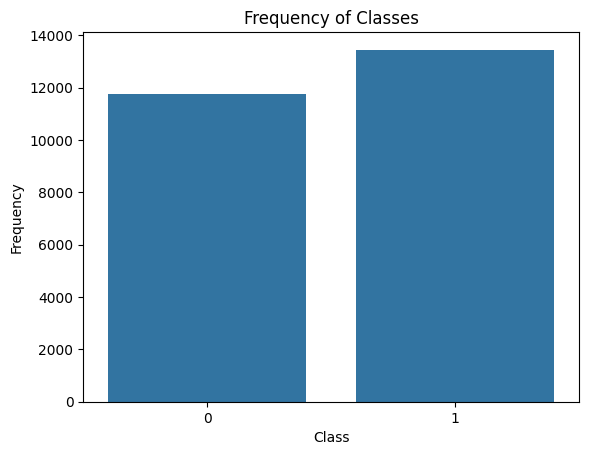

In [ ]:
sns.countplot(x=y)
plt.title('Frequency of Classes')
plt.xlabel('Class')
plt.ylabel('Frequency')
plt.show()

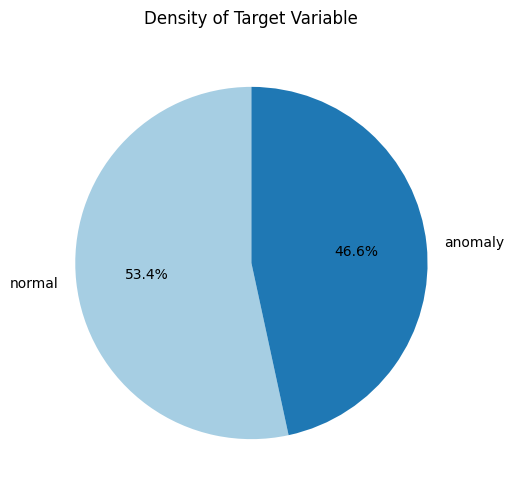

In [ ]:
target_counts = target.value_counts()
target_labels = target_counts.index  # Unique classes in the target variable
target_values = target_counts.values  # Count of each class

# Plot the pie chart
plt.figure(figsize=(5,6))
plt.pie(
    target_values,
    labels=target_labels,
    autopct='%1.1f%%',
    startangle=90,
    colors=plt.cm.Paired.colors
)
plt.title('Density of Target Variable')
plt.axis('equal')  # Equal aspect ratio ensures that pie is drawn as a circle
plt.show()

### X

In [ ]:
x.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 25192 entries, 0 to 25191
Data columns (total 41 columns):
 #   Column                       Non-Null Count  Dtype  
---  ------                       --------------  -----  
 0   duration                     25192 non-null  int64  
 1   protocol_type                25192 non-null  int64  
 2   service                      25192 non-null  int64  
 3   flag                         25192 non-null  int64  
 4   src_bytes                    25192 non-null  int64  
 5   dst_bytes                    25192 non-null  int64  
 6   land                         25192 non-null  int64  
 7   wrong_fragment               25192 non-null  int64  
 8   urgent                       25192 non-null  int64  
 9   hot                          25192 non-null  int64  
 10  num_failed_logins            25192 non-null  int64  
 11  logged_in                    25192 non-null  int64  
 12  num_compromised              25192 non-null  int64  
 13  root_shell      

In [ ]:
x.describe()

,duration,protocol_type,service,flag,src_bytes,dst_bytes,land,wrong_fragment,urgent,hot,...,dst_host_count,dst_host_srv_count,dst_host_same_srv_rate,dst_host_diff_srv_rate,dst_host_same_src_port_rate,dst_host_srv_diff_host_rate,dst_host_serror_rate,dst_host_srv_serror_rate,dst_host_rerror_rate,dst_host_srv_rerror_rate
count,25192.000000,25192.000000,25192.000000,25192.000000,2.519200e+04,2.519200e+04,25192.000000,25192.000000,25192.00000,25192.000000,...,25192.000000,25192.000000,25192.000000,25192.000000,25192.000000,25192.000000,25192.000000,25192.000000,25192.000000,25192.000000
mean,305.054104,1.053827,29.039139,6.982455,2.433063e+04,3.491847e+03,0.000079,0.023738,0.00004,0.198039,...,182.532074,115.063036,0.519791,0.082539,0.147453,0.031844,0.285800,0.279846,0.117800,0.118769
std,2686.555640,0.426998,15.555601,2.679322,2.410805e+06,8.883072e+04,0.008910,0.260221,0.00630,2.154202,...,98.993895,110.646850,0.448944,0.187191,0.308367,0.110575,0.445316,0.446075,0.305869,0.317333
min,0.000000,0.000000,0.000000,0.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.00000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,0.000000,1.000000,19.000000,5.000000,0.000000e+00,0.000000e+00,0.000000,0.000000,0.00000,0.000000,...,84.000000,10.000000,0.050000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,0.000000,1.000000,22.000000,9.000000,4.400000e+01,0.000000e+00,0.000000,0.000000,0.00000,0.000000,...,255.000000,61.000000,0.510000,0.030000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,0.000000,1.000000,46.000000,9.000000,2.790000e+02,5.302500e+02,0.000000,0.000000,0.00000,0.000000,...,255.000000,255.000000,1.000000,0.070000,0.060000,0.020000,1.000000,1.000000,0.000000,0.000000
max,42862.000000,2.000000,65.000000,10.000000,3.817091e+08,5.151385e+06,1.000000,3.000000,1.00000,77.000000,...,255.000000,255.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


1. duration
count    25192.000000
mean       305.054104
std       2686.555640
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max      42862.000000
Name: duration, dtype: float64

Value Counts:
 duration
0        23168
1          374
2          165
3          102
4           75
         ...  
12892        1
584          1
10774        1
3735         1
7787         1
Name: count, Length: 758, dtype: int64


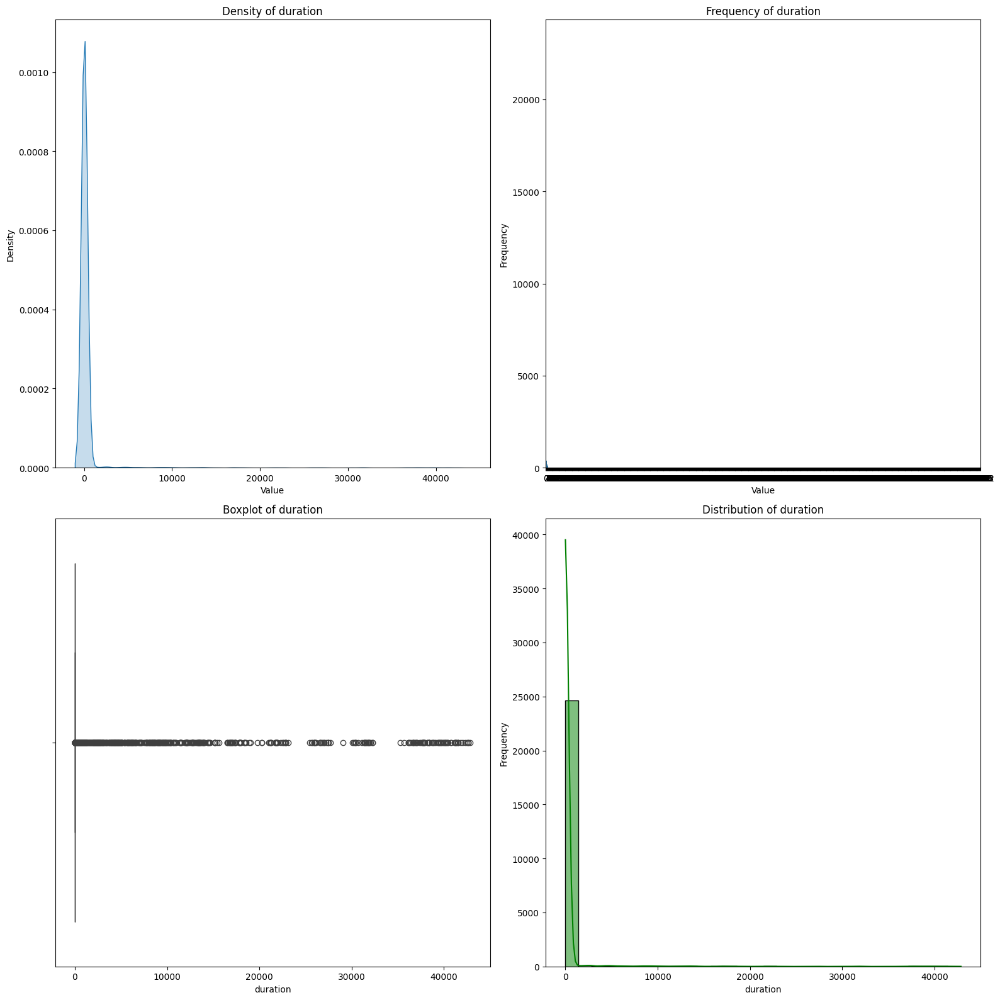



2. protocol_type
count    25192.000000
mean         1.053827
std          0.426998
min          0.000000
25%          1.000000
50%          1.000000
75%          1.000000
max          2.000000
Name: protocol_type, dtype: float64

Value Counts:
 protocol_type
1    20526
2     3011
0     1655
Name: count, dtype: int64


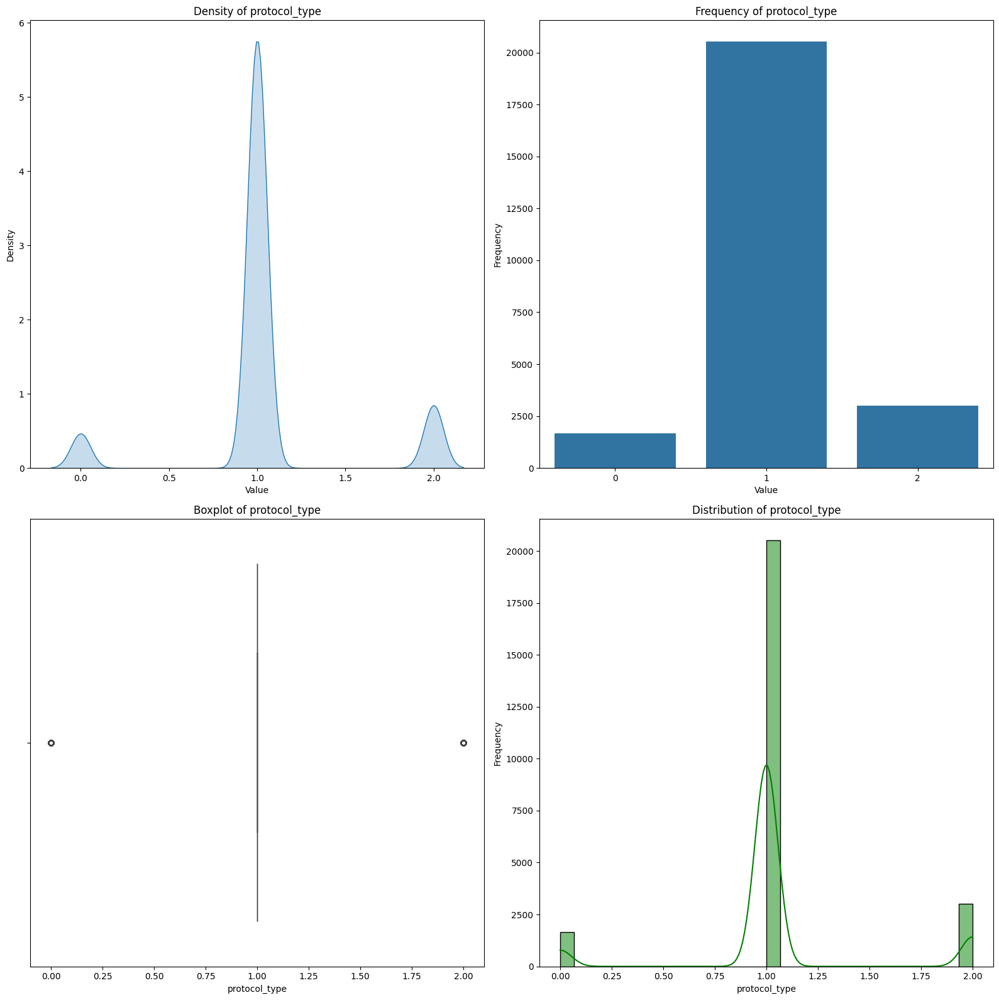



3. service
count    25192.000000
mean        29.039139
std         15.555601
min          0.000000
25%         19.000000
50%         22.000000
75%         46.000000
max         65.000000
Name: service, dtype: float64

Value Counts:
 service
22    8003
46    4351
11    1820
51    1449
19    1396
      ... 
60       4
42       3
47       3
58       2
24       1
Name: count, Length: 66, dtype: int64


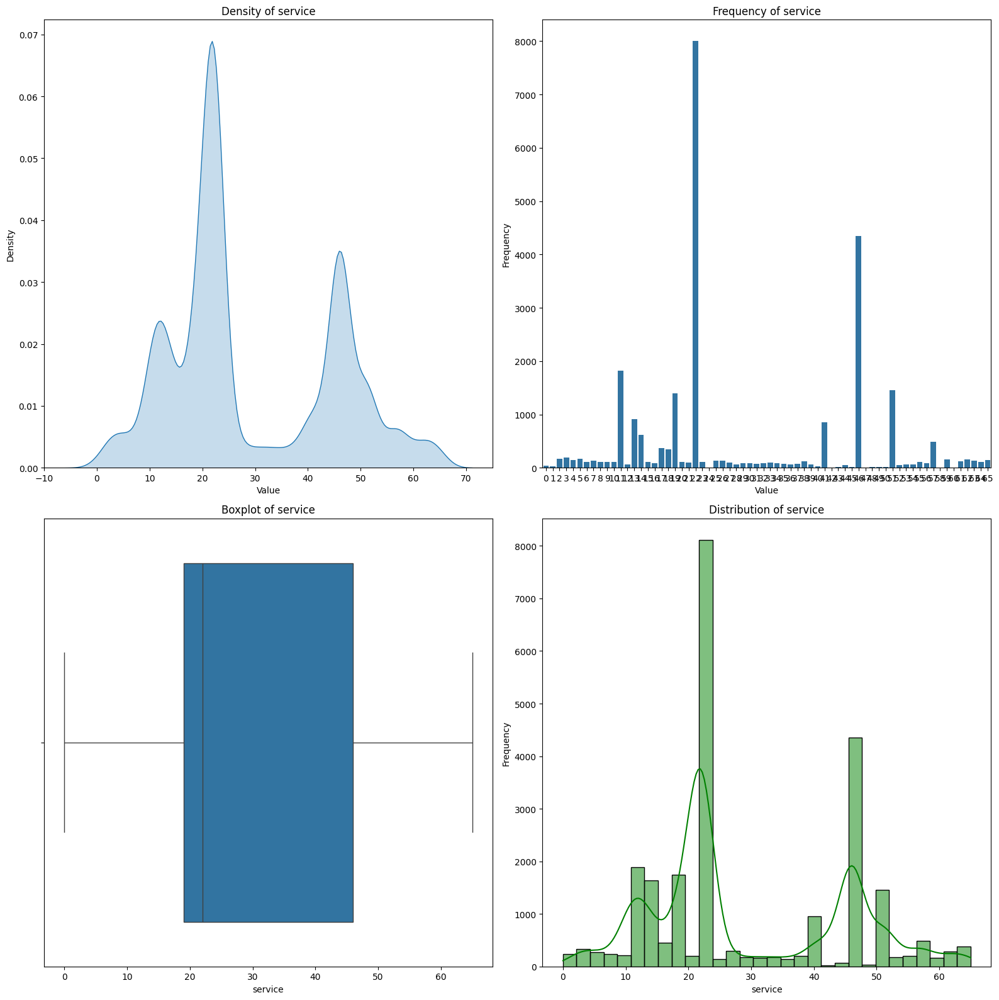



4. flag
count    25192.000000
mean         6.982455
std          2.679322
min          0.000000
25%          5.000000
50%          9.000000
75%          9.000000
max         10.000000
Name: flag, dtype: float64

Value Counts:
 flag
9     14973
5      7009
1      2216
4       497
2       304
6        88
10       43
3        21
7        21
8        15
0         5
Name: count, dtype: int64


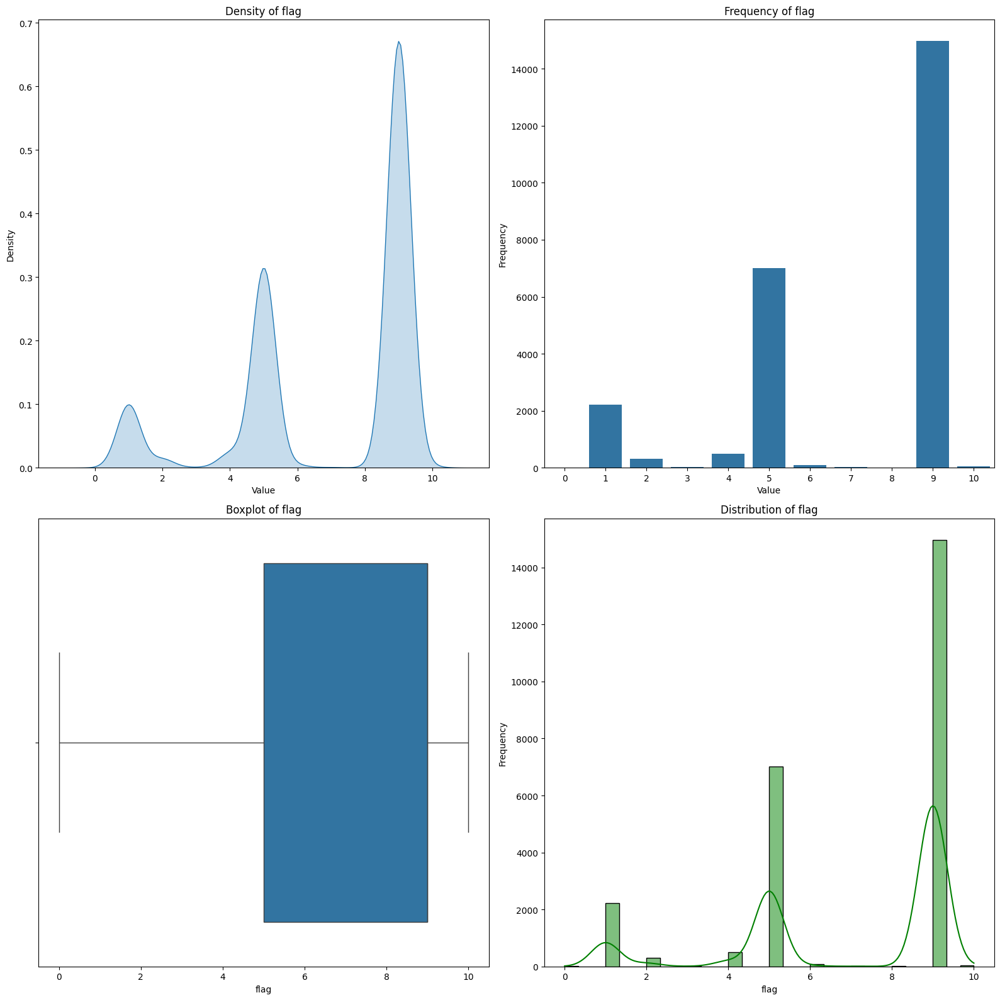



5. src_bytes
count    2.519200e+04
mean     2.433063e+04
std      2.410805e+06
min      0.000000e+00
25%      0.000000e+00
50%      4.400000e+01
75%      2.790000e+02
max      3.817091e+08
Name: src_bytes, dtype: float64

Value Counts:
 src_bytes
0        9866
8         738
1         480
44        467
45        416
         ... 
1464        1
1249        1
1396        1
12715       1
1210        1
Name: count, Length: 1665, dtype: int64


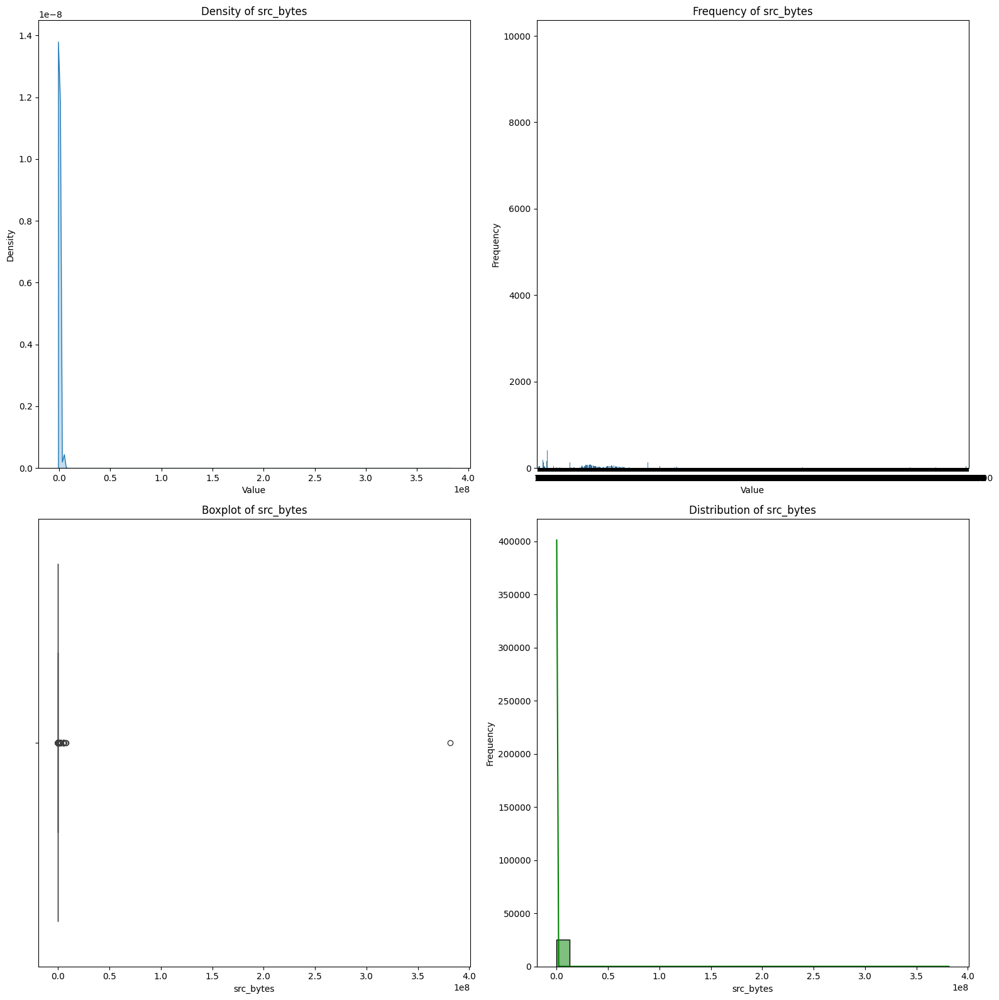



6. dst_bytes
count    2.519200e+04
mean     3.491847e+03
std      8.883072e+04
min      0.000000e+00
25%      0.000000e+00
50%      0.000000e+00
75%      5.302500e+02
max      5.151385e+06
Name: dst_bytes, dtype: float64

Value Counts:
 dst_bytes
0       13574
105       309
8314      175
44        115
42        105
        ...  
4188        1
8227        1
2014        1
4845        1
1929        1
Name: count, Length: 3922, dtype: int64


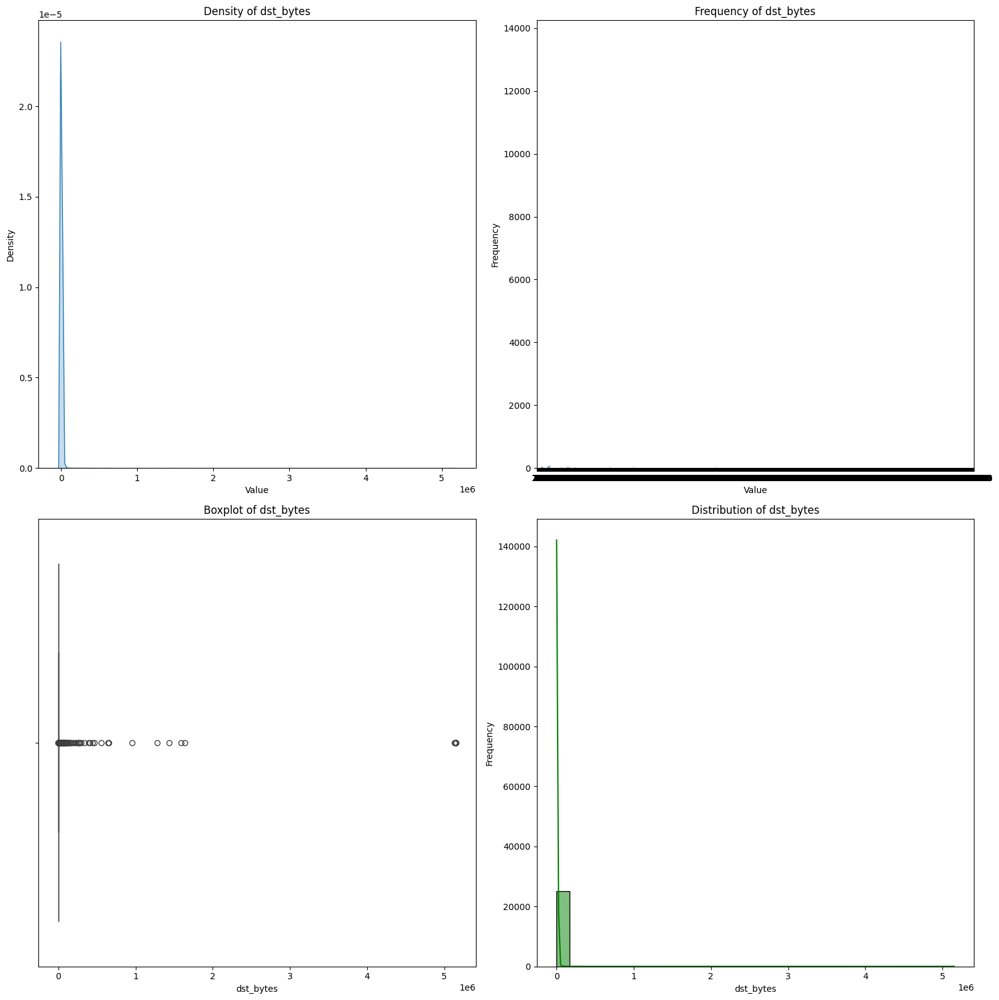



7. land
count    25192.000000
mean         0.000079
std          0.008910
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: land, dtype: float64

Value Counts:
 land
0    25190
1        2
Name: count, dtype: int64


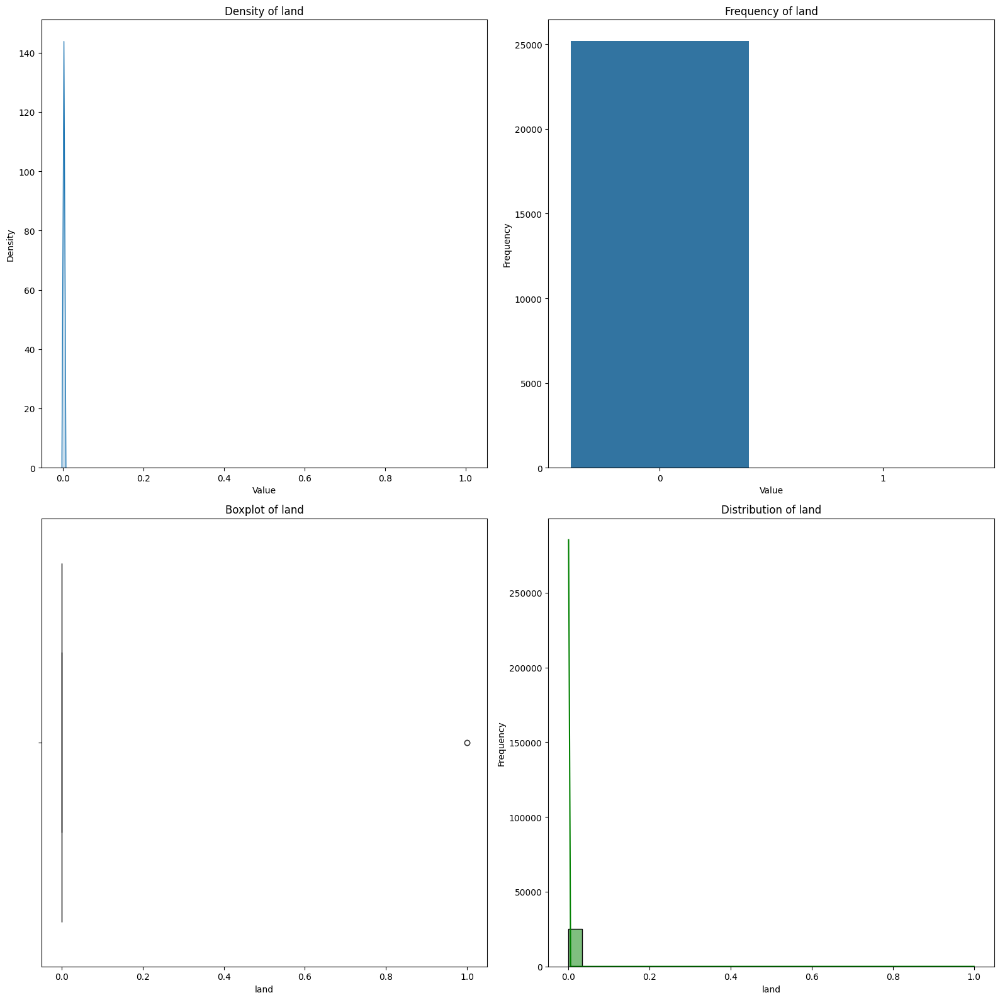



8. wrong_fragment
count    25192.000000
mean         0.023738
std          0.260221
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          3.000000
Name: wrong_fragment, dtype: float64

Value Counts:
 wrong_fragment
0    24968
3      187
1       37
Name: count, dtype: int64


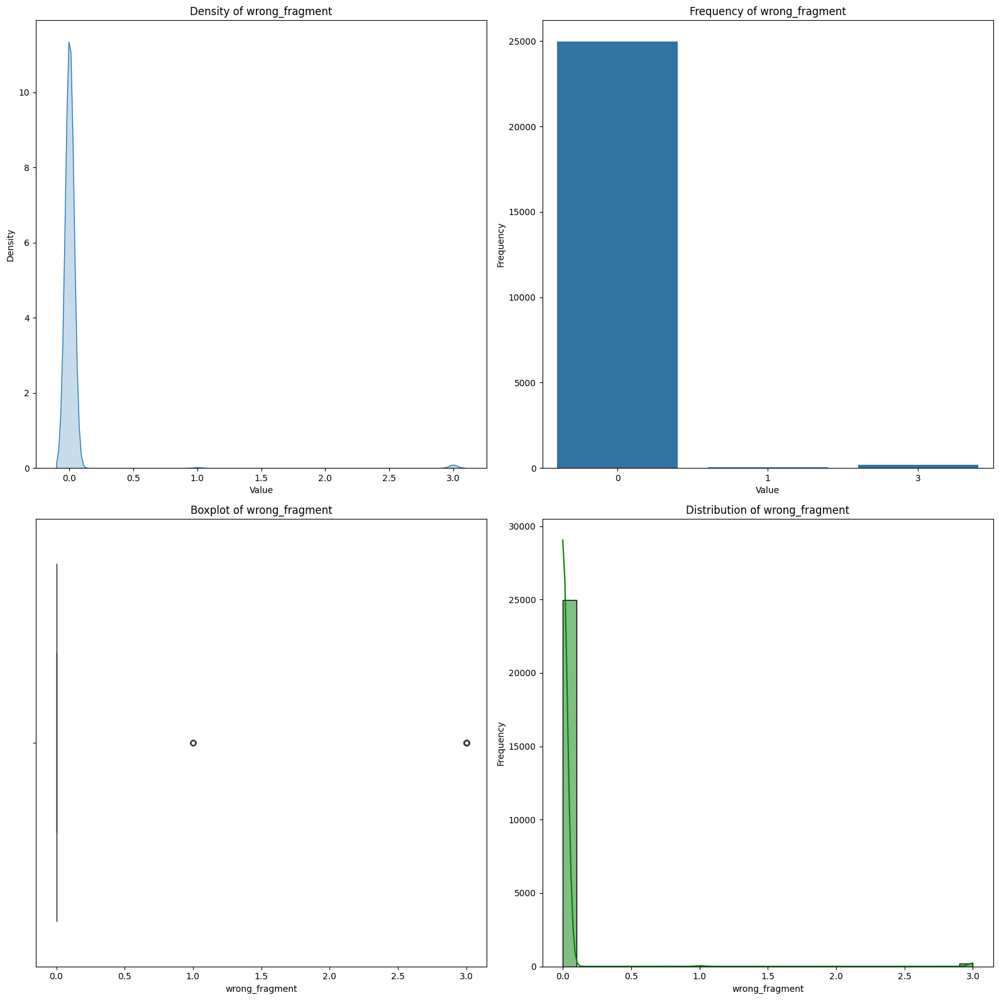



9. urgent
count    25192.00000
mean         0.00004
std          0.00630
min          0.00000
25%          0.00000
50%          0.00000
75%          0.00000
max          1.00000
Name: urgent, dtype: float64

Value Counts:
 urgent
0    25191
1        1
Name: count, dtype: int64


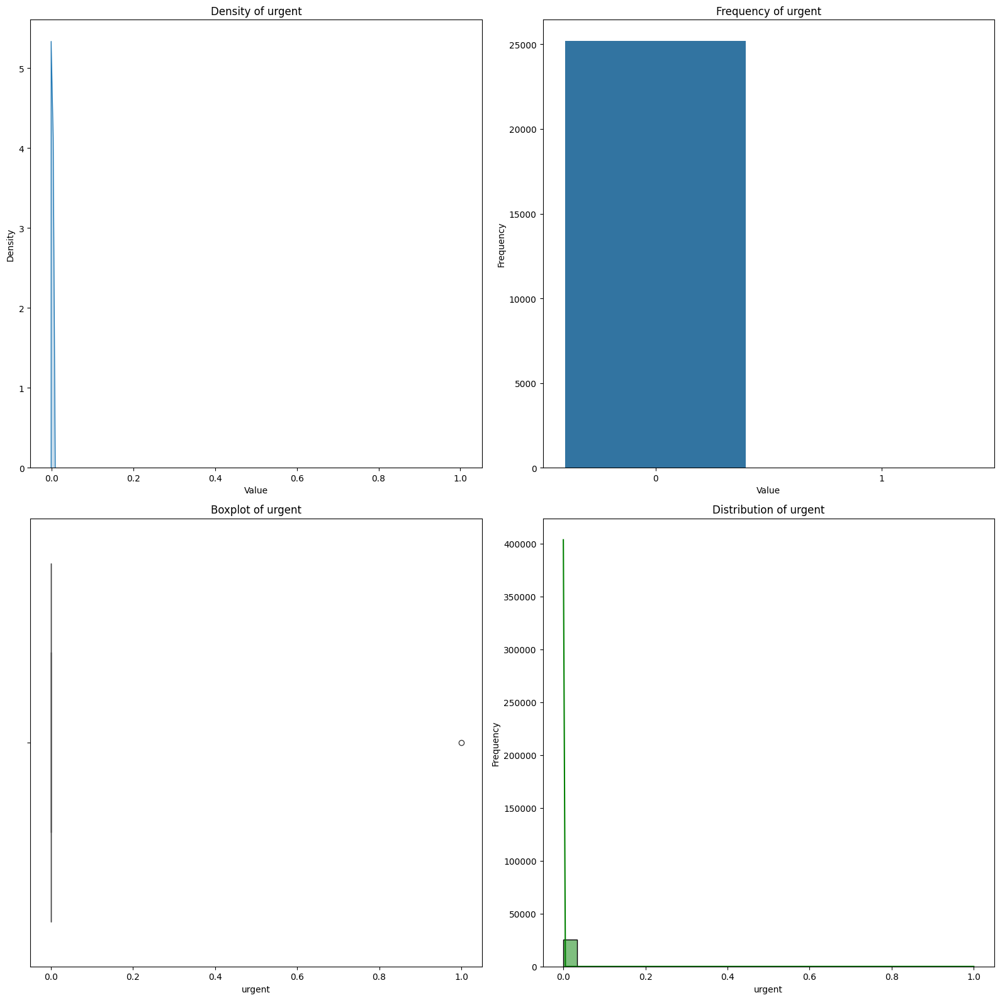



10. hot
count    25192.000000
mean         0.198039
std          2.154202
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         77.000000
Name: hot, dtype: float64

Value Counts:
 hot
0     24672
2       200
1        78
30       55
28       52
4        37
6        26
5        17
22       13
24        9
19        8
3         7
18        6
14        3
7         2
15        1
25        1
77        1
17        1
11        1
20        1
12        1
Name: count, dtype: int64


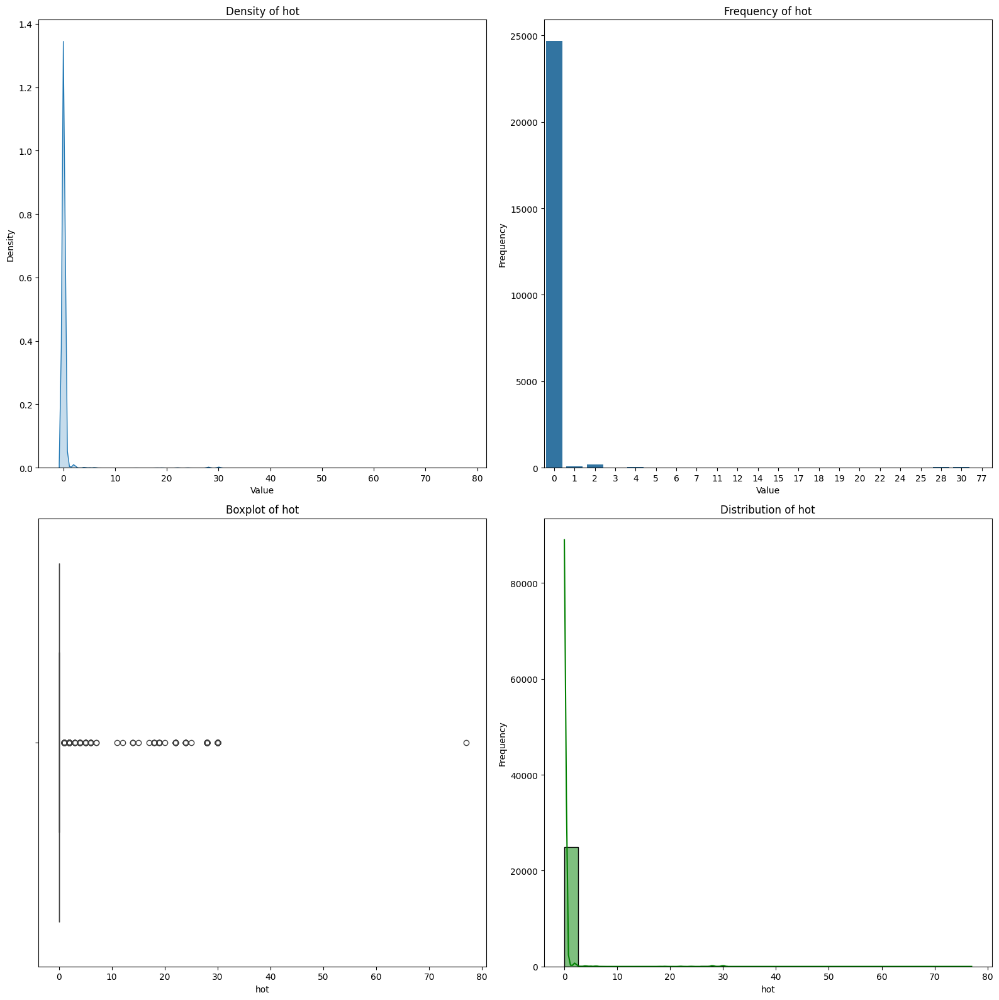



11. num_failed_logins
count    25192.000000
mean         0.001191
std          0.045418
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          4.000000
Name: num_failed_logins, dtype: float64

Value Counts:
 num_failed_logins
0    25169
1       19
2        2
3        1
4        1
Name: count, dtype: int64


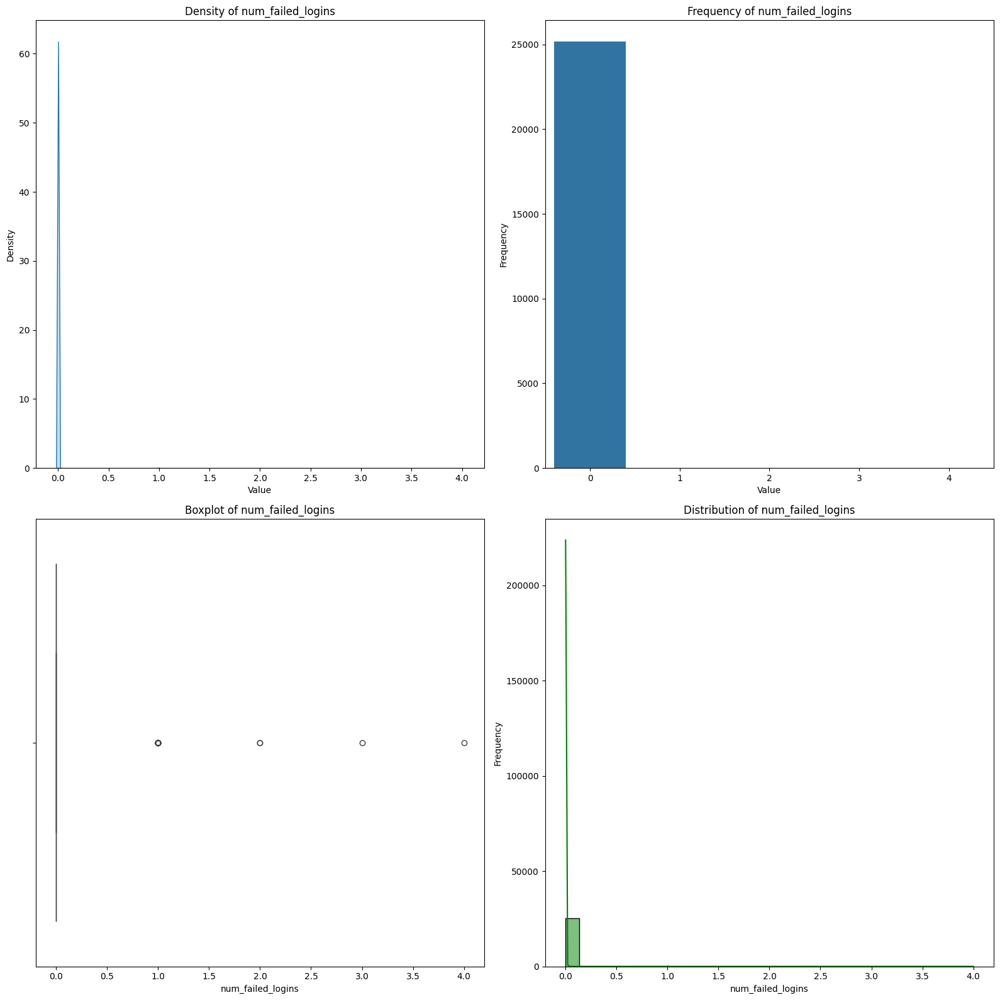



12. logged_in
count    25192.000000
mean         0.394768
std          0.488811
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: logged_in, dtype: float64

Value Counts:
 logged_in
0    15247
1     9945
Name: count, dtype: int64


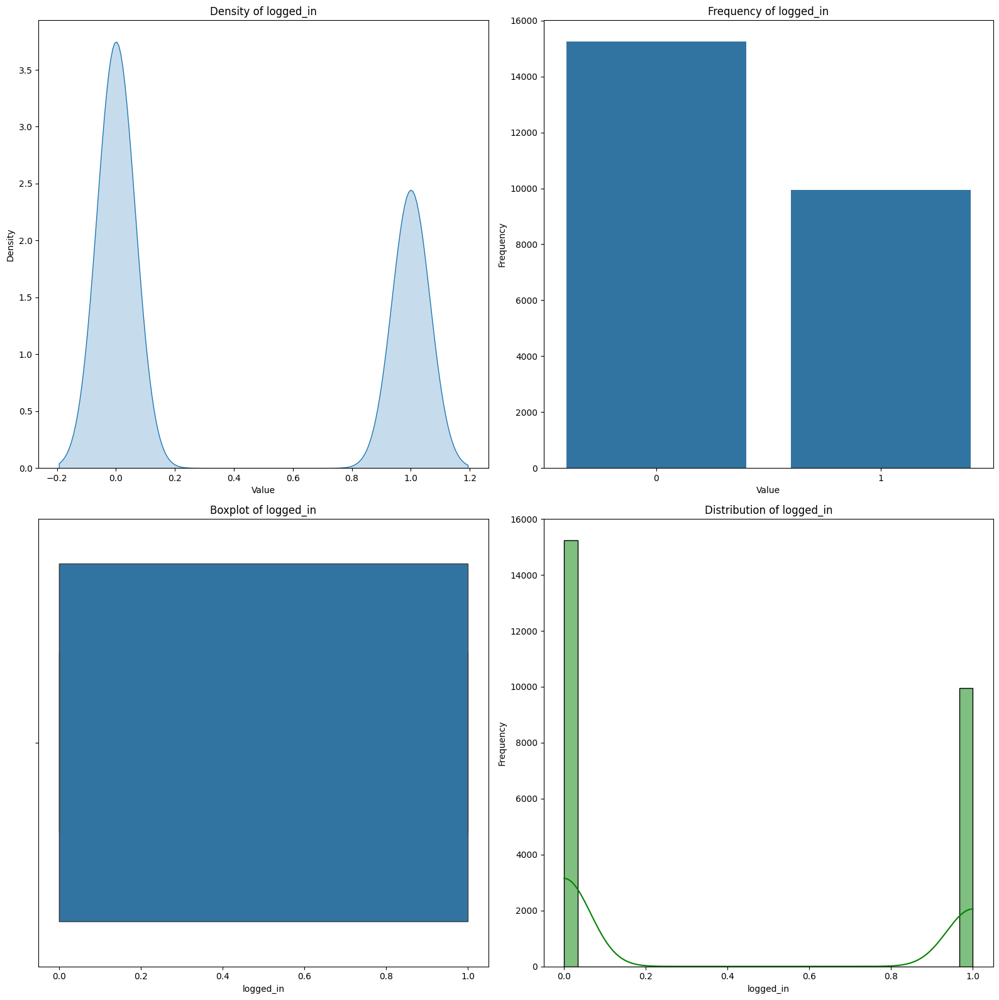



13. num_compromised
count    25192.000000
mean         0.227850
std         10.417352
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        884.000000
Name: num_compromised, dtype: float64

Value Counts:
 num_compromised
0      24920
1        194
2         21
4         13
6          8
3          7
5          5
151        2
7          2
12         2
38         1
19         1
110        1
462        1
107        1
31         1
9          1
157        1
13         1
558        1
371        1
217        1
83         1
193        1
789        1
520        1
884        1
457        1
Name: count, dtype: int64


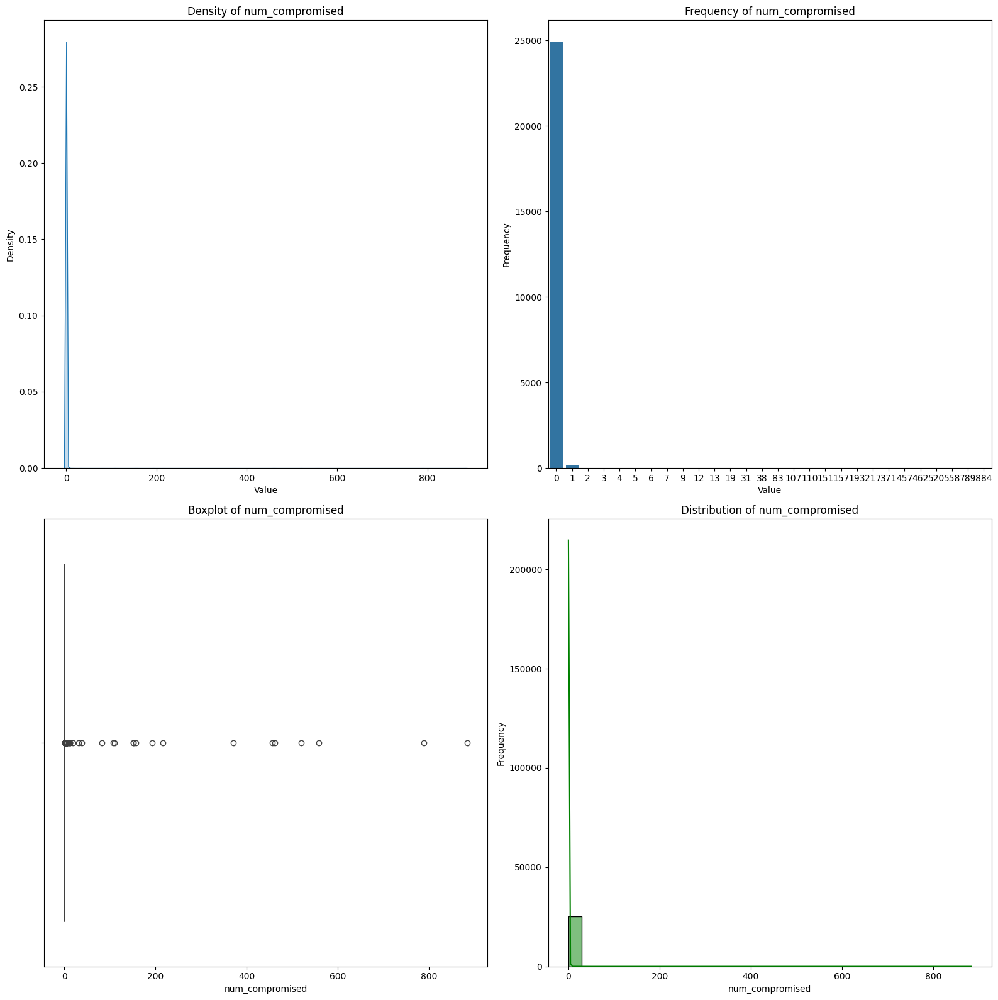



14. root_shell
count    25192.000000
mean         0.001548
std          0.039316
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: root_shell, dtype: float64

Value Counts:
 root_shell
0    25153
1       39
Name: count, dtype: int64


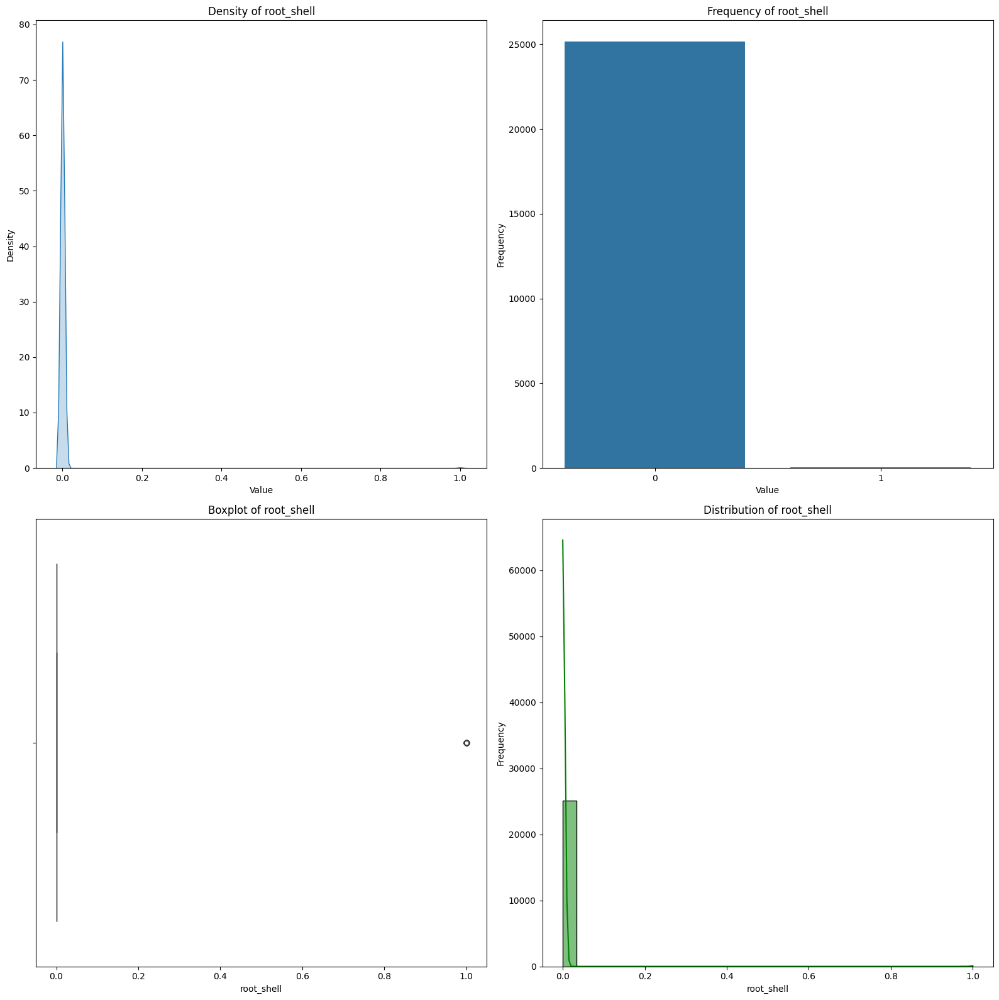



15. su_attempted
count    25192.000000
mean         0.001350
std          0.048785
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          2.000000
Name: su_attempted, dtype: float64

Value Counts:
 su_attempted
0    25171
2       13
1        8
Name: count, dtype: int64


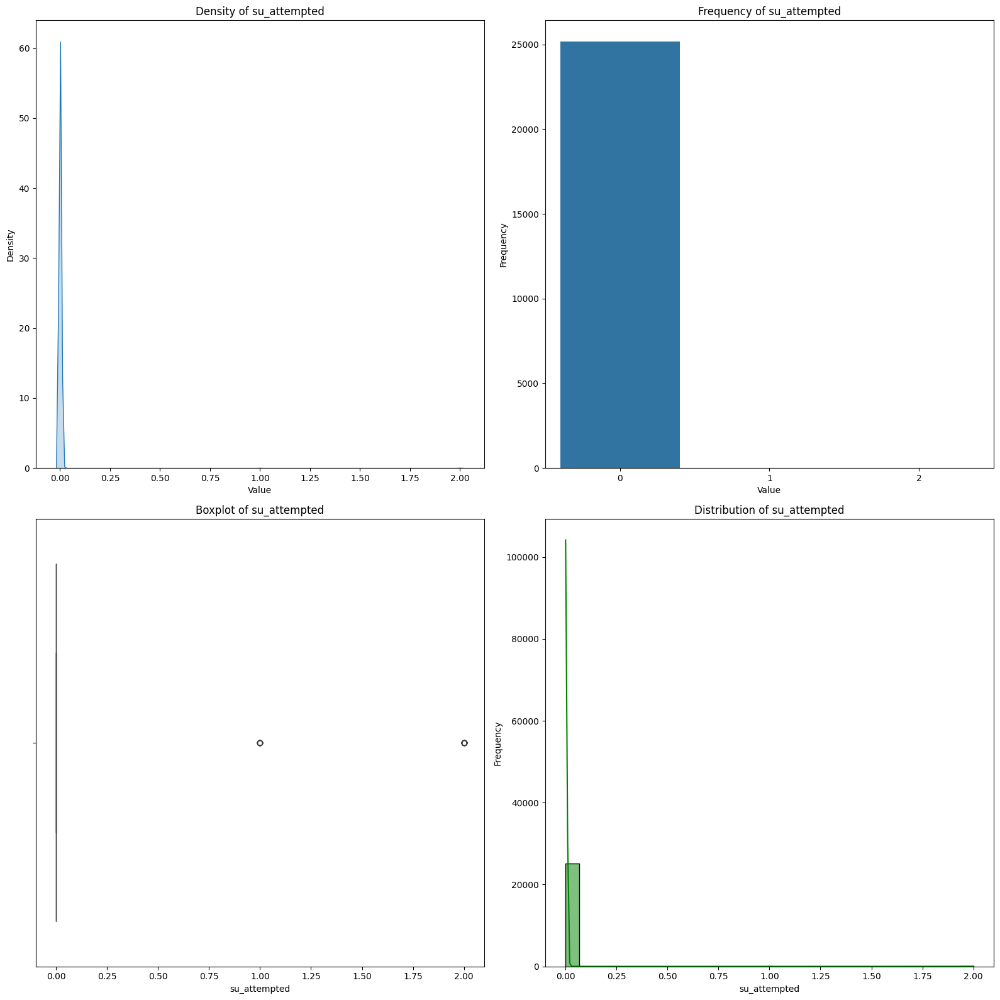



16. num_root
count    25192.000000
mean         0.249841
std         11.500842
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max        975.000000
Name: num_root, dtype: float64

Value Counts:
 num_root
0      25058
1         47
9         24
6         23
2         10
5          6
4          2
3          2
14         1
100        1
10         1
54         1
121        1
512        1
38         1
151        1
7          1
629        1
417        1
179        1
146        1
247        1
191        1
91         1
867        1
572        1
975        1
508        1
Name: count, dtype: int64


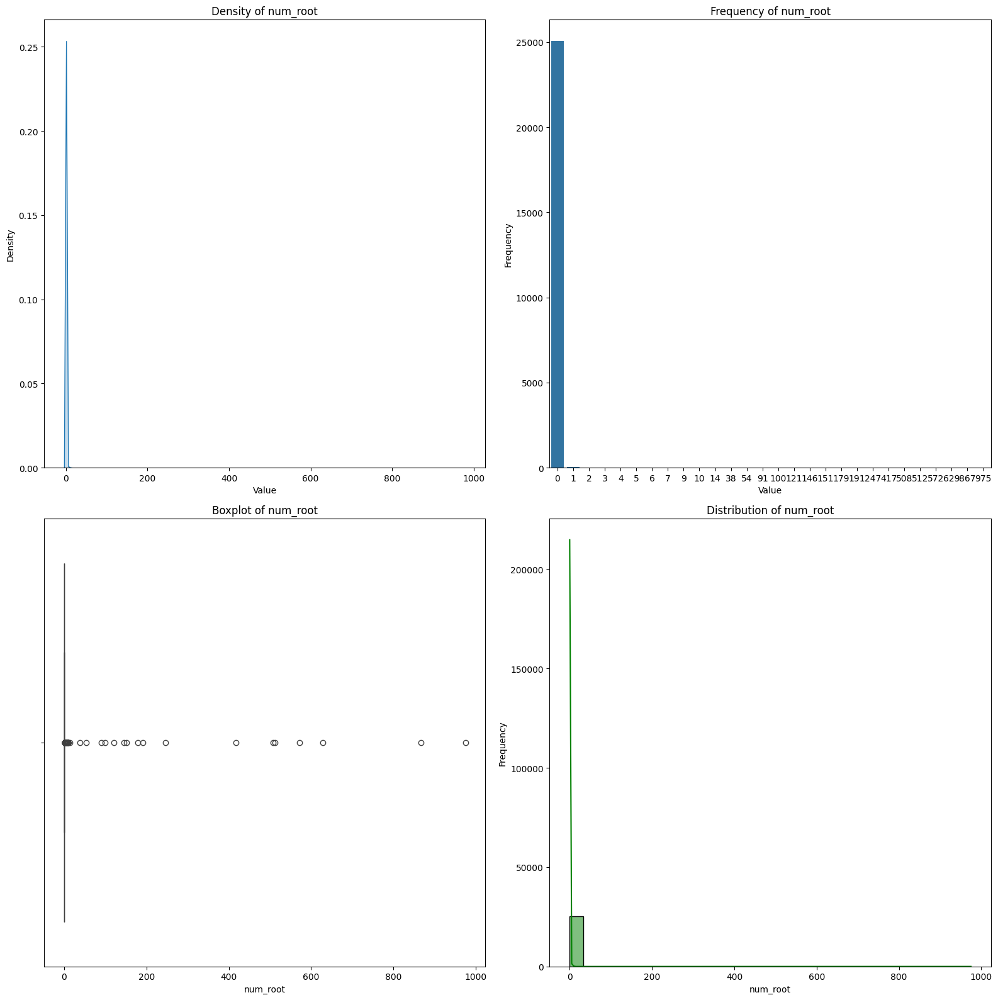



17. num_file_creations
count    25192.000000
mean         0.014727
std          0.529602
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max         40.000000
Name: num_file_creations, dtype: float64

Value Counts:
 num_file_creations
0     25126
1        37
2         7
4         3
8         2
18        2
5         2
13        1
29        1
19        1
6         1
15        1
14        1
21        1
17        1
40        1
3         1
20        1
11        1
38        1
Name: count, dtype: int64


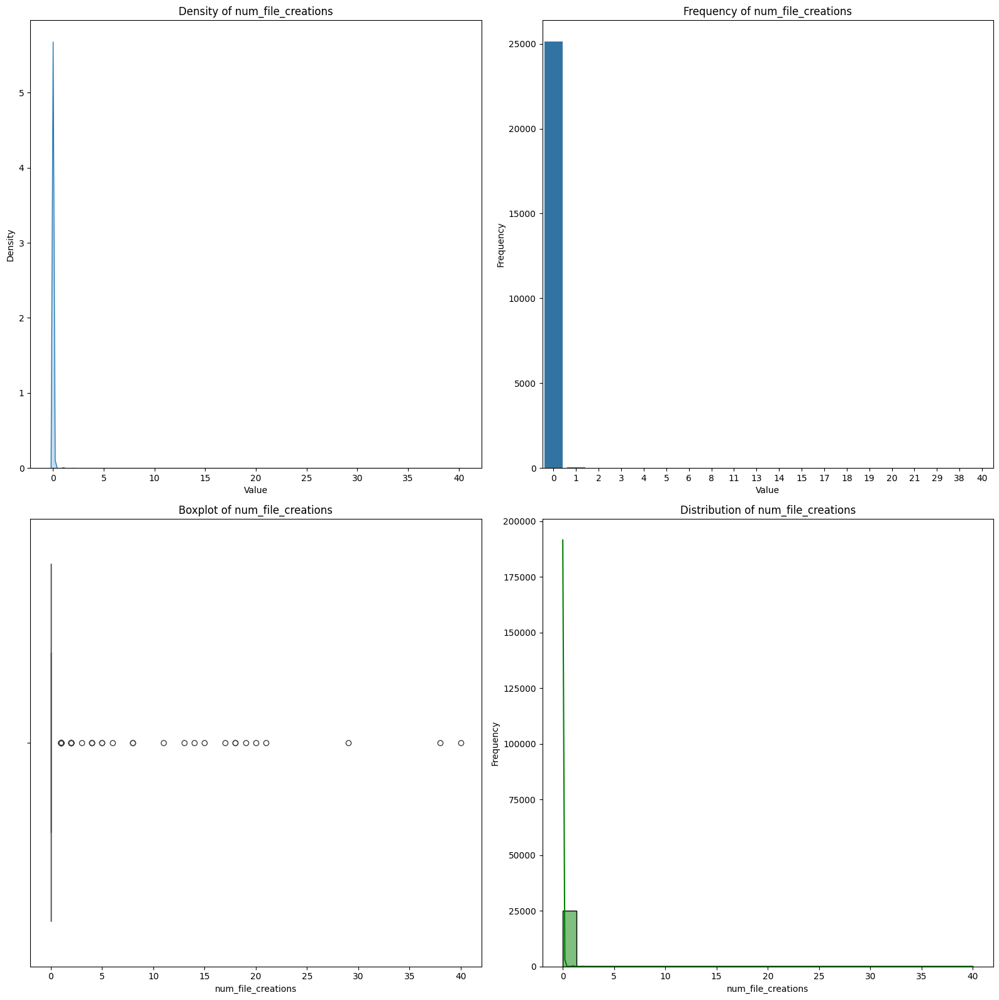



18. num_shells
count    25192.000000
mean         0.000357
std          0.018898
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: num_shells, dtype: float64

Value Counts:
 num_shells
0    25183
1        9
Name: count, dtype: int64


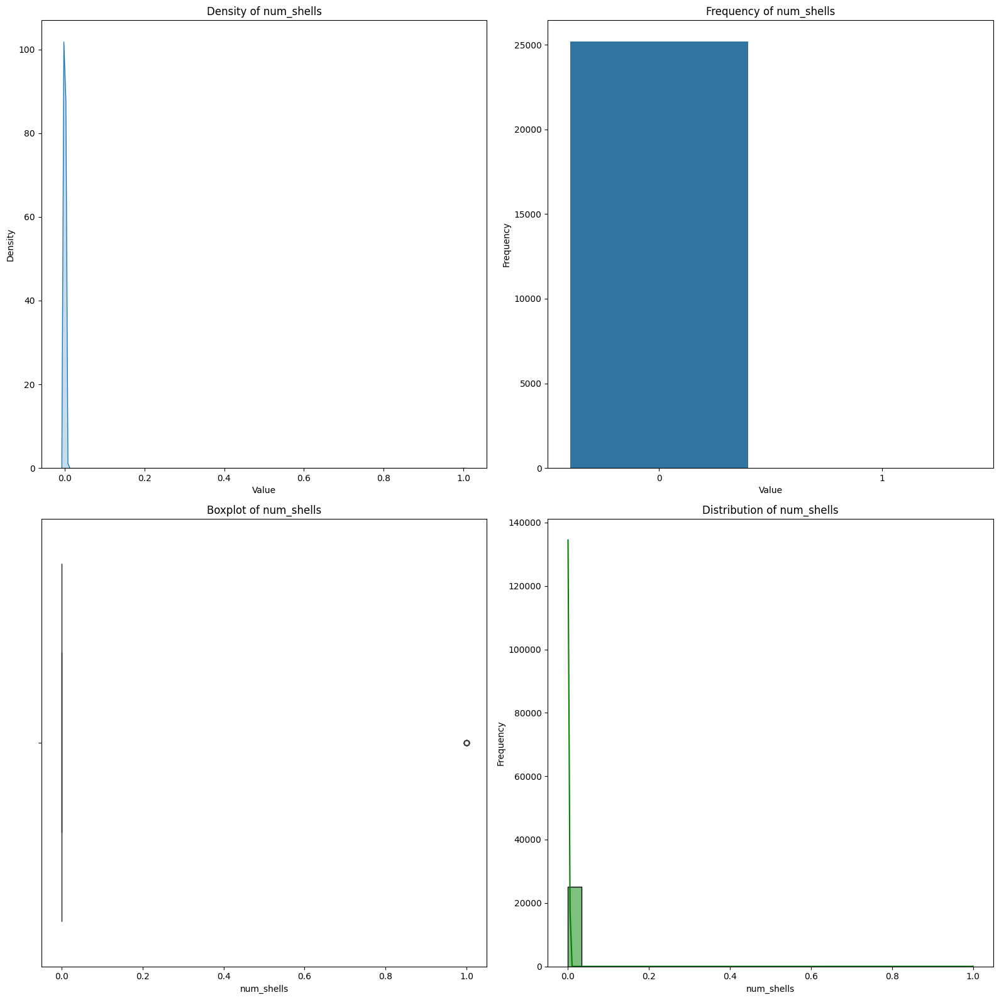



19. num_access_files
count    25192.000000
mean         0.004327
std          0.098524
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          8.000000
Name: num_access_files, dtype: float64

Value Counts:
 num_access_files
0    25113
1       65
2        8
3        2
5        2
4        1
8        1
Name: count, dtype: int64


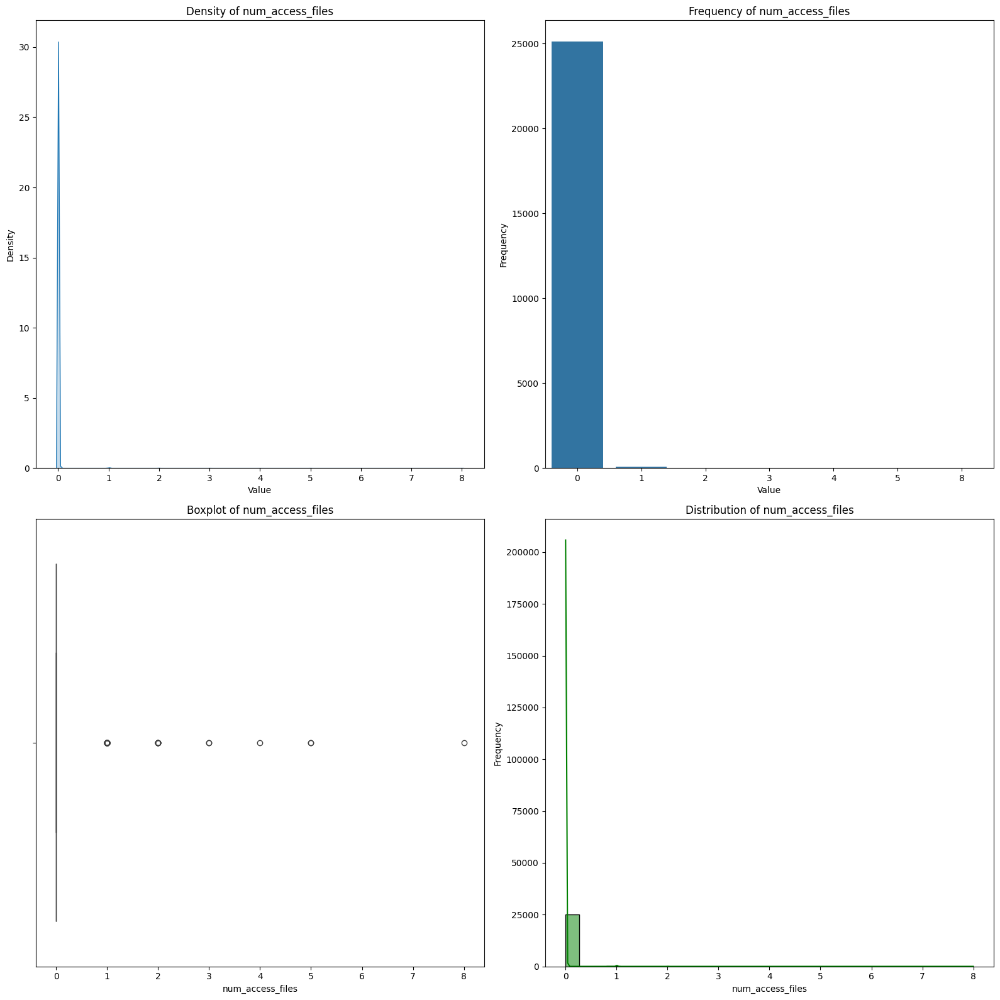



20. num_outbound_cmds
count    25192.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: num_outbound_cmds, dtype: float64

Value Counts:
 num_outbound_cmds
0    25192
Name: count, dtype: int64


<ipython-input-20-23ed71dd30e7>:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x[i], fill=True, ax=axes[0, 0])  # Changed axes[0] to axes[0, 0]


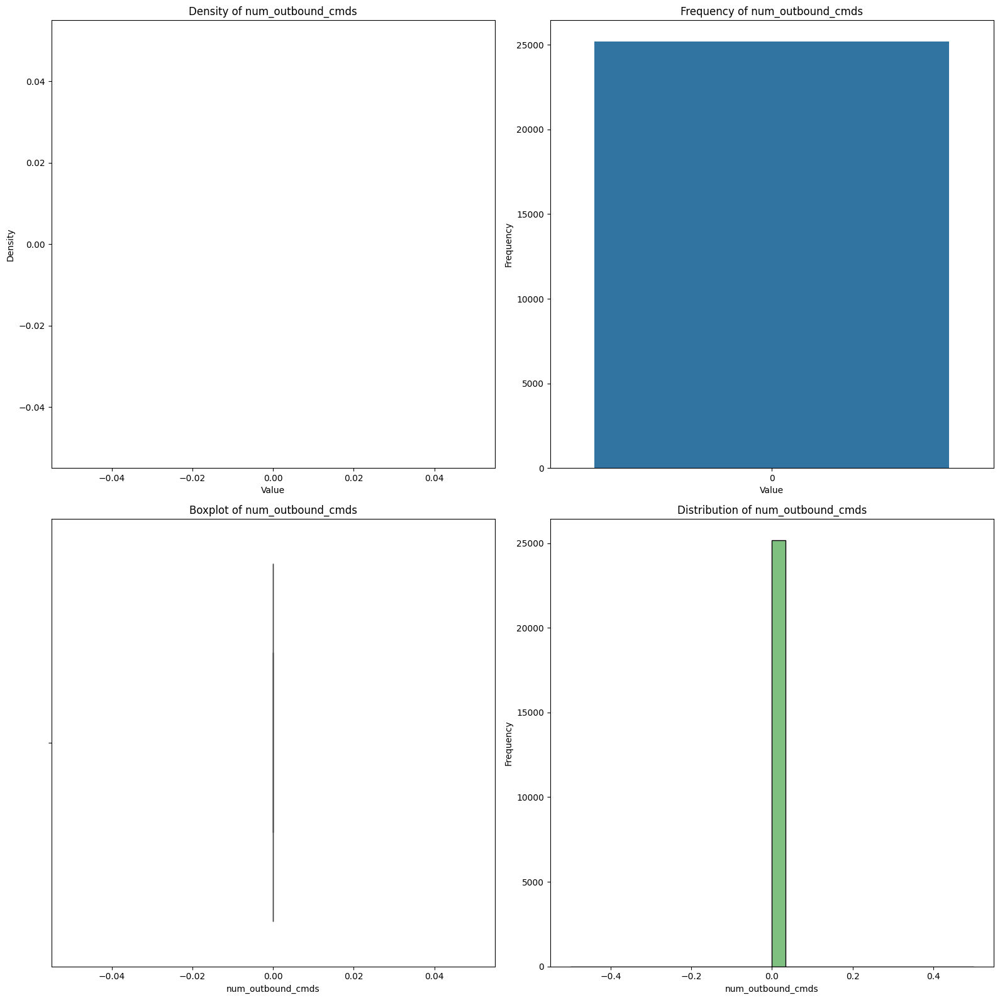



21. is_host_login
count    25192.0
mean         0.0
std          0.0
min          0.0
25%          0.0
50%          0.0
75%          0.0
max          0.0
Name: is_host_login, dtype: float64

Value Counts:
 is_host_login
0    25192
Name: count, dtype: int64


<ipython-input-20-23ed71dd30e7>:9: UserWarning: Dataset has 0 variance; skipping density estimate. Pass `warn_singular=False` to disable this warning.
  sns.kdeplot(x[i], fill=True, ax=axes[0, 0])  # Changed axes[0] to axes[0, 0]


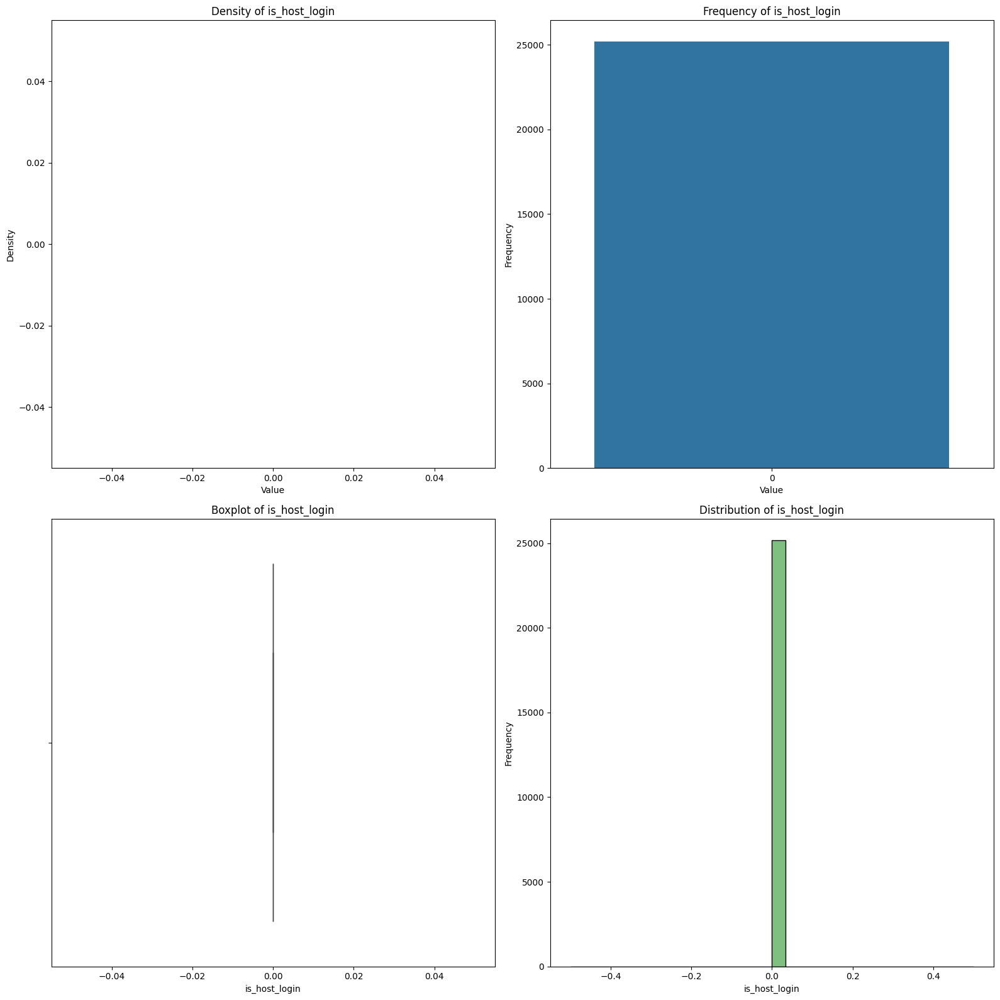



22. is_guest_login
count    25192.000000
mean         0.009130
std          0.095115
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: is_guest_login, dtype: float64

Value Counts:
 is_guest_login
0    24962
1      230
Name: count, dtype: int64


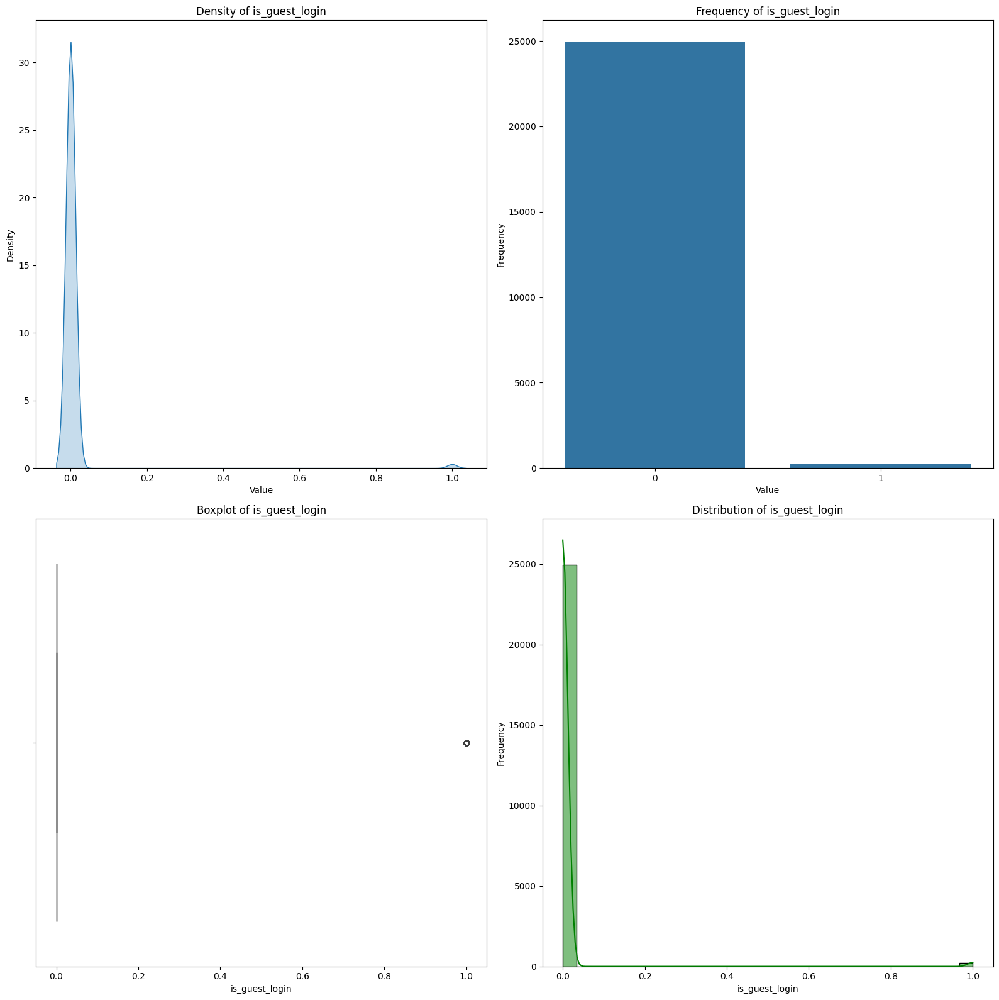



23. count
count    25192.000000
mean        84.591180
std        114.673451
min          1.000000
25%          2.000000
50%         14.000000
75%        144.000000
max        511.000000
Name: count, dtype: float64

Value Counts:
 count
1      5519
2      1934
3       769
4       696
5       597
       ... 
411       1
340       1
403       1
327       1
450       1
Name: count, Length: 466, dtype: int64


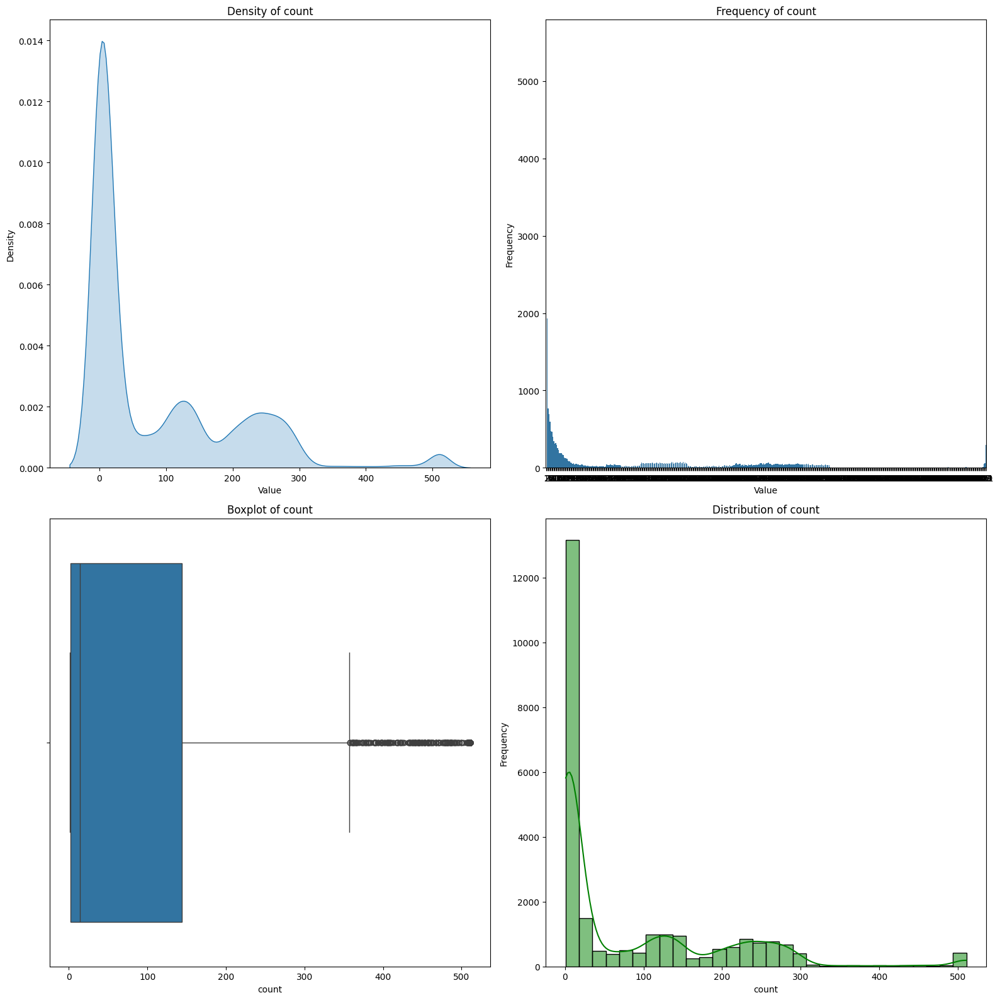



24. srv_count
count    25192.000000
mean        27.698754
std         72.468242
min          1.000000
25%          2.000000
50%          8.000000
75%         18.000000
max        511.000000
Name: srv_count, dtype: float64

Value Counts:
 srv_count
1      5080
2      2538
3      1223
4      1086
5       913
       ... 
102       1
352       1
406       1
258       1
401       1
Name: count, Length: 414, dtype: int64


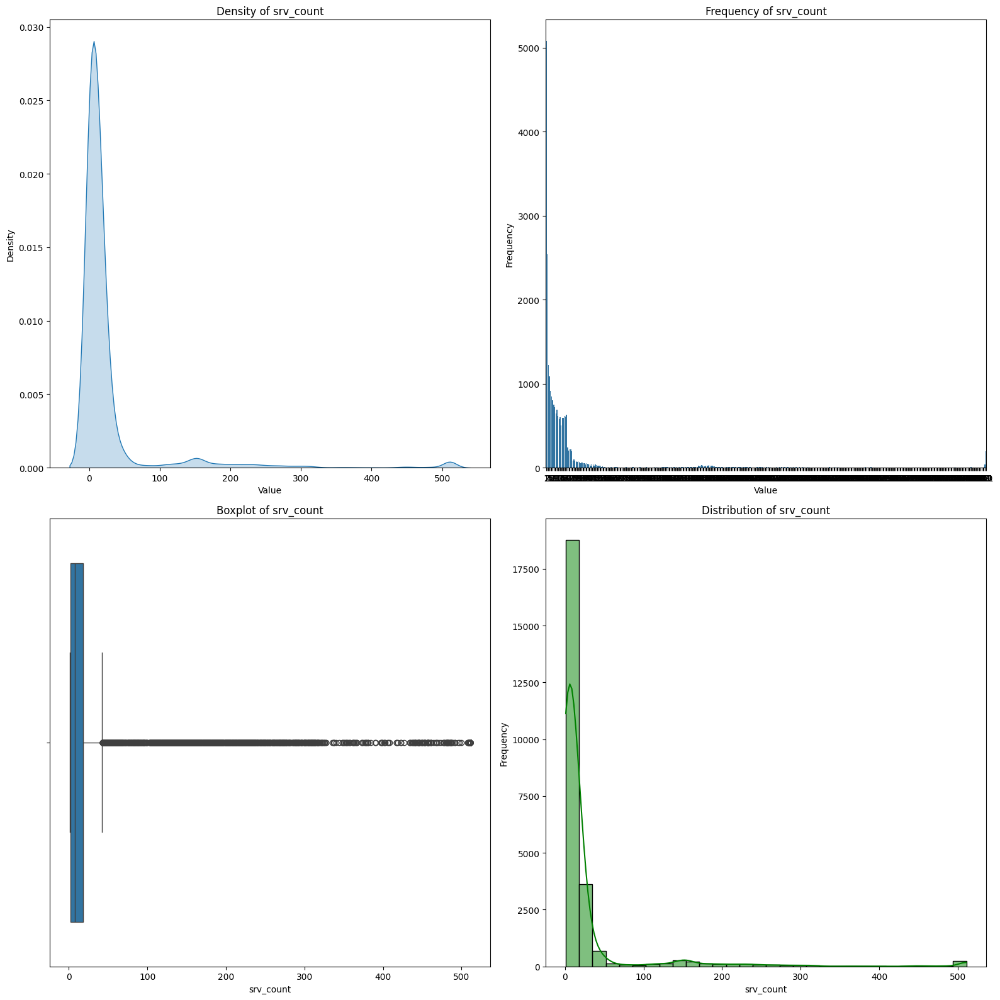



25. serror_rate
count    25192.000000
mean         0.286338
std          0.447312
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: serror_rate, dtype: float64

Value Counts:
 serror_rate
0.00    17329
1.00     6941
0.50      122
0.07       53
0.05       50
        ...  
0.59        1
0.36        1
0.26        1
0.91        1
0.72        1
Name: count, Length: 70, dtype: int64


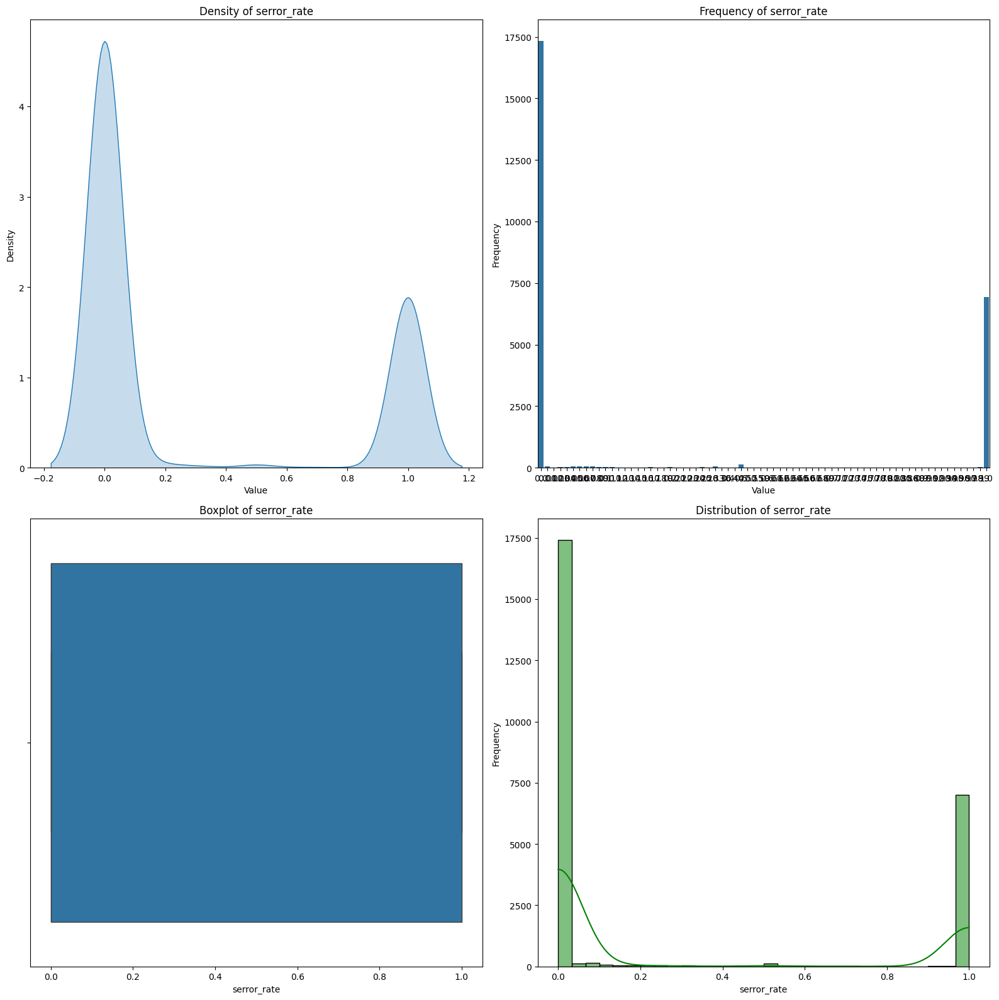



26. srv_serror_rate
count    25192.000000
mean         0.283762
std          0.447599
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: srv_serror_rate, dtype: float64

Value Counts:
 srv_serror_rate
0.00    17708
1.00     7003
0.50       94
0.33       51
0.25       42
0.20       32
0.05       26
0.17       22
0.04       20
0.03       20
0.07       16
0.67       13
0.02       13
0.06       10
0.09       10
0.10       10
0.08       10
0.12       10
0.14        9
0.95        9
0.11        8
0.40        5
0.90        4
0.22        4
0.91        3
0.92        3
0.89        3
0.80        3
0.29        2
0.76        2
0.18        2
0.78        1
0.43        1
0.55        1
0.36        1
0.34        1
0.60        1
0.57        1
0.53        1
0.74        1
0.94        1
0.93        1
0.01        1
0.86        1
0.26        1
0.83        1
0.88        1
0.75        1
0.46        1
0.59        1
0.39        1
0.41        1
0.13

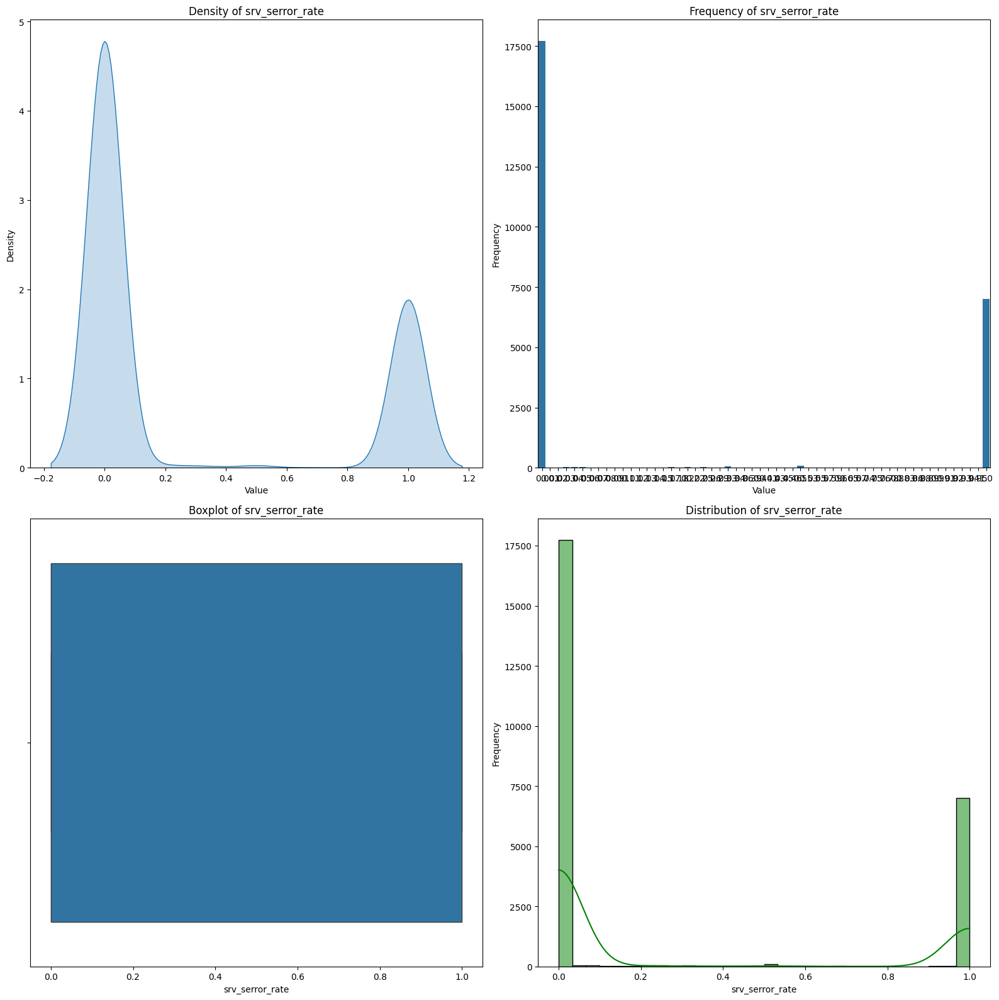



27. rerror_rate
count    25192.000000
mean         0.118630
std          0.318745
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: rerror_rate, dtype: float64

Value Counts:
 rerror_rate
0.00    21985
1.00     2552
0.90       43
0.89       39
0.92       38
        ...  
0.21        1
0.09        1
0.32        1
0.44        1
0.69        1
Name: count, Length: 72, dtype: int64


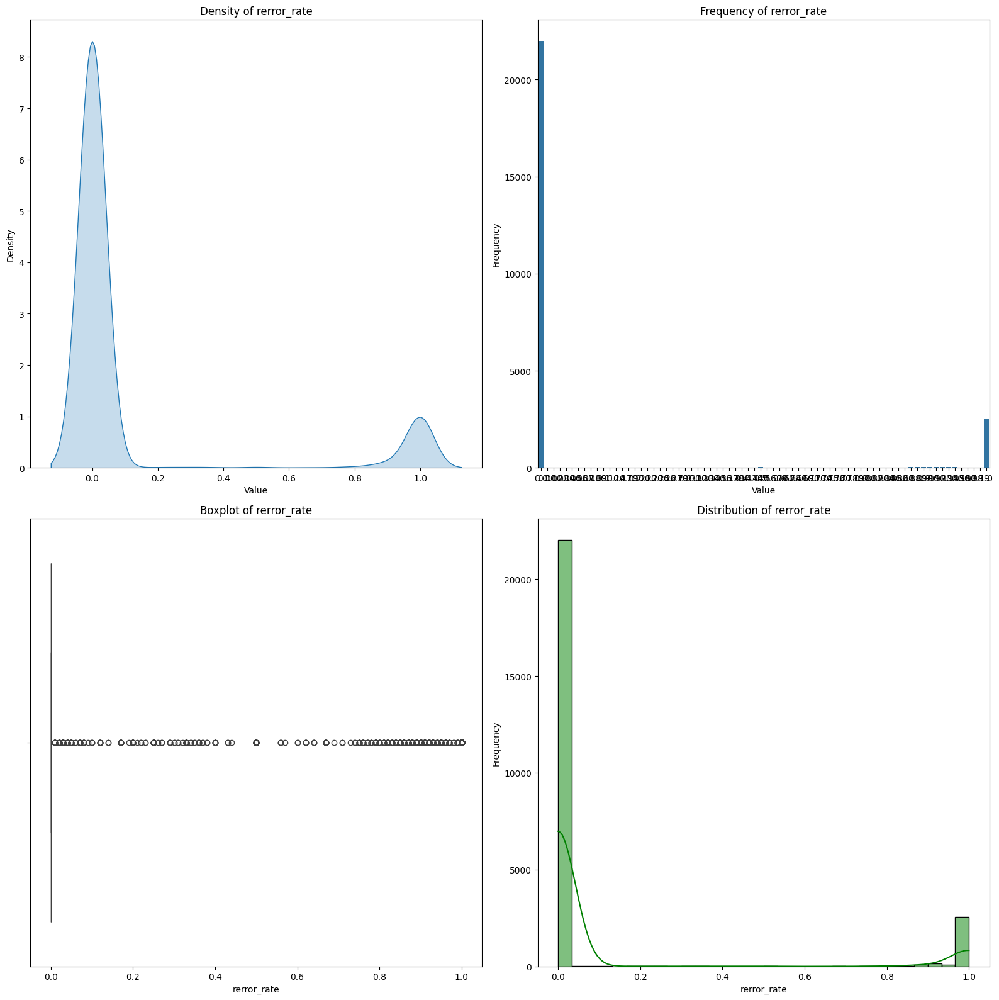



28. srv_rerror_rate
count    25192.000000
mean         0.120260
std          0.322335
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: srv_rerror_rate, dtype: float64

Value Counts:
 srv_rerror_rate
0.00    21959
1.00     2937
0.50       56
0.33       32
0.25       26
0.17       17
0.20       16
0.04       14
0.67       11
0.08       11
0.14       10
0.06       10
0.02        9
0.03        8
0.10        8
0.05        8
0.07        7
0.12        5
0.75        5
0.62        4
0.29        3
0.11        3
0.83        3
0.40        3
0.80        3
0.43        2
0.71        2
0.09        2
0.81        2
0.79        2
0.64        2
0.60        2
0.84        1
0.56        1
0.74        1
0.38        1
0.15        1
0.85        1
0.69        1
0.73        1
0.76        1
0.57        1
Name: count, dtype: int64


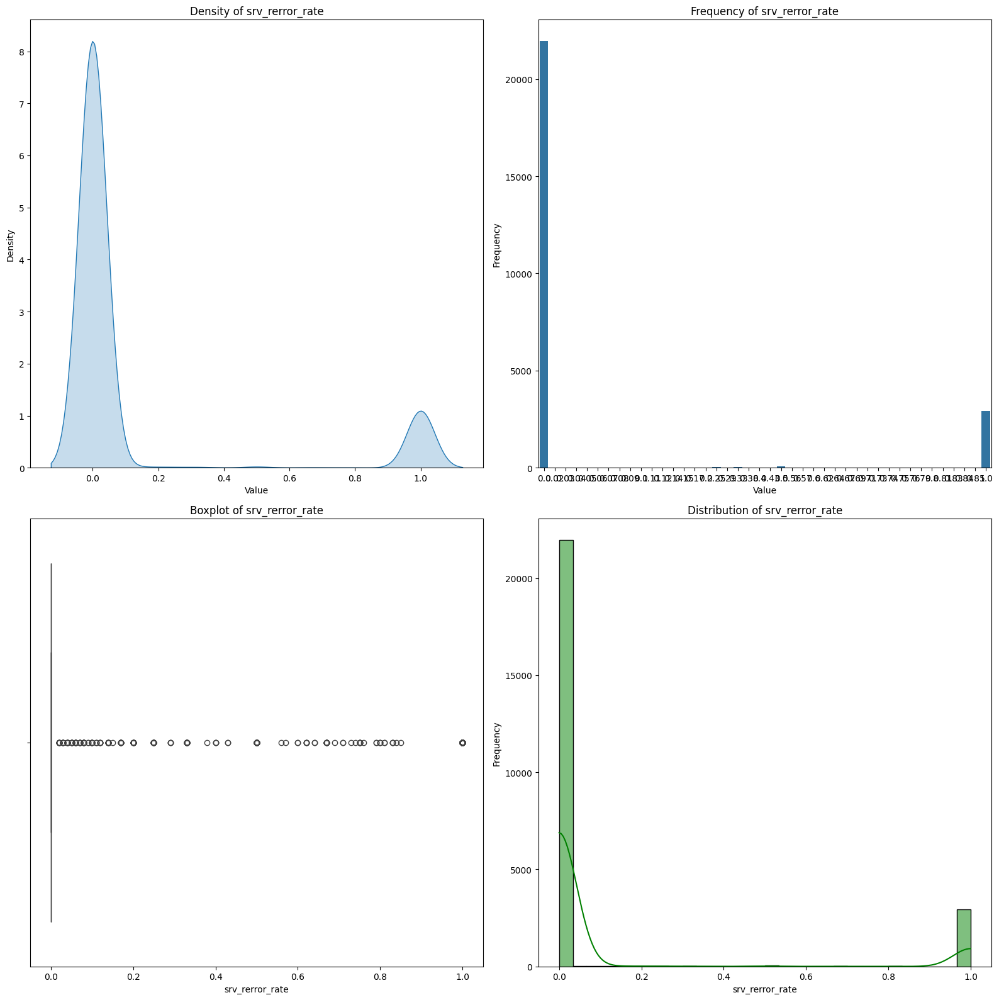



29. same_srv_rate
count    25192.000000
mean         0.660559
std          0.439637
min          0.000000
25%          0.090000
50%          1.000000
75%          1.000000
max          1.000000
Name: same_srv_rate, dtype: float64

Value Counts:
 same_srv_rate
1.00    15357
0.01      827
0.02      710
0.06      681
0.03      678
        ...  
0.78        1
0.87        1
0.61        1
0.85        1
0.81        1
Name: count, Length: 97, dtype: int64


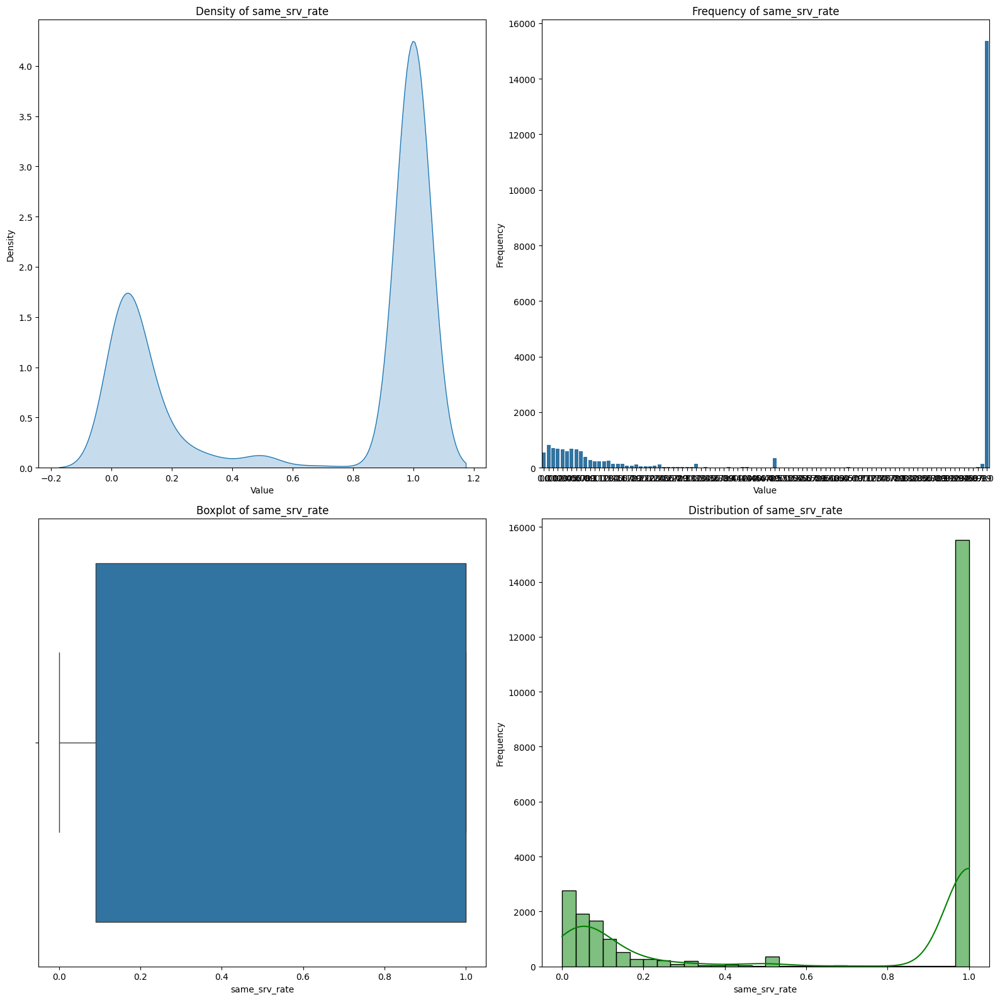



30. diff_srv_rate
count    25192.000000
mean         0.062363
std          0.178550
min          0.000000
25%          0.000000
50%          0.000000
75%          0.060000
max          1.000000
Name: diff_srv_rate, dtype: float64

Value Counts:
 diff_srv_rate
0.00    15245
0.06     3861
0.07     1947
0.05     1350
1.00      663
        ...  
0.61        1
0.58        1
0.79        1
0.64        1
0.70        1
Name: count, Length: 79, dtype: int64


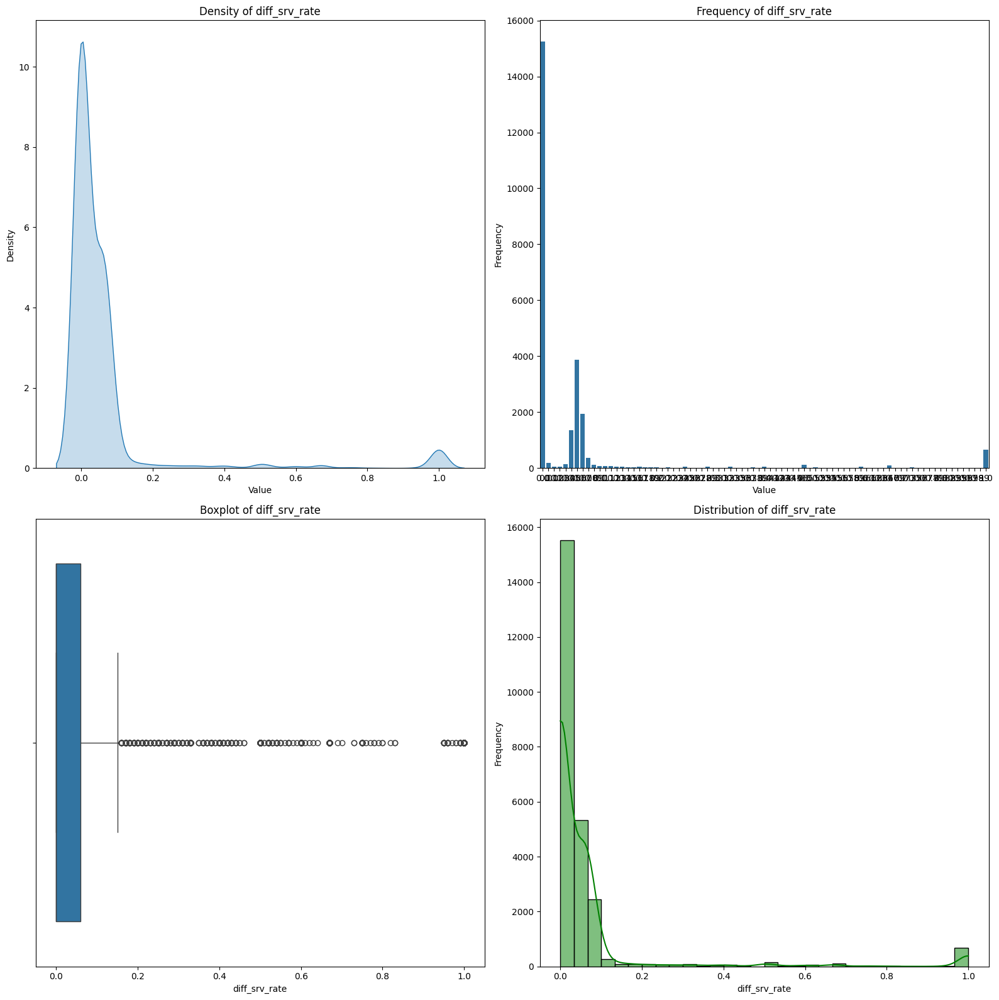



31. srv_diff_host_rate
count    25192.000000
mean         0.095931
std          0.256583
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: srv_diff_host_rate, dtype: float64

Value Counts:
 srv_diff_host_rate
0.00    19517
1.00     1559
0.01      586
0.67      210
0.50      193
0.12      170
0.33      167
0.25      164
0.02      153
0.11      143
0.10      138
0.29      129
0.18      129
0.17      128
0.08      124
0.40      123
0.20      122
0.14      121
0.06      118
0.09      112
0.22      111
0.15      111
0.07      111
0.13       81
0.05       59
0.75       58
0.19       57
0.21       47
0.16       46
0.23       43
0.27       42
0.60       41
0.03       40
0.04       39
0.43       34
0.30       29
0.38       28
0.36       21
0.80       14
0.24       11
0.31       11
0.57        7
0.44        7
0.28        6
0.42        5
0.56        4
0.26        4
0.62        3
0.45        3
0.71        3
0.35        2
0.37     

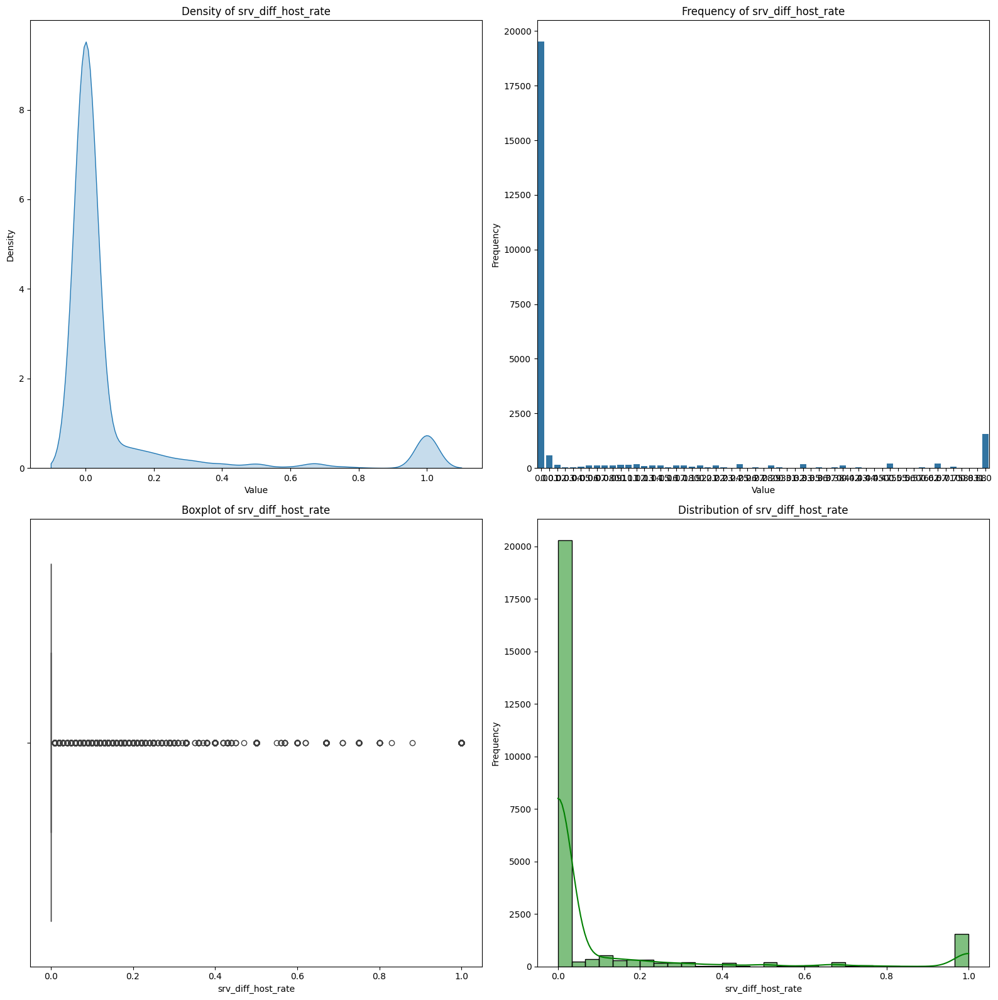



32. dst_host_count
count    25192.000000
mean       182.532074
std         98.993895
min          0.000000
25%         84.000000
50%        255.000000
75%        255.000000
max        255.000000
Name: dst_host_count, dtype: float64

Value Counts:
 dst_host_count
255    14850
1        601
2        554
3        251
4        241
       ...  
219       11
229       10
206        9
233        8
0          1
Name: count, Length: 256, dtype: int64


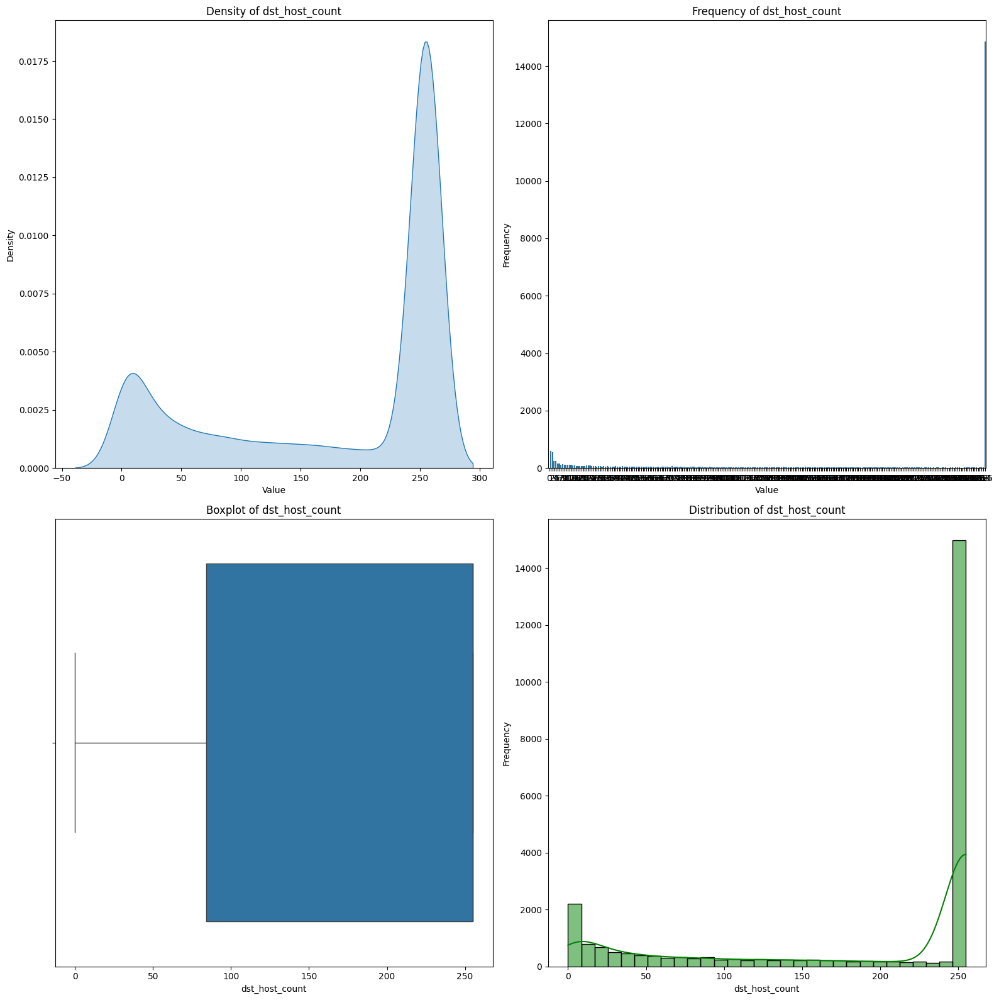



33. dst_host_srv_count
count    25192.000000
mean       115.063036
std        110.646850
min          0.000000
25%         10.000000
50%         61.000000
75%        255.000000
max        255.000000
Name: dst_host_srv_count, dtype: float64

Value Counts:
 dst_host_srv_count
255    7148
1      1658
2      1041
3       556
4       516
       ... 
188      11
204      10
220       9
221       7
0         1
Name: count, Length: 256, dtype: int64


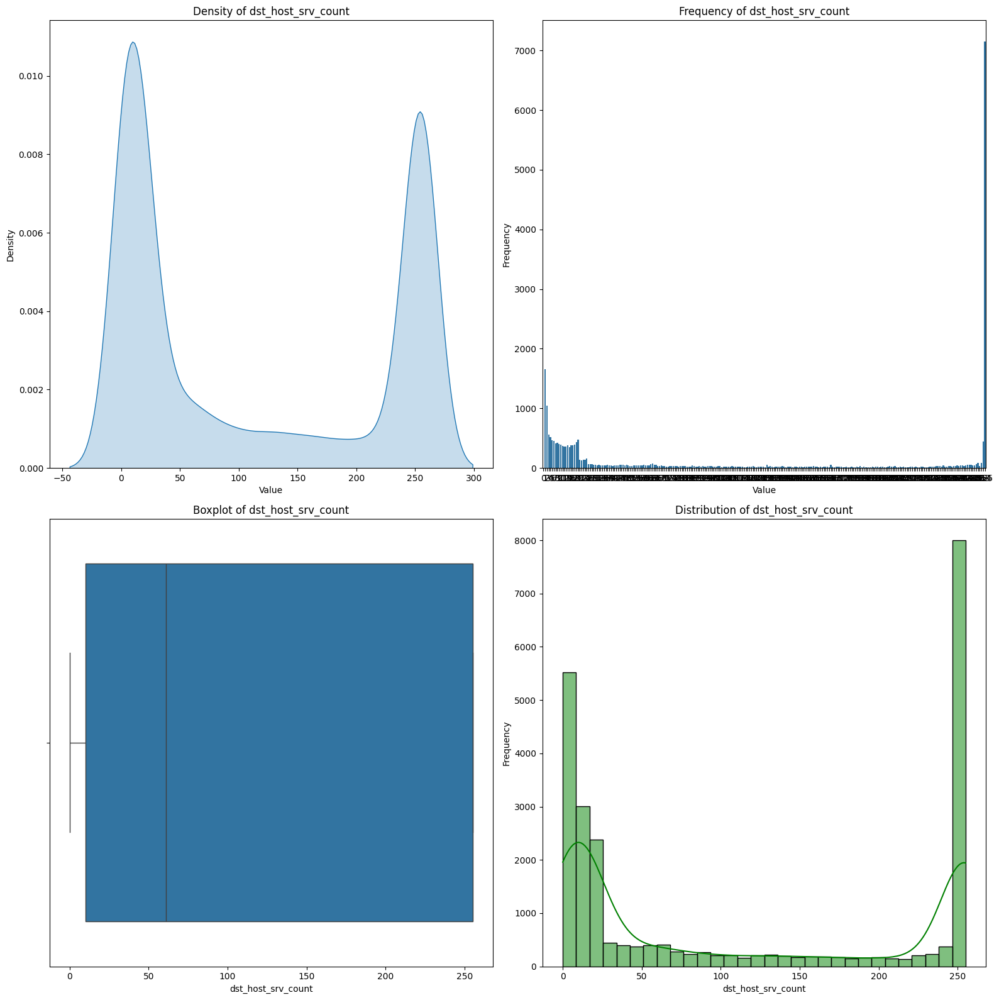



34. dst_host_same_srv_rate
count    25192.000000
mean         0.519791
std          0.448944
min          0.000000
25%          0.050000
50%          0.510000
75%          1.000000
max          1.000000
Name: dst_host_same_srv_rate, dtype: float64

Value Counts:
 dst_host_same_srv_rate
1.00    9758
0.01    1541
0.00    1379
0.02    1325
0.07    1122
        ... 
0.48      33
0.51      33
0.68      32
0.42      30
0.66      26
Name: count, Length: 101, dtype: int64


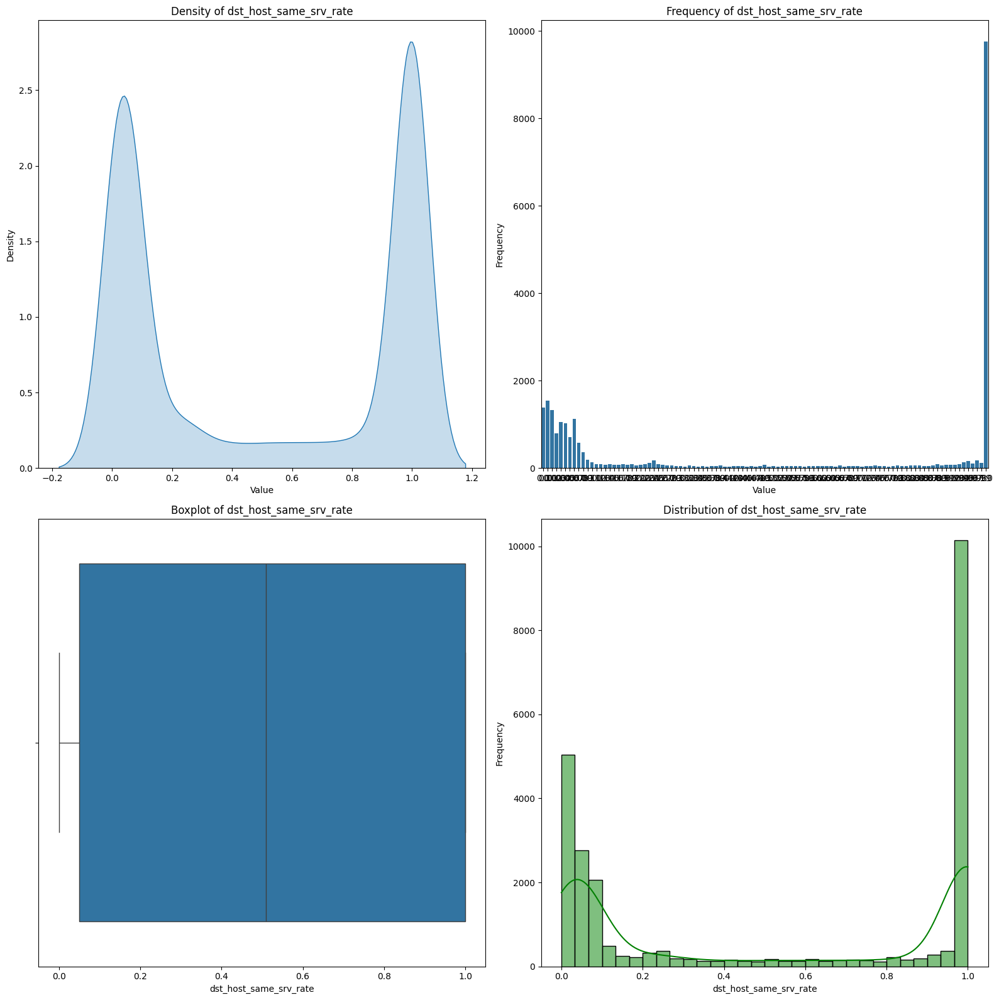



35. dst_host_diff_srv_rate
count    25192.000000
mean         0.082539
std          0.187191
min          0.000000
25%          0.000000
50%          0.030000
75%          0.070000
max          1.000000
Name: dst_host_diff_srv_rate, dtype: float64

Value Counts:
 dst_host_diff_srv_rate
0.00    9343
0.07    3448
0.06    1917
0.01    1881
0.05    1436
        ... 
0.41       6
0.98       6
0.88       5
0.90       5
0.93       3
Name: count, Length: 101, dtype: int64


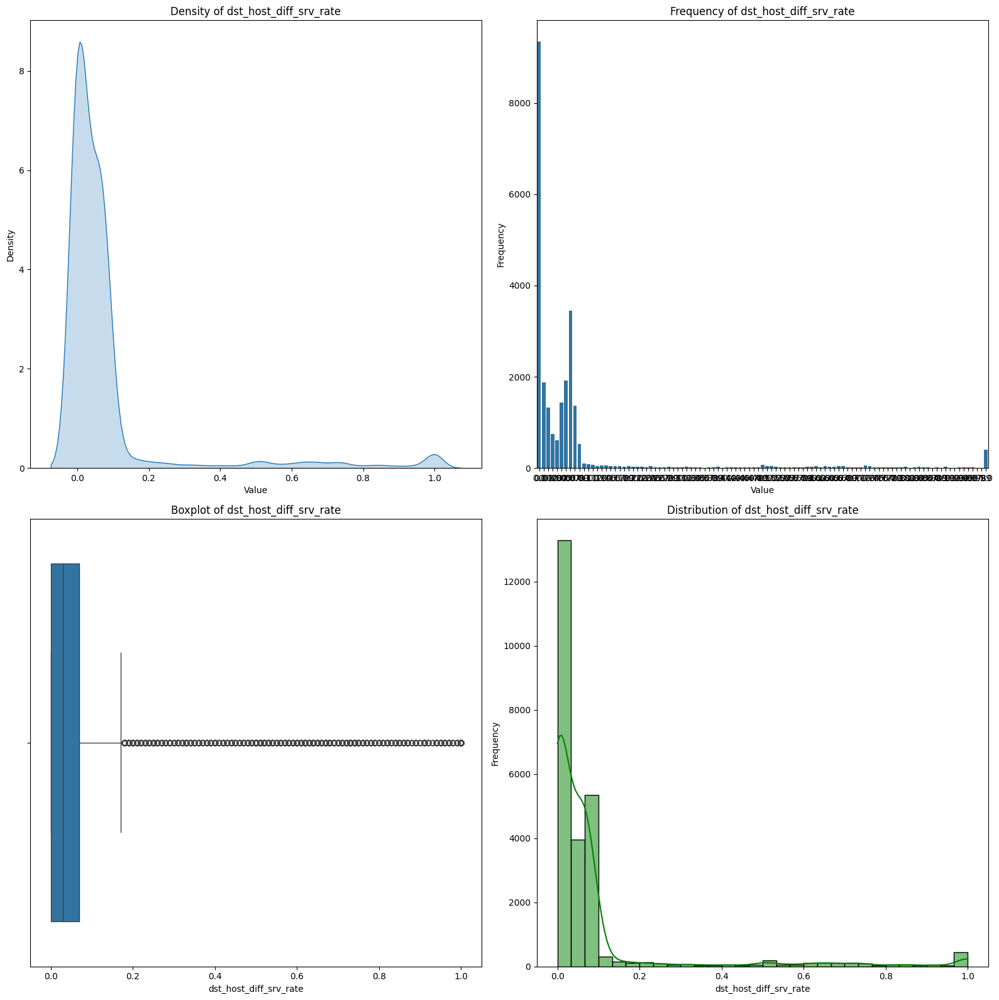



36. dst_host_same_src_port_rate
count    25192.000000
mean         0.147453
std          0.308367
min          0.000000
25%          0.000000
50%          0.000000
75%          0.060000
max          1.000000
Name: dst_host_same_src_port_rate, dtype: float64

Value Counts:
 dst_host_same_src_port_rate
0.00    12673
0.01     3557
1.00     2052
0.02     1115
0.03      624
        ...  
0.65       11
0.63       11
0.72       10
0.66        9
0.81        9
Name: count, Length: 101, dtype: int64


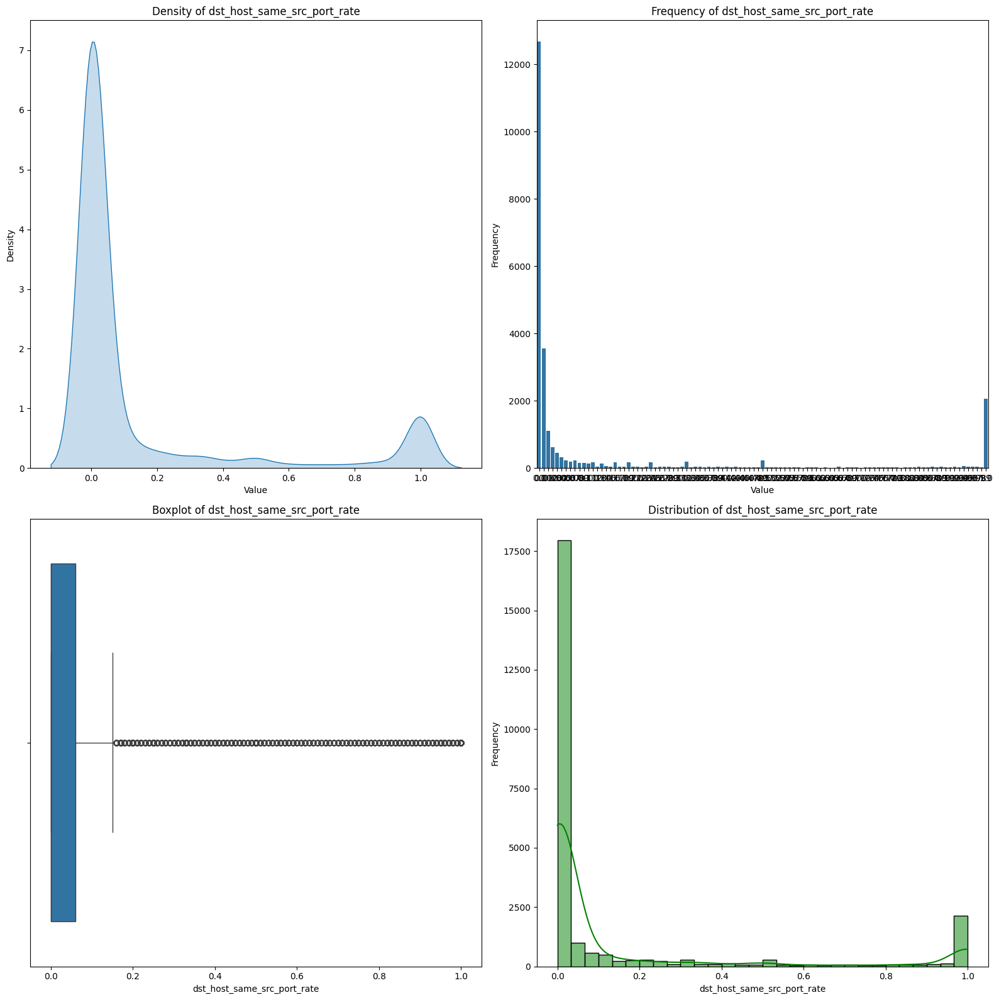



37. dst_host_srv_diff_host_rate
count    25192.000000
mean         0.031844
std          0.110575
min          0.000000
25%          0.000000
50%          0.000000
75%          0.020000
max          1.000000
Name: dst_host_srv_diff_host_rate, dtype: float64

Value Counts:
 dst_host_srv_diff_host_rate
0.00    17387
0.02     1612
0.01     1468
0.03      950
0.04      870
        ...  
0.97        1
0.46        1
0.36        1
0.42        1
0.86        1
Name: count, Length: 63, dtype: int64


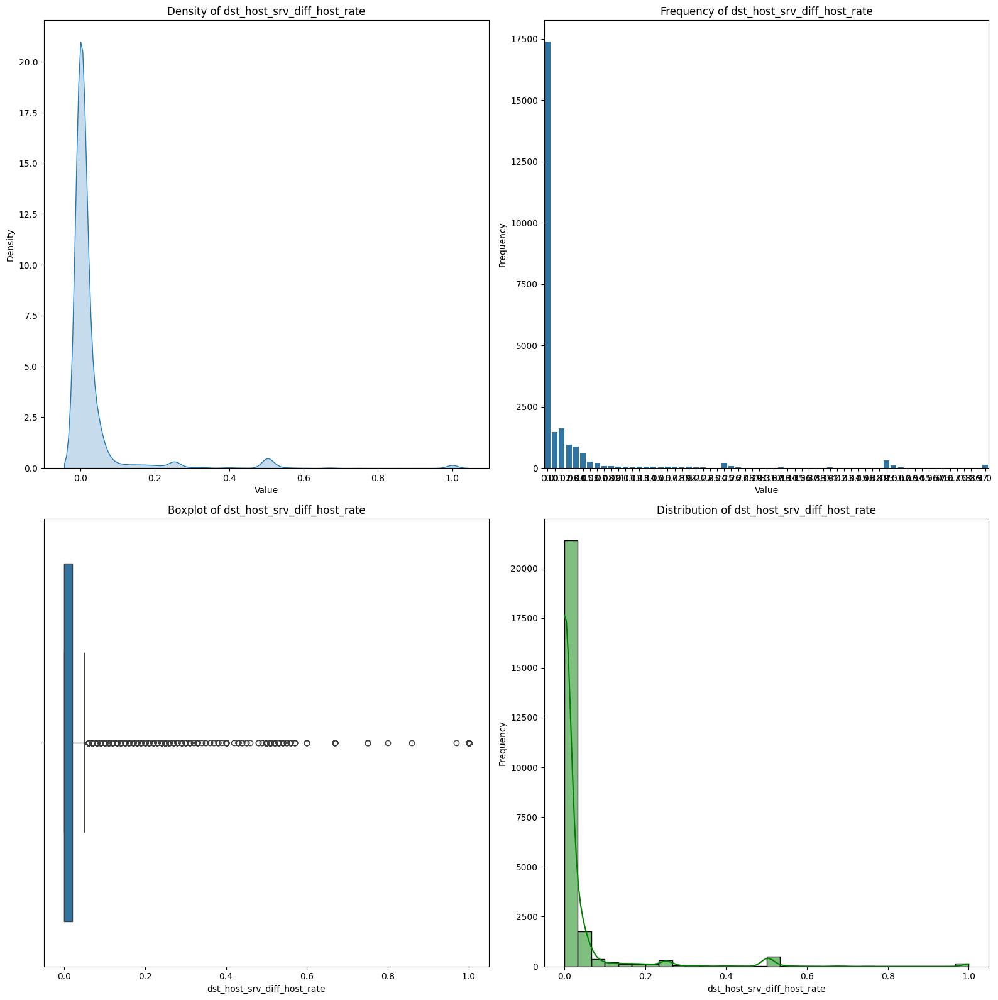



38. dst_host_serror_rate
count    25192.000000
mean         0.285800
std          0.445316
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: dst_host_serror_rate, dtype: float64

Value Counts:
 dst_host_serror_rate
0.00    16221
1.00     6739
0.01      680
0.02      237
0.03      149
        ...  
0.61        1
0.28        1
0.32        1
0.83        1
0.54        1
Name: count, Length: 100, dtype: int64


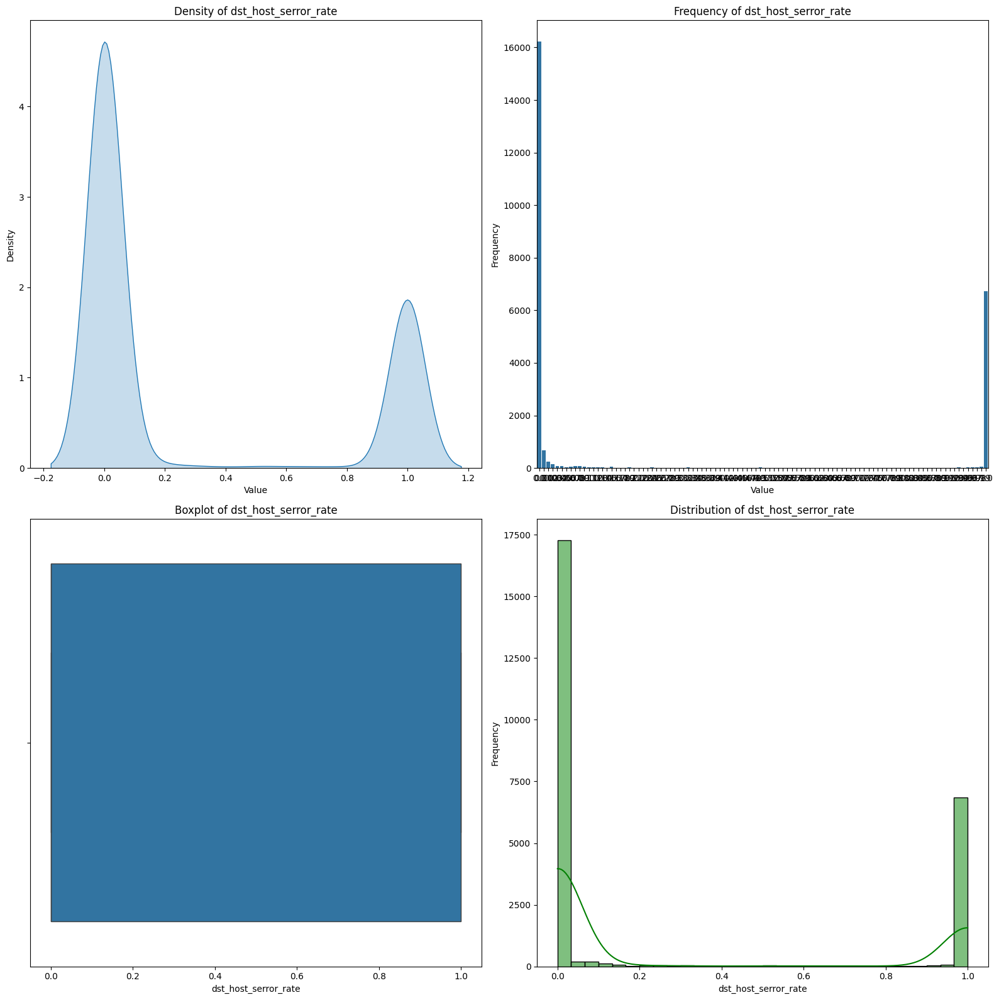



39. dst_host_srv_serror_rate
count    25192.000000
mean         0.279846
std          0.446075
min          0.000000
25%          0.000000
50%          0.000000
75%          1.000000
max          1.000000
Name: dst_host_srv_serror_rate, dtype: float64

Value Counts:
 dst_host_srv_serror_rate
0.00    17005
1.00     6862
0.01      758
0.02      136
0.03       32
        ...  
0.59        1
0.77        1
0.39        1
0.23        1
0.86        1
Name: count, Length: 88, dtype: int64


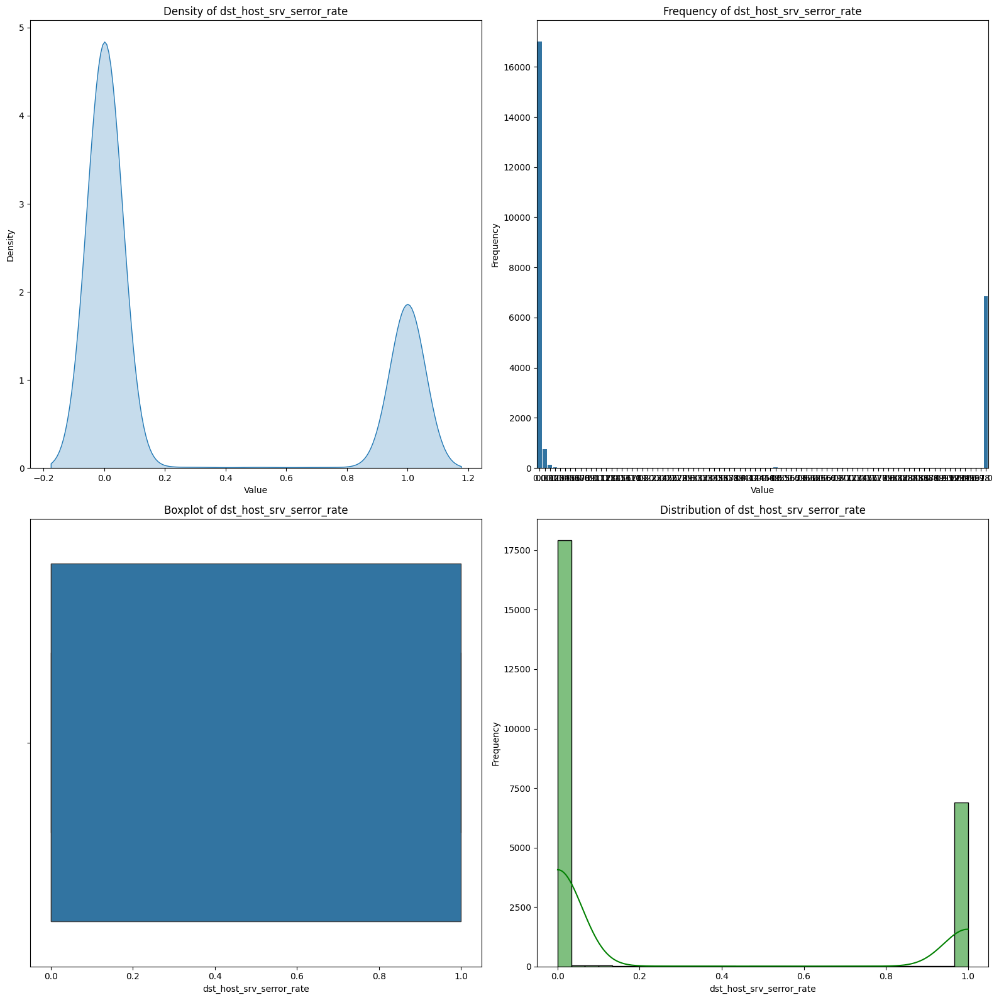



40. dst_host_rerror_rate
count    25192.000000
mean         0.117800
std          0.305869
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: dst_host_rerror_rate, dtype: float64

Value Counts:
 dst_host_rerror_rate
0.00    20688
1.00     2069
0.01      359
0.02      232
0.03      110
        ...  
0.39        7
0.54        7
0.99        7
0.60        6
0.48        4
Name: count, Length: 101, dtype: int64


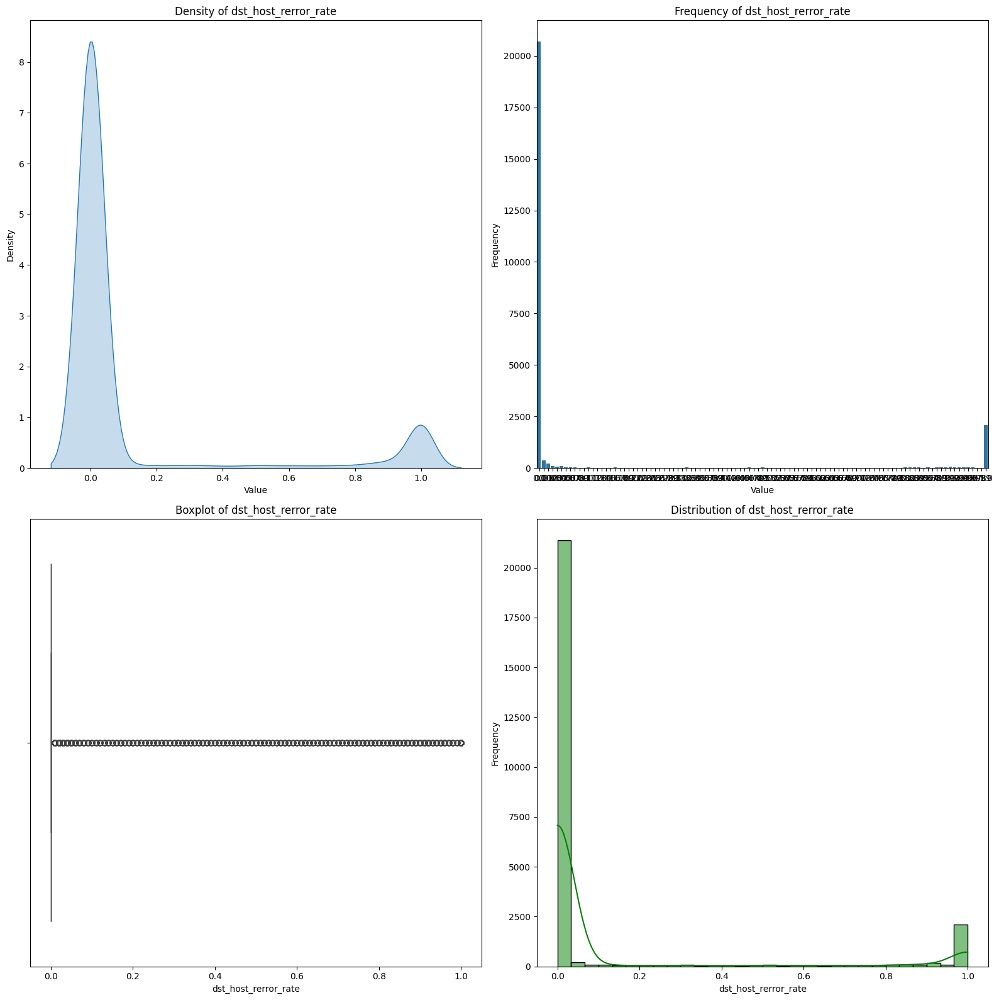



41. dst_host_srv_rerror_rate
count    25192.000000
mean         0.118769
std          0.317333
min          0.000000
25%          0.000000
50%          0.000000
75%          0.000000
max          1.000000
Name: dst_host_srv_rerror_rate, dtype: float64

Value Counts:
 dst_host_srv_rerror_rate
0.00    21349
1.00     2617
0.01      253
0.02      124
0.03       78
        ...  
0.26        1
0.44        1
0.21        1
0.43        1
0.46        1
Name: count, Length: 100, dtype: int64


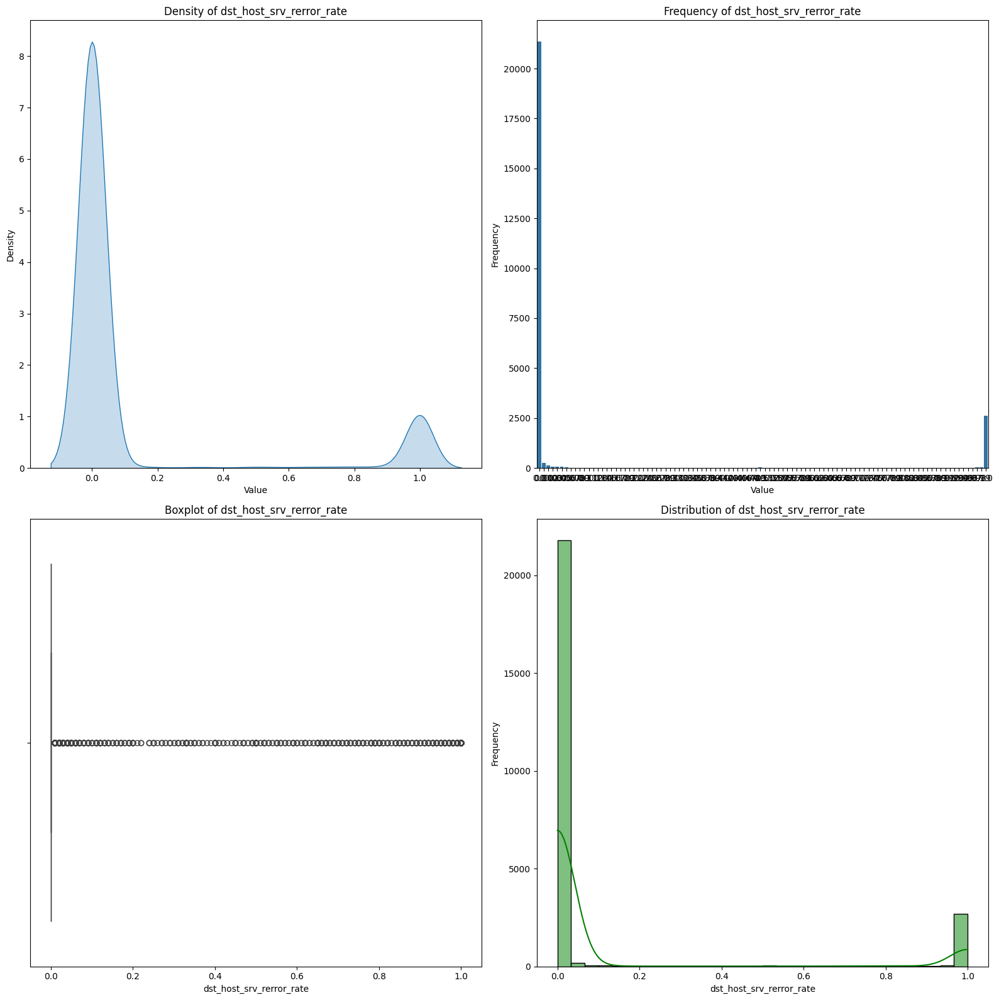

In [ ]:
for j, i in enumerate(x.columns, 1):
    print(f"{j}. {i}\n{'=' * 50}")
    print(x[i].describe())
    print("\nValue Counts:\n", data[i].value_counts())

    fig, axes = plt.subplots(2, 2, figsize=(12, 12))

    # Density Plot
    sns.kdeplot(x[i], fill=True, ax=axes[0, 0])  # Changed axes[0] to axes[0, 0]
    axes[0,0].set_title(f'Density of {i}')
    axes[0,0].set_xlabel('Value')
    axes[0,0].set_ylabel('Density')

    # Frequency Plot (Countplot)
    sns.countplot(x=x[i], ax=axes[0, 1])  # Changed axes[1] to axes[0, 1]
    axes[0,1].set_title(f'Frequency of {i}')
    axes[0,1].set_xlabel('Value')
    axes[0,1].set_ylabel('Frequency')

    # Boxplot
    sns.boxplot(x=data[i], ax=axes[1, 0])  # Using axes[1, 0] for the boxplot
    axes[1,0].set_title(f'Boxplot of {i}')  # Setting the title for the boxplot axes
    axes[1,0].set_xlabel(i)              # Setting the x-axis label for the boxplot axes

    sns.histplot(data[i], kde=True, bins=30, color='green', ax=axes[1, 1]) # Added ax=axes[1, 1]
    axes[1,1].set_title(f'Distribution of {i}')
    axes[1,1].set_xlabel(i)
    axes[1,1].set_ylabel('Frequency')


    plt.tight_layout()
    plt.show()

    print("\n" + "=" * 127 + "\n")

num_outbound_cmds column has only one unique value over all i,e. [0]

Value Counts:
 num_outbound_cmds
0    25192
Name: count, dtype: int64


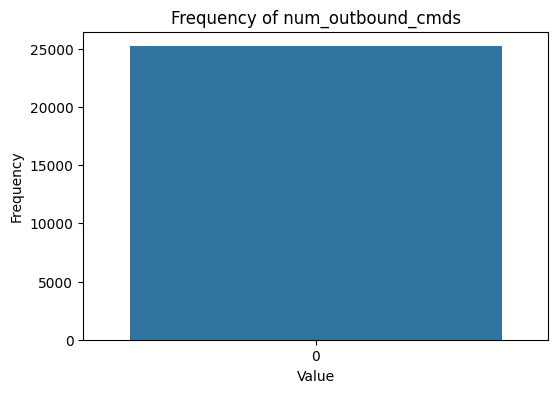

so we can drop num_outbound_cmds from x


is_host_login column has only one unique value over all i,e. [0]

Value Counts:
 is_host_login
0    25192
Name: count, dtype: int64


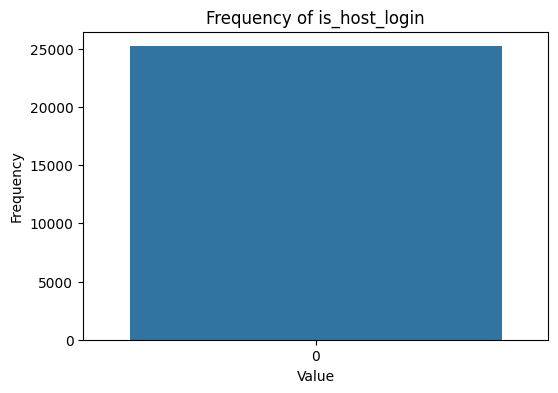

so we can drop is_host_login from x




In [ ]:
l=[]
for i in x.columns:
  if (len(x[i].unique())==1):
    l.append(i)
    print(f"{i} column has only one unique value over all i,e. {x[i].unique()}")
    print("\nValue Counts:\n", x[i].value_counts()) # Change to x[i] for value counts

    # Frequency Plot (Countplot) - You only need one subplot
    plt.figure(figsize=(6, 4))
    sns.countplot(x=x[i])
    plt.title(f'Frequency of {i}')
    plt.xlabel('Value')
    plt.ylabel('Frequency')

    plt.show()

    print(f"so we can drop {i} from x")
    x.drop(i,axis=1,inplace=True)

    print("\n" + "=" * 127 + "\n")

In [ ]:
if all(item not in x.columns for item in l):
  print("sucessfully dropped")
else:
  print("failed to drop")

sucessfully dropped


### split

In [ ]:
X_train, X_test, y_train, y_test = train_test_split(x, y, test_size=0.2, random_state=42)

print("Training Features shape (X_train):",X_train.shape)
print("\nTraining Labels shape (y_train):",y_train.shape)
print("\nTesting Features shape (X_test):",X_test.shape)
print("\nTesting Labels shape (y_test):",y_test.shape)

Training Features shape (X_train): (20153, 39)

Training Labels shape (y_train): (20153,)

Testing Features shape (X_test): (5039, 39)

Testing Labels shape (y_test): (5039,)


# Training


In [ ]:
from sklearn.linear_model import Perceptron, LogisticRegression
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier

In [ ]:
# objects for the models:
per = Perceptron()
LR = LogisticRegression()
svm=SVC()
knn=KNeighborsClassifier(n_neighbors=8)
dt = DecisionTreeClassifier()
rf = RandomForestClassifier()

###**Perceptron**

In [ ]:
per = Perceptron()
per.fit(X_train, y_train)
y_pred_per = per.predict(X_test)

In [ ]:
per_accuracy = accuracy_score(y_test, y_pred_per)
print(f"Accuracy (Perceptron): {per_accuracy}") # Changed 'pre_accuracy' to 'per_accuracy'

Accuracy (Perceptron): 0.31454653701131174


In [ ]:
conf_matrix_per = confusion_matrix(y_test, y_pred_per)
print(f"confusion matrix for perceptron model:\n{conf_matrix_per}")

confusion matrix for perceptron model:
[[1191 1174]
 [2280  394]]


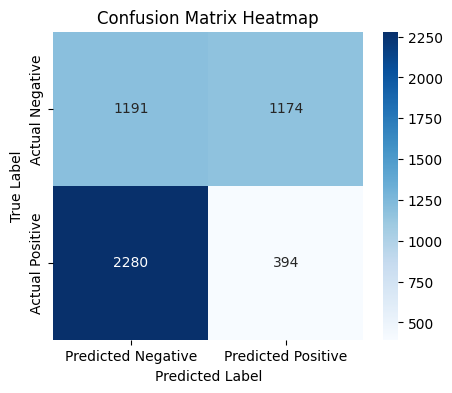

In [ ]:
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix_per, annot=True, fmt="d", cmap="Blues", xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
plt.title('Confusion Matrix Heatmap')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [ ]:
print(classification_report(y_test, y_pred_per))

              precision    recall  f1-score   support

           0       0.34      0.50      0.41      2365
           1       0.25      0.15      0.19      2674

    accuracy                           0.31      5039
   macro avg       0.30      0.33      0.30      5039
weighted avg       0.29      0.31      0.29      5039



###**Logistic Regression**

In [ ]:
LR = LogisticRegression()
model = LR.fit(X_train, y_train)
y_pred_log = model.predict(X_test)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
log_accuracy = accuracy_score(y_test, y_pred_log)
print(f"Accuracy (Logistic Regression): {log_accuracy}")

Accuracy (Logistic Regression): 0.8856916054772772


In [ ]:
conf_matrix_log = confusion_matrix(y_test, y_pred_log)
print(f"confusion matrix for logistic regression model:\n{conf_matrix_log}")

confusion matrix for logistic regression model:
[[2049  316]
 [ 260 2414]]


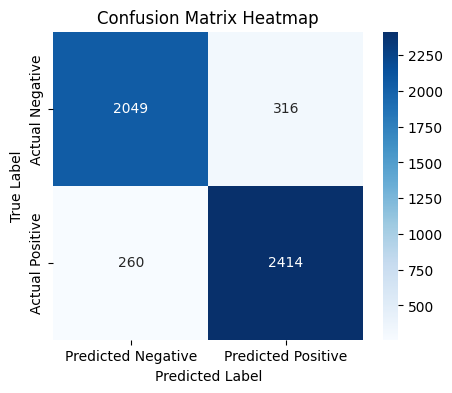

In [ ]:
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix_log, annot=True, fmt="d", cmap="Blues", xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
plt.title('Confusion Matrix Heatmap')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [ ]:
print(classification_report(y_test, y_pred_log))

              precision    recall  f1-score   support

           0       0.89      0.87      0.88      2365
           1       0.88      0.90      0.89      2674

    accuracy                           0.89      5039
   macro avg       0.89      0.88      0.89      5039
weighted avg       0.89      0.89      0.89      5039



###**SVM**

In [ ]:
svm = SVC()
svm.fit(X_train, y_train)
y_pred_svm = svm.predict(X_test)

In [ ]:
svm_accuracy= accuracy_score(y_test, y_pred_svm)
print(f"Accuracy (SVM): {svm_accuracy}")

Accuracy (SVM): 0.5314546537011312


In [ ]:
svm_conf_matrix = confusion_matrix(y_test, y_pred_svm)
print(f"confusion matrix for SVM model:\n{svm_conf_matrix}")

confusion matrix for SVM model:
[[   6 2359]
 [   2 2672]]


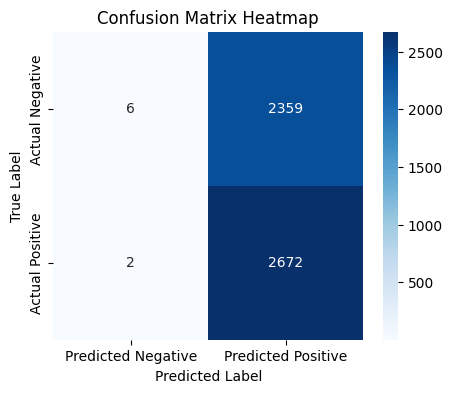

In [ ]:
plt.figure(figsize=(5, 4))
sns.heatmap(svm_conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
plt.title('Confusion Matrix Heatmap')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [ ]:
print(classification_report(y_test, y_pred_svm))

              precision    recall  f1-score   support

           0       0.75      0.00      0.01      2365
           1       0.53      1.00      0.69      2674

    accuracy                           0.53      5039
   macro avg       0.64      0.50      0.35      5039
weighted avg       0.63      0.53      0.37      5039



### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=8)
knn.fit(X_train, y_train)
y_pred_knn = knn.predict(X_test)

In [ ]:
knn_accuracy = accuracy_score(y_test, y_pred_knn)
print(f"Accuracy (KNN): {knn_accuracy}")

Accuracy (KNN): 0.9859099027584838


In [ ]:
conf_matrix_knn = confusion_matrix(y_test, y_pred_knn)
print(f"confusion matrix for KNN model:\n{conf_matrix_knn}")

confusion matrix for KNN model:
[[2332   33]
 [  38 2636]]


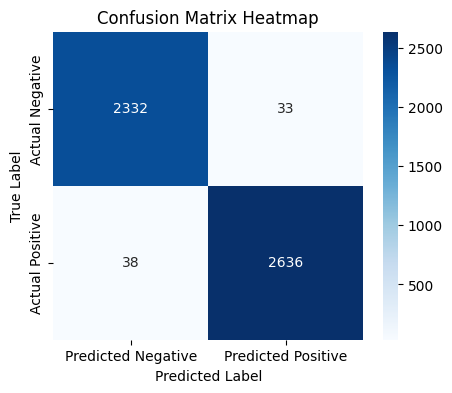

In [ ]:
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix_knn, annot=True, fmt="d", cmap="Blues", xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
plt.title('Confusion Matrix Heatmap')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [ ]:
print( classification_report(y_test, y_pred_knn))

              precision    recall  f1-score   support

           0       0.98      0.99      0.99      2365
           1       0.99      0.99      0.99      2674

    accuracy                           0.99      5039
   macro avg       0.99      0.99      0.99      5039
weighted avg       0.99      0.99      0.99      5039



### DT

In [ ]:
# Decision Tree
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()
dt.fit(X_train, y_train)
y_pred_dt = dt.predict(X_test)

In [ ]:
dt_accuracy = accuracy_score(y_test, y_pred_dt)
print(f"Accuracy (Decision Tree): {dt_accuracy}")

Accuracy (Decision Tree): 0.9956340543758683


In [ ]:
conf_matrix_dt = confusion_matrix(y_test, y_pred_dt)
print(f"confusion matrix for Decision Tree model:\n{conf_matrix_dt}")

confusion matrix for Decision Tree model:
[[2356    9]
 [  13 2661]]


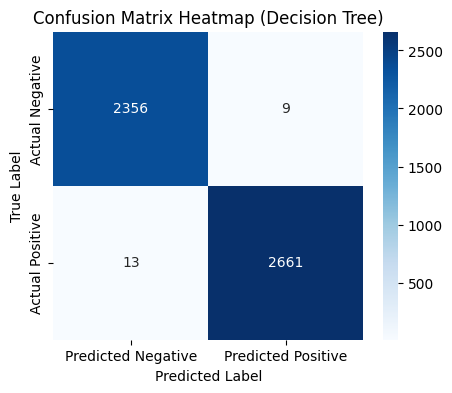

In [ ]:
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix_dt, annot=True, fmt="d", cmap="Blues", xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
plt.title('Confusion Matrix Heatmap (Decision Tree)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [ ]:
print(classification_report(y_test, y_pred_dt))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      2365
           1       1.00      1.00      1.00      2674

    accuracy                           1.00      5039
   macro avg       1.00      1.00      1.00      5039
weighted avg       1.00      1.00      1.00      5039



### RF

In [ ]:
# Random Forest
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(X_train, y_train)
y_pred_rf = rf.predict(X_test)

In [ ]:
rf_accuracy = accuracy_score(y_test, y_pred_rf)
print(f"Accuracy (Random Forest): {rf_accuracy}")

Accuracy (Random Forest): 0.9976185751141099


In [ ]:
conf_matrix_rf = confusion_matrix(y_test, y_pred_rf)
print(f"confusion matrix for Random Forest model:\n{conf_matrix_rf}")

confusion matrix for Random Forest model:
[[2356    9]
 [   3 2671]]


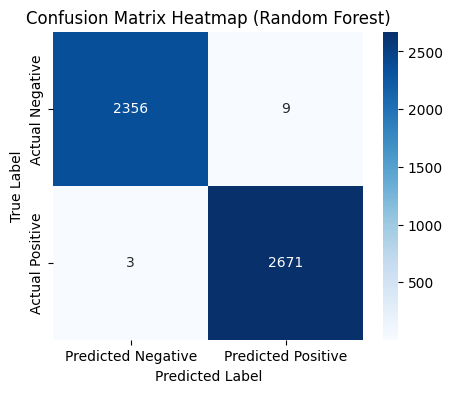

In [ ]:
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix_rf, annot=True, fmt="d", cmap="Blues", xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
plt.title('Confusion Matrix Heatmap (Random Forest)')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [ ]:
print(classification_report(y_test, y_pred_rf))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      2365
           1       1.00      1.00      1.00      2674

    accuracy                           1.00      5039
   macro avg       1.00      1.00      1.00      5039
weighted avg       1.00      1.00      1.00      5039



# PCA

In [ ]:
# Apply PCA
pca = PCA(n_components=15)  # Reduce to 15 dimensions
X_pca = pca.fit_transform(x)

# Explained variance ratio
print("Explained variance ratio:", pca.explained_variance_ratio_)

Explained variance ratio: [9.98642928e-01 1.35583441e-03 1.23106897e-06 3.68671004e-09
 1.75052196e-09 1.08631007e-09 3.83030815e-10 4.10447845e-11
 3.23565877e-11 8.02577889e-13 6.24749710e-13 9.23959394e-14
 4.77182351e-14 3.10895725e-14 2.11617007e-14]


In [ ]:
# Split the PCA-transformed data into training and testing sets
X_train_PCA, X_test_PCA, y_train_PCA, y_test_PCA = train_test_split(X_pca, y, test_size=0.3, random_state=42)

# Print the shapes to verify
print("Training set shape (features - PCA):", X_train_PCA.shape)
print("Training set shape (labels):", y_train_PCA.shape)
print("Testing set shape (features - PCA):", X_test_PCA.shape)
print("Testing set shape (labels):", y_test_PCA.shape)

Training set shape (features - PCA): (17634, 15)
Training set shape (labels): (17634,)
Testing set shape (features - PCA): (7558, 15)
Testing set shape (labels): (7558,)


## Training after PCA


###**Perceptron**

In [ ]:
per = Perceptron()
per.fit(X_train_PCA, y_train_PCA)
y_pred_per_PCA = per.predict(X_test_PCA)

In [ ]:
per_accuracy_PCA = accuracy_score(y_test_PCA, y_pred_per_PCA)
print(f"Accuracy (Perceptron) after PCA : {per_accuracy_PCA}") # Changed 'pre_accuracy' to 'per_accuracy'

Accuracy (Perceptron) after PCA : 0.5382376290023816


In [ ]:
conf_matrix_per_PCA = confusion_matrix(y_test_PCA, y_pred_per_PCA)
print(f"confusion matrix for perceptron model after PCA:\n{conf_matrix_per_PCA}")

confusion matrix for perceptron model after PCA:
[[  67 3449]
 [  41 4001]]


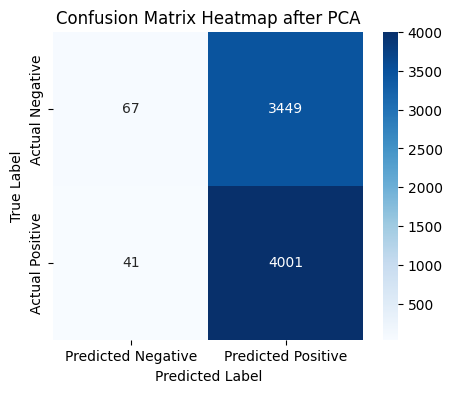

In [ ]:
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix_per_PCA, annot=True, fmt="d", cmap="Blues", xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
plt.title('Confusion Matrix Heatmap after PCA')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [ ]:
print(classification_report(y_test_PCA, y_pred_per_PCA))

              precision    recall  f1-score   support

           0       0.62      0.02      0.04      3516
           1       0.54      0.99      0.70      4042

    accuracy                           0.54      7558
   macro avg       0.58      0.50      0.37      7558
weighted avg       0.58      0.54      0.39      7558



###**Logistic Regression**

In [ ]:
LR = LogisticRegression()
model = LR.fit(X_train_PCA, y_train_PCA)
y_pred_log_PCA = model.predict(X_test_PCA)

/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:465: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
log_accuracy_PCA = accuracy_score(y_test_PCA, y_pred_log_PCA)
print(f"Accuracy (Logistic Regression) after PCA: {log_accuracy_PCA}")

Accuracy (Logistic Regression) after PCA: 0.8623974596454088


In [ ]:
conf_matrix_log_PCA = confusion_matrix(y_test_PCA, y_pred_log_PCA)
print(f"confusion matrix for logistic regression model after PCA:\n{conf_matrix_log_PCA}")

confusion matrix for logistic regression model after PCA:
[[3185  331]
 [ 709 3333]]


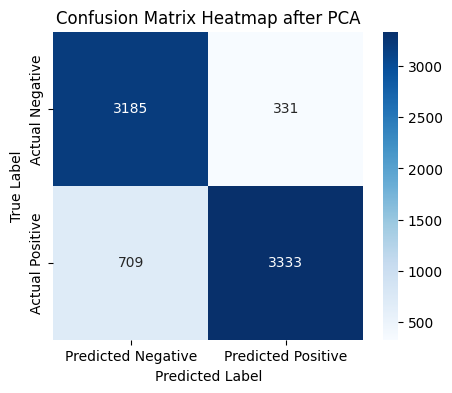

In [ ]:
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix_log_PCA, annot=True, fmt="d", cmap="Blues", xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
plt.title('Confusion Matrix Heatmap after PCA')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [ ]:
print(classification_report(y_test_PCA, y_pred_log_PCA))

              precision    recall  f1-score   support

           0       0.82      0.91      0.86      3516
           1       0.91      0.82      0.87      4042

    accuracy                           0.86      7558
   macro avg       0.86      0.87      0.86      7558
weighted avg       0.87      0.86      0.86      7558



###**SVM**

In [ ]:
svm = SVC()
svm.fit(X_train_PCA, y_train_PCA)
y_pred_svm_PCA = svm.predict(X_test_PCA)

In [ ]:
svm_accuracy_PCA= accuracy_score(y_test_PCA, y_pred_svm_PCA)
print(f"Accuracy (SVM) after PCA: {svm_accuracy_PCA}")

Accuracy (SVM) after PCA: 0.5354591161682984


In [ ]:
svm_conf_matrix_PCA = confusion_matrix(y_test_PCA, y_pred_svm_PCA)
print(f"confusion matrix for SVM model after PCA:\n{svm_conf_matrix_PCA}")

confusion matrix for SVM model after PCA:
[[   8 3508]
 [   3 4039]]


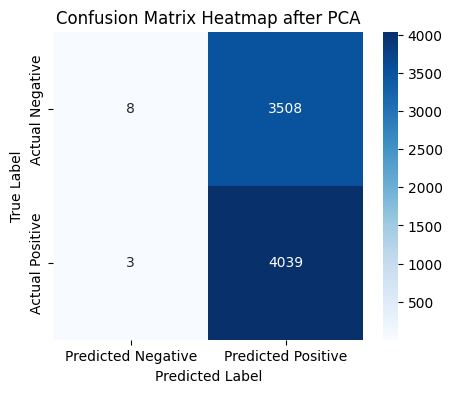

In [ ]:
plt.figure(figsize=(5, 4))
sns.heatmap(svm_conf_matrix_PCA, annot=True, fmt="d", cmap="Blues", xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
plt.title('Confusion Matrix Heatmap after PCA')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [ ]:
print(classification_report(y_test_PCA, y_pred_svm_PCA))

              precision    recall  f1-score   support

           0       0.73      0.00      0.00      3516
           1       0.54      1.00      0.70      4042

    accuracy                           0.54      7558
   macro avg       0.63      0.50      0.35      7558
weighted avg       0.62      0.54      0.37      7558



### KNN

In [ ]:
from sklearn.neighbors import KNeighborsClassifier
knn = KNeighborsClassifier(n_neighbors=8)
knn.fit(X_train_PCA, y_train_PCA)
y_pred_knn_PCA = knn.predict(X_test_PCA)

In [ ]:
knn_accuracy_PCA = accuracy_score(y_test_PCA, y_pred_knn_PCA)
print(f"Accuracy (KNN) after PCA: {knn_accuracy_PCA}")

Accuracy (KNN) after PCA: 0.9831966128605452


In [ ]:
conf_matrix_knn_PCA = confusion_matrix(y_test_PCA, y_pred_knn_PCA)
print(f"confusion matrix for KNN model after PCA:\n{conf_matrix_knn_PCA}")

confusion matrix for KNN model after PCA:
[[3458   58]
 [  69 3973]]


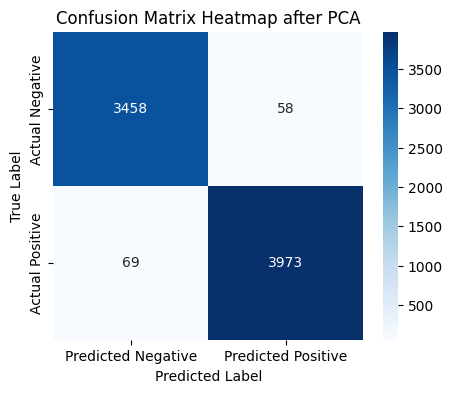

In [ ]:
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix_knn_PCA, annot=True, fmt="d", cmap="Blues", xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
plt.title('Confusion Matrix Heatmap after PCA')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [ ]:
print( classification_report(y_test_PCA, y_pred_knn_PCA))

              precision    recall  f1-score   support

           0       0.98      0.98      0.98      3516
           1       0.99      0.98      0.98      4042

    accuracy                           0.98      7558
   macro avg       0.98      0.98      0.98      7558
weighted avg       0.98      0.98      0.98      7558



### DT

In [ ]:
# Decision Tree
from sklearn.tree import DecisionTreeClassifier
dt = DecisionTreeClassifier()
dt.fit(X_train_PCA, y_train_PCA)
y_pred_dt_PCA = dt.predict(X_test_PCA)

In [ ]:
dt_accuracy_PCA = accuracy_score(y_test_PCA, y_pred_dt_PCA)
print(f"Accuracy (Decision Tree) after PCA: {dt_accuracy_PCA}")

Accuracy (Decision Tree) after PCA: 0.9953691452765282


In [ ]:
conf_matrix_dt_PCA = confusion_matrix(y_test_PCA, y_pred_dt_PCA)
print(f"confusion matrix for Decision Tree model after PCA:\n{conf_matrix_dt_PCA}")

confusion matrix for Decision Tree model after PCA:
[[3503   13]
 [  22 4020]]


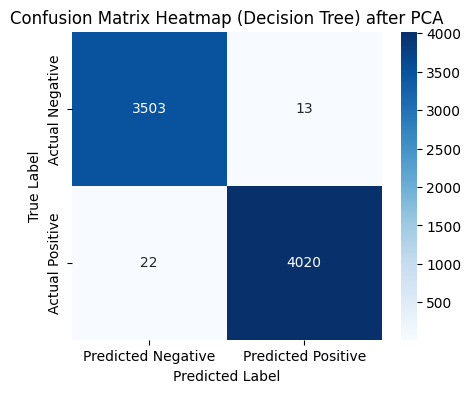

In [ ]:
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix_dt_PCA, annot=True, fmt="d", cmap="Blues", xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
plt.title('Confusion Matrix Heatmap (Decision Tree) after PCA')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [ ]:
print(classification_report(y_test_PCA, y_pred_dt_PCA))

              precision    recall  f1-score   support

           0       0.99      1.00      1.00      3516
           1       1.00      0.99      1.00      4042

    accuracy                           1.00      7558
   macro avg       1.00      1.00      1.00      7558
weighted avg       1.00      1.00      1.00      7558



### RF

In [ ]:
# Random Forest
from sklearn.ensemble import RandomForestClassifier
rf = RandomForestClassifier()
rf.fit(X_train_PCA, y_train_PCA)
y_pred_rf_PCA = rf.predict(X_test_PCA)

In [ ]:
rf_accuracy_PCA = accuracy_score(y_test_PCA, y_pred_rf_PCA)
print(f"Accuracy (Random Forest) after PCA: {rf_accuracy_PCA}")

Accuracy (Random Forest) after PCA: 0.9977507277057422


In [ ]:
conf_matrix_rf_PCA = confusion_matrix(y_test_PCA, y_pred_rf_PCA)
print(f"confusion matrix for Random Forest model after PCA:\n{conf_matrix_rf_PCA}")

confusion matrix for Random Forest model after PCA:
[[3508    8]
 [   9 4033]]


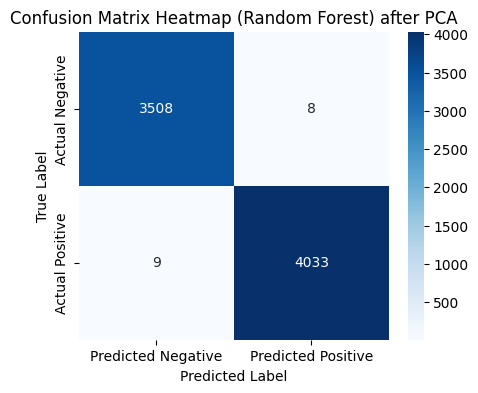

In [ ]:
plt.figure(figsize=(5, 4))
sns.heatmap(conf_matrix_rf_PCA, annot=True, fmt="d", cmap="Blues", xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
plt.title('Confusion Matrix Heatmap (Random Forest) after PCA')
plt.xlabel('Predicted Label')
plt.ylabel('True Label')
plt.show()

In [ ]:
print(classification_report(y_test_PCA, y_pred_rf_PCA))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00      3516
           1       1.00      1.00      1.00      4042

    accuracy                           1.00      7558
   macro avg       1.00      1.00      1.00      7558
weighted avg       1.00      1.00      1.00      7558



## comparision

In [ ]:
data = {
    "Model": ["Perceptron", "Logistic", "SVM", "KNN", "Decision Tree", "Random Forest"],
    "Before PCA": [per_accuracy,log_accuracy,svm_accuracy,knn_accuracy,dt_accuracy,rf_accuracy],
    "After PCA": [per_accuracy_PCA,log_accuracy_PCA,svm_accuracy_PCA,knn_accuracy_PCA,dt_accuracy_PCA,rf_accuracy_PCA]
}

df = pd.DataFrame(data)

df['difference'] = df['Before PCA'] - df['After PCA']

for i in range(len(df)):
  if df.loc[i, 'After PCA'] > df.loc[i, 'Before PCA']:
    df.loc[i, 'isIncreased'] = 'yes'
  else:
    df.loc[i, 'isIncreased'] = 'no'

df


,Model,Before PCA,After PCA,difference,isIncreased
0,Perceptron,0.314547,0.538238,-0.223691,yes
1,Logistic,0.885692,0.862397,0.023294,no
2,SVM,0.531455,0.535459,-0.004004,yes
3,KNN,0.985910,0.983197,0.002713,no
4,Decision Tree,0.995634,0.995369,0.000265,no
5,Random Forest,0.997619,0.997751,-0.000132,yes


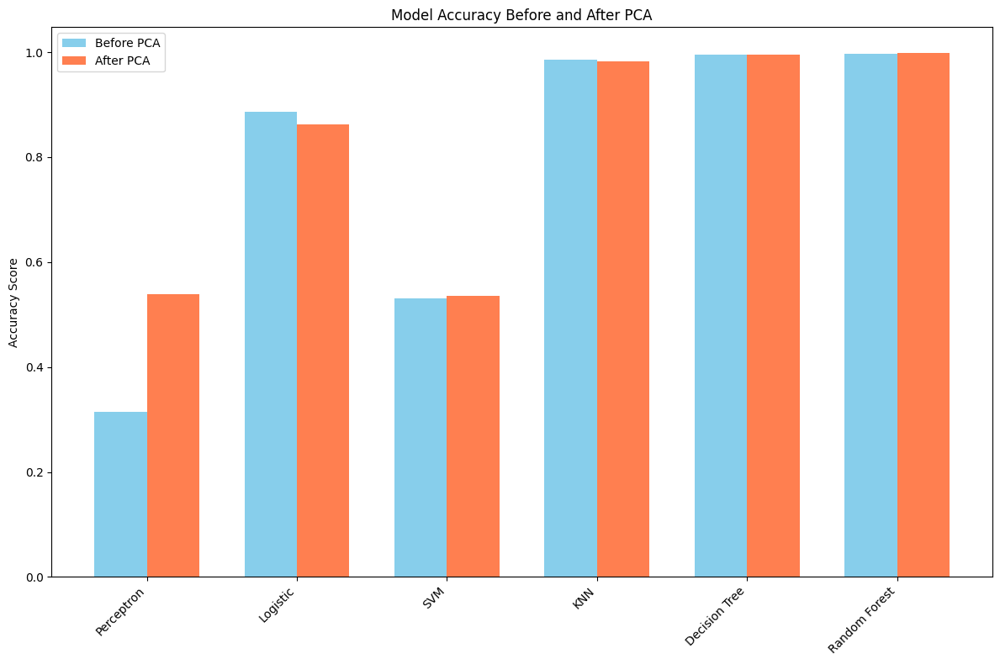

In [ ]:
x = np.arange(len(df['Model']))
width = 0.35  # the width of the bars

# Creating the bar plot
fig, ax = plt.subplots(figsize=(12, 8)) # Adjust figure size if needed
rects1 = ax.bar(x - width/2, df['Before PCA'], width, label='Before PCA', color='skyblue')
rects2 = ax.bar(x + width/2, df['After PCA'], width, label='After PCA', color='coral')

# Adding labels, title, and legend
ax.set_ylabel('Accuracy Score')
ax.set_title('Model Accuracy Before and After PCA')
ax.set_xticks(x)
ax.set_xticklabels(df['Model'], rotation=45, ha='right') # Rotating x-axis labels for better readability
ax.legend()

# Displaying the plot
plt.tight_layout()
plt.show()

In [ ]:
def bootstrap_model(model, x, y, x_test, y_test): # Added x_test, y_test as arguments
    n_iterations = 1000
    metrics = {'accuracy': [], 'precision': [], 'recall': [], 'f1': []}
    for _ in range(n_iterations):
        x_boot, y_boot = resample(x, y)
        model.fit(x_boot, y_boot)
        y_pred = model.predict(x_test)
        metrics['accuracy'].append(accuracy_score(y_test, y_pred))
        metrics['precision'].append(precision_score(y_test, y_pred))
        metrics['recall'].append(recall_score(y_test, y_pred))
        metrics['f1'].append(f1_score(y_test, y_pred))
    return metrics

In [ ]:
perceptron_metrics = bootstrap_model(per, X_train, y_train, X_test, y_test)

In [ ]:
lr_metrics = bootstrap_model(LR, X_train, y_train, X_test, y_test)

In [ ]:
knn_metrics = bootstrap_model(knn, X_train, y_train, X_test, y_test)

In [ ]:
dt_metrics = bootstrap_model(dt, X_train, y_train, X_test, y_test)

In [ ]:
rf_metrics = bootstrap_model(rf, X_train, y_train, X_test, y_test)

In [ ]:
#svm_metrics = bootstrap_model(svm, X_train, y_train, X_test, y_test)

In [ ]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_metric_distributions(metrics, model_name):
    fig, axes = plt.plot(2, 2, figsize=(12, 8))
    metrics_to_plot = ['accuracy', 'precision', 'recall', 'f1']
    titles = ['Accuracy', 'Precision', 'Recall', 'F1 Score']

    for ax, metric, title in zip(axes.flat, metrics_to_plot, titles):
        sns.kdeplot(y=metrics[metric], ax=ax, label=metric, fill=True)  # Using seaborn's kdeplot
        ax.set_title(f'Distribution of {title}')
        ax.set_xlabel('Density')
        ax.set_ylabel('Metric Value')
        ax.legend()

    plt.tight_layout()  # Adjust spacing
    fig.suptitle(f'Distribution of {model_name} Metrics after Bootstrapping', fontsize=16, y=1.02)  # Add a main title
    plt.show()

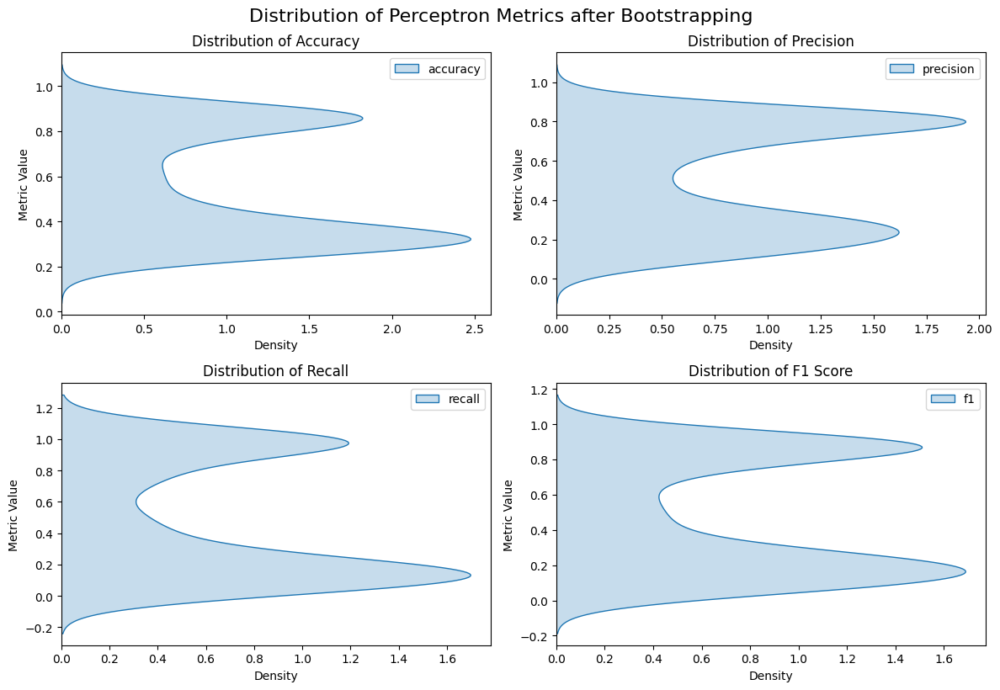

In [ ]:
plot_metric_distributions(perceptron_metrics, 'Perceptron')

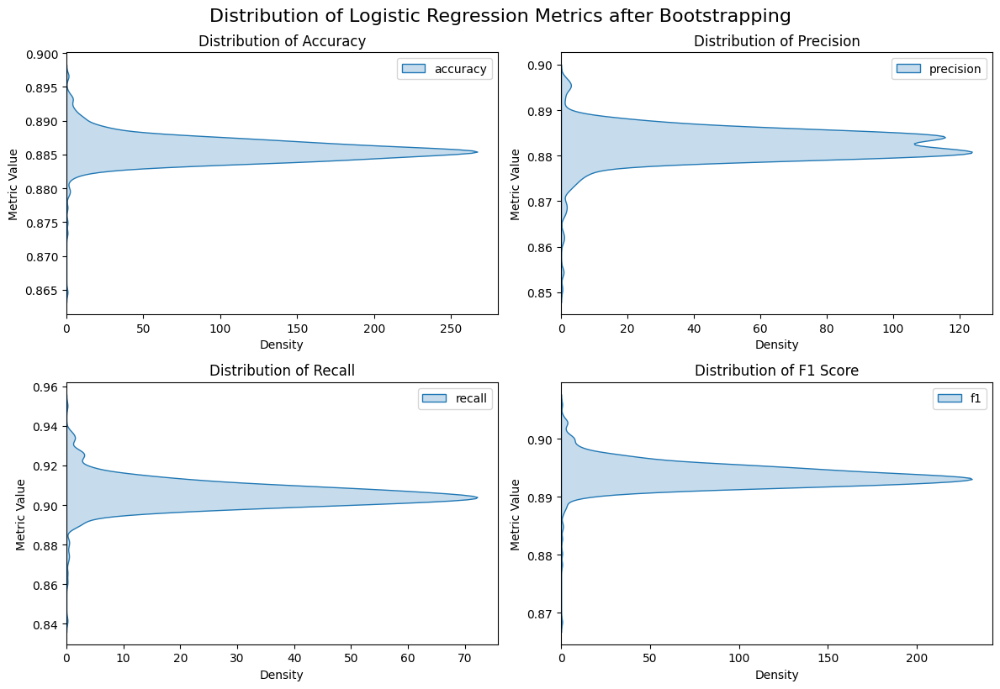

In [ ]:
plot_metric_distributions(lr_metrics, 'Logistic Regression')

In [ ]:
#plot_metric_distributions(svm_metrics, 'SVM')

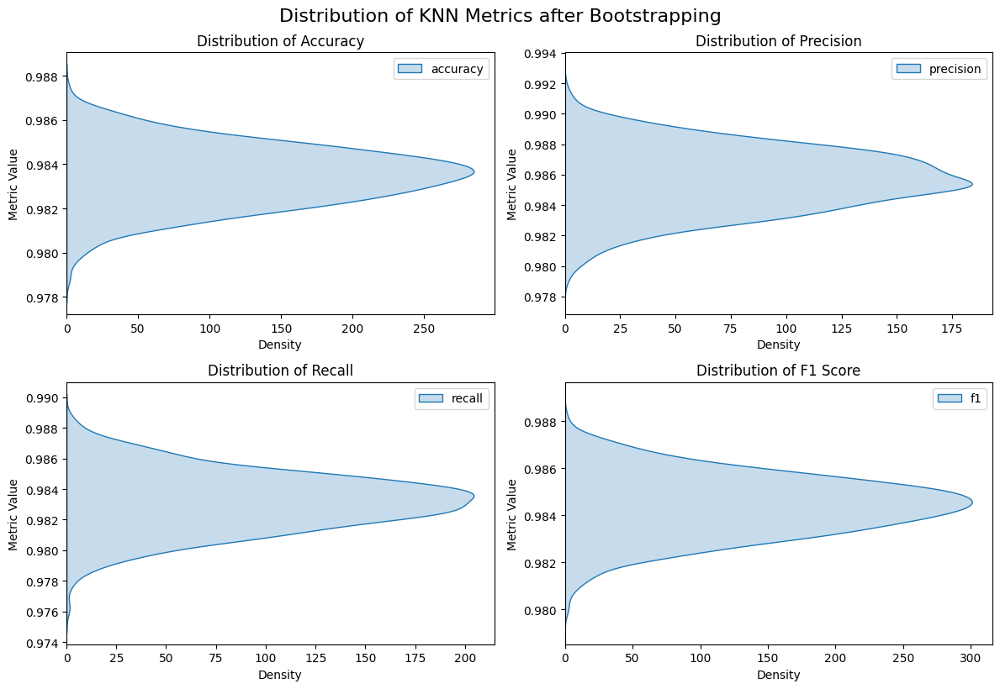

In [ ]:
plot_metric_distributions(knn_metrics, 'KNN')

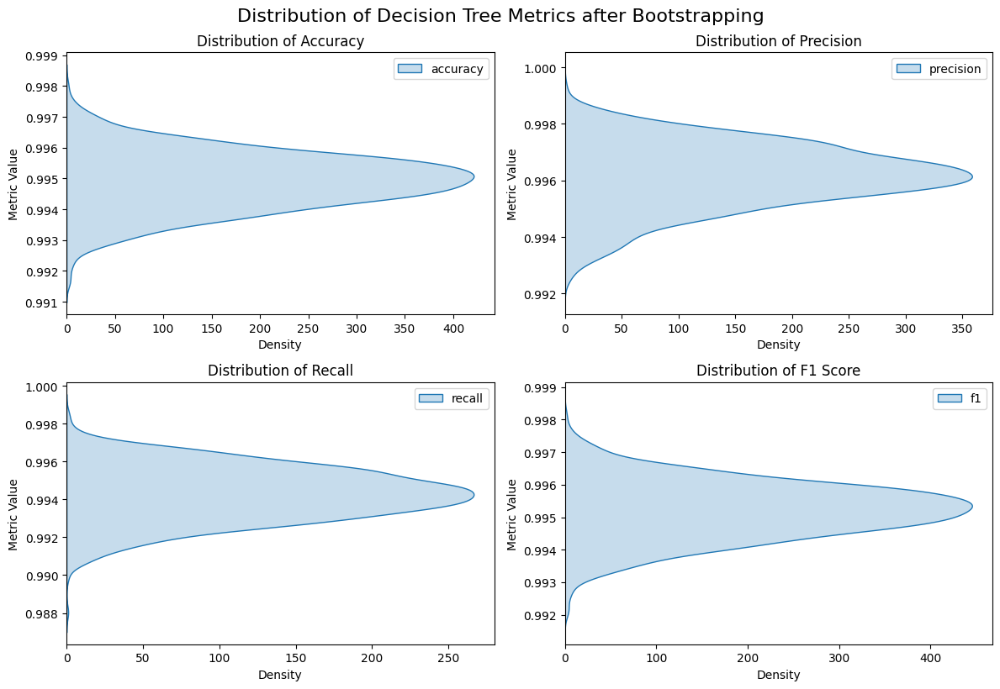

In [ ]:
plot_metric_distributions(dt_metrics, 'Decision Tree')

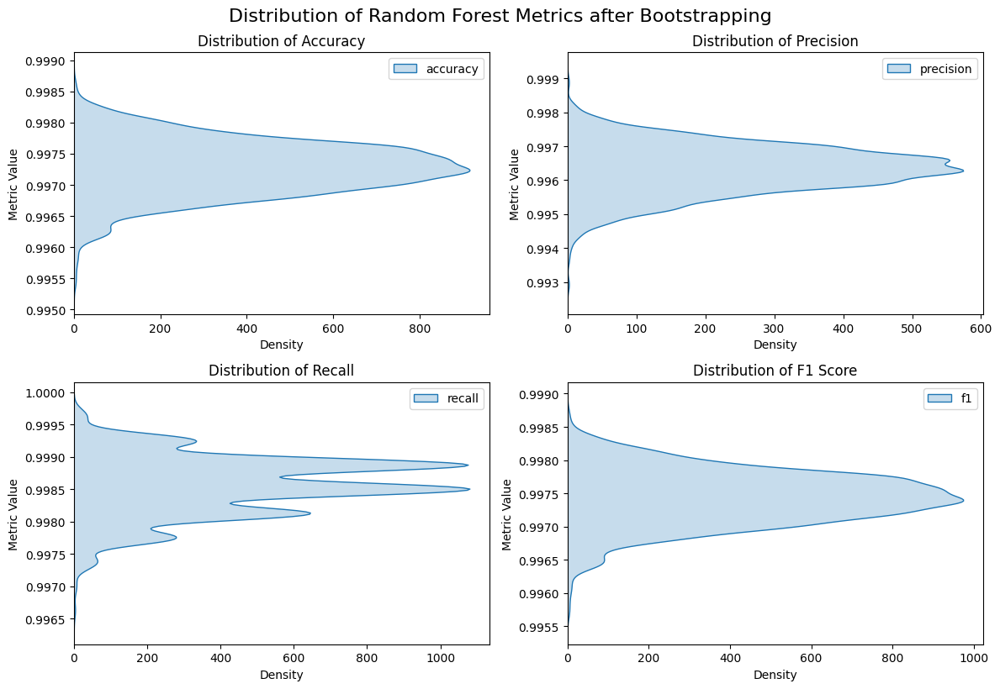

In [ ]:
plot_metric_distributions(rf_metrics, 'Random Forest')

# ANN (batch_size=32)

### lybs & standardization

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, roc_curve, auc
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam, SGD, RMSprop, Adagrad, Adadelta , SGD, Ftrl, Nadam, Adamax
from tensorflow.keras.callbacks import Callback

In [ ]:
# Scale the features (standardization)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Modules and classes

In [ ]:
# Function to build the ANN model
def build_model(input_dim):
    return Sequential([
        Dense(32, input_dim=input_dim, activation='relu'),
        Dense(16, activation='relu'),
        Dense(1, activation='sigmoid')
    ])

In [ ]:
# Custom callback to log weights after each epoch
class WeightsLogger(Callback):
    def __init__(self):
        self.weights_history = []

    def on_epoch_end(self, epoch, logs=None):
        weights = [layer.get_weights() for layer in self.model.layers]
        self.weights_history.append(weights)
        print(f"Epoch {epoch + 1} - Logged Weights")

In [ ]:
# Custom callback to print accuracy and loss after each epoch
class EpochMetricsLogger(Callback):
    def on_epoch_end(self, epoch, logs=None):
        print(f"Epoch {epoch + 1}: Loss = {logs['loss']:.4f}, Accuracy = {logs['accuracy']:.4f}")

In [ ]:
# Function to train the model with weight and metrics logging
def train_model_with_weights(optimizer_name, optimizer, X_train, y_train):
    print(f"Training with {optimizer_name} optimizer...")
    model = build_model(input_dim=X_train.shape[1])

    # Get initial weights
    initial_weights = [layer.get_weights() for layer in model.layers]
    #print("Initial Weights:", initial_weights)

    # Initialize the callbacks
    weights_logger = WeightsLogger()
    epoch_metrics_logger = EpochMetricsLogger()

    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    history = model.fit(
        X_train, y_train, validation_split=0.2, epochs=50, batch_size=32,
        verbose=0, callbacks=[weights_logger, epoch_metrics_logger]
    )

    return model, history, initial_weights, weights_logger.weights_history

In [ ]:
# Function to calculate metrics
def calculate_metrics(y_test, y_pred, y_pred_probs):
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    report = classification_report(y_test, y_pred)
    fpr, tpr, _ = roc_curve(y_test, y_pred_probs)
    roc_auc = auc(fpr, tpr)

    return accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc

In [ ]:
# Function to plot ROC curve
def plot_roc_curve(optimizer_name, fpr, tpr, roc_auc):
    plt.figure()
    plt.plot(fpr, tpr, label=f'{optimizer_name} (AUC = {roc_auc:.2f})')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {optimizer_name}')
    plt.legend(loc='lower right')
    plt.show()

In [ ]:
# Function to plot learning curve
def plot_learning_curve(history, optimizer_name):
    plt.figure()
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'Learning Curve - {optimizer_name}')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

In [ ]:
def plot_confusion_matrix(cm, optimizer_name):
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
    plt.title(f'Confusion Matrix Heatmap of {optimizer_name}') # Changed to f-string formatting
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

In [ ]:
# Main function to evaluate metrics by combining all the above
def evaluate_metrics(model, X_test, y_test, history, optimizer_name):
    y_pred_probs = model.predict(X_test)
    y_pred = (y_pred_probs > 0.5).astype(int)

    return y_pred, y_pred_probs

## optimizers

### metrices list

In [ ]:
models = []
accuracys = []
precisions = []
recalls = []
f1_scores = []

### ADAM

In [ ]:
# Training with Adam optimizer and logging weights and metrics
optimizer_name="Adam"
adam = Adam(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, adam, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with Adam optimizer...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.1557, Accuracy = 0.9467
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.0650, Accuracy = 0.9774
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.0461, Accuracy = 0.9854
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.0375, Accuracy = 0.9888
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.0323, Accuracy = 0.9900
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.0293, Accuracy = 0.9900
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.0275, Accuracy = 0.9913
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.0251, Accuracy = 0.9915
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.0234, Accuracy = 0.9924
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.0227, Accuracy = 0.9926
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.0214, Accuracy = 0.9922
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.0211, Accuracy = 0.9926
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.0198, Accuracy = 0.9931
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.0187, Accuracy = 0.9935
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.0174, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for Adam Optimizer:
--------------------------------------------------
Accuracy: 0.9924588211946815

Precision: 0.9958615500376222

Recall: 0.9899027673896784

F1-Score: 0.9928732183045762

ROC AUC: 0.9989541446012895


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2354   11]
 [  27 2647]]


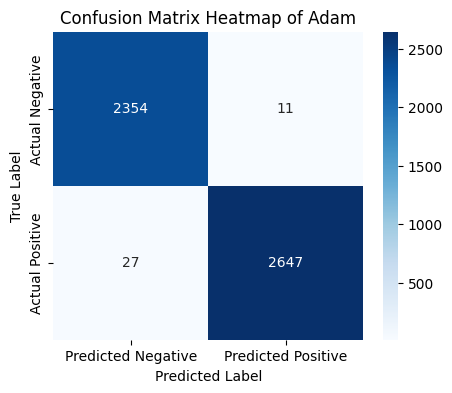

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2365
           1       1.00      0.99      0.99      2674

    accuracy                           0.99      5039
   macro avg       0.99      0.99      0.99      5039
weighted avg       0.99      0.99      0.99      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy}")

Test Accuracy: 0.9924588203430176


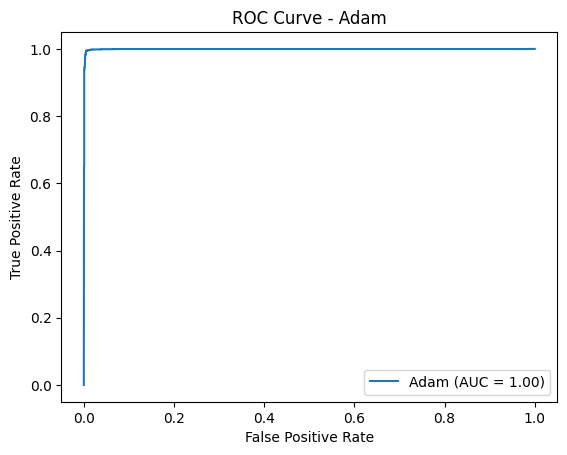

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

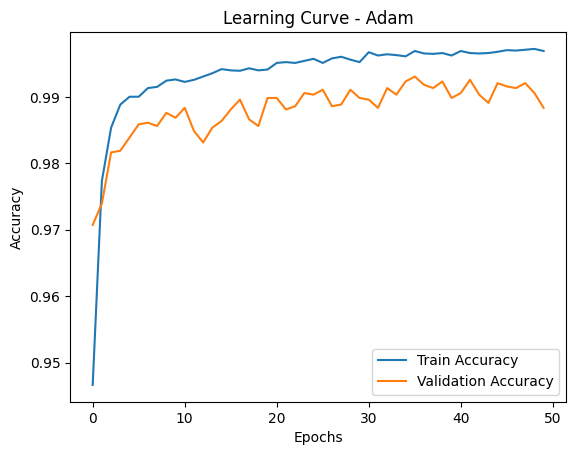

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[-0.11970598,  0.0079948 , -0.17339712, ..., -0.02202618,
        -0.04906543, -0.23396154],
       [-0.28499943,  0.1715326 , -0.01033959, ...,  0.12765309,
        -0.2161482 , -0.13978867],
       [ 0.1402759 ,  0.27926114, -0.19545275, ...,  0.14698365,
        -0.10860214,  0.23231378],
       ...,
       [-0.16169092, -0.13918374,  0.13834497, ...,  0.11481503,
        -0.00803381,  0.07711825],
       [ 0.2823023 , -0.05899769, -0.08892454, ...,  0.24734744,
        -0.03332242,  0.00525489],
       [-0.03881457, -0.10481851, -0.15433007, ...,  0.26275638,
         0.03310639,  0.17293477]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[-0.22724728,  0.08139965,  0.07950455,  0.3394526 ,  0.25324735,
        -0.021525  ,  0.00652289, -0.00598738,  0.18719986,  0.20317742,
        -0.07971409,  0.02062532,  0.06

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### RMSprop

In [ ]:
# Training with RMSprop optimizer and logging weights and metrics
optimizer_name="RMSprop"
rmsprop = RMSprop(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, rmsprop, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with RMSprop optimizer...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.1422, Accuracy = 0.9542
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.0619, Accuracy = 0.9779
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.0447, Accuracy = 0.9865
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.0386, Accuracy = 0.9872
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.0353, Accuracy = 0.9886
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.0321, Accuracy = 0.9890
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.0305, Accuracy = 0.9899
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.0283, Accuracy = 0.9906
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.0284, Accuracy = 0.9905
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.0259, Accuracy = 0.9911
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.0254, Accuracy = 0.9917
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.0254, Accuracy = 0.9916
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.0240, Accuracy = 0.9924
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.0235, Accuracy = 0.9931
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.0232, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for RMSprop Optimizer:
--------------------------------------------------
Accuracy: 0.9920619170470332

Precision: 0.994740796393689

Recall: 0.9902767389678384

F1-Score: 0.992503748125937

ROC AUC: 0.9990391381417802


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2351   14]
 [  26 2648]]


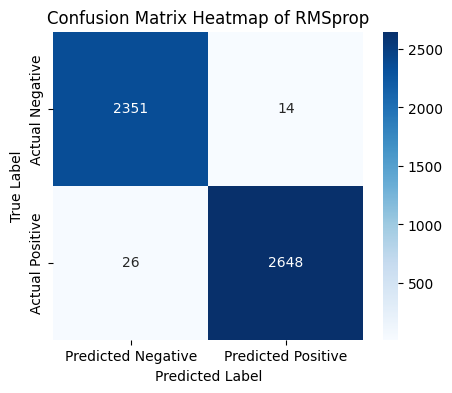

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2365
           1       0.99      0.99      0.99      2674

    accuracy                           0.99      5039
   macro avg       0.99      0.99      0.99      5039
weighted avg       0.99      0.99      0.99      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.99


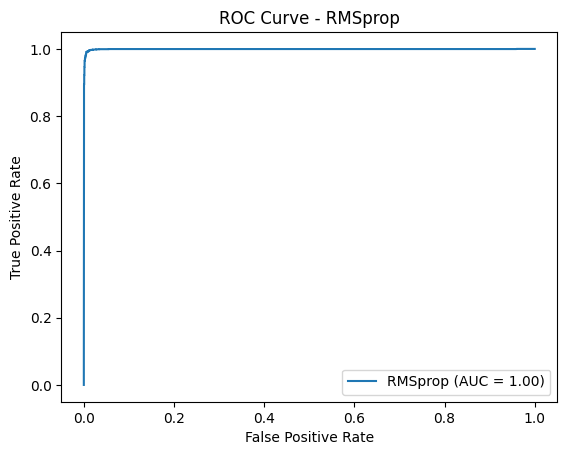

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

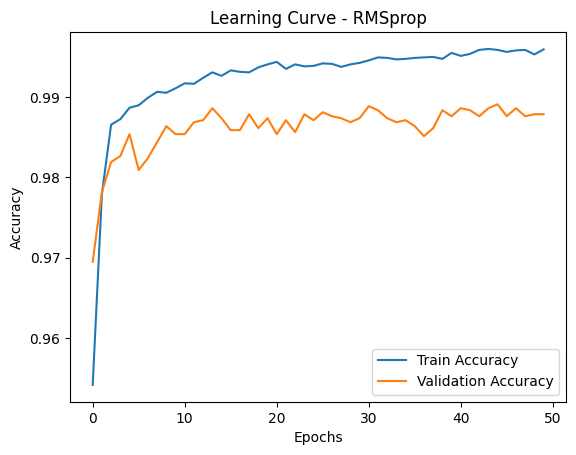

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[ 0.0392307 ,  0.13284048,  0.04013738, ...,  0.19934714,
         0.19719842, -0.1147168 ],
       [-0.22385192,  0.0455671 , -0.20165345, ..., -0.01114571,
         0.03639722,  0.18986303],
       [-0.22756346,  0.08796281,  0.2828928 , ...,  0.272989  ,
         0.28976354, -0.0731439 ],
       ...,
       [-0.26032546, -0.2319789 , -0.15848874, ...,  0.01608422,
         0.15023297, -0.26113096],
       [ 0.08890957,  0.07308549, -0.16204405, ..., -0.0116179 ,
         0.06067184, -0.07759836],
       [-0.04826748, -0.16318473, -0.18874861, ..., -0.23332474,
         0.16932559, -0.14978407]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[-0.05208871,  0.03713104, -0.02247322,  0.28128168,  0.06166834,
        -0.10621814,  0.12729925,  0.32096174,  0.12442726,  0.3534231 ,
        -0.2993108 , -0.00573474,  0.29

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### Adagrad

In [ ]:
# Training with Adagrad optimizer and logging weights and metrics
optimizer_name="Adagrad"
adagrad = Adagrad(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, adagrad, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with Adagrad optimizer...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.4776, Accuracy = 0.8471
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.3521, Accuracy = 0.8913
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.2916, Accuracy = 0.9104
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.2544, Accuracy = 0.9194
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.2300, Accuracy = 0.9235
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.2127, Accuracy = 0.9269
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.1997, Accuracy = 0.9305
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.1896, Accuracy = 0.9355
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.1813, Accuracy = 0.9403
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.1741, Accuracy = 0.9442
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.1679, Accuracy = 0.9487
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.1626, Accuracy = 0.9516
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.1579, Accuracy = 0.9530
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.1537, Accuracy = 0.9548
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.1501, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for Adagrad Optimizer:
--------------------------------------------------
Accuracy: 0.9670569557451876

Precision: 0.9553376906318083

Recall: 0.9839192221391174

F1-Score: 0.9694178334561533

ROC AUC: 0.9925128201884564


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2242  123]
 [  43 2631]]


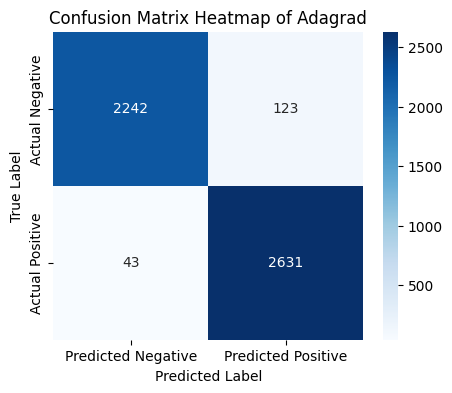

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.95      0.96      2365
           1       0.96      0.98      0.97      2674

    accuracy                           0.97      5039
   macro avg       0.97      0.97      0.97      5039
weighted avg       0.97      0.97      0.97      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.97


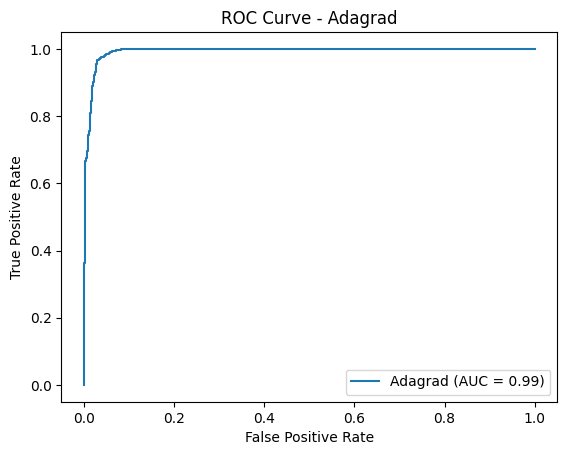

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

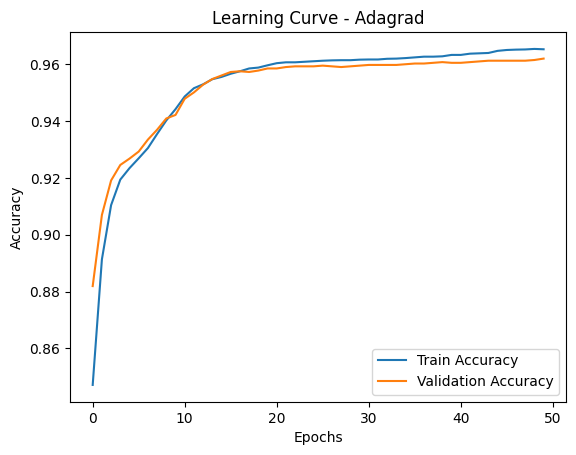

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[-0.24639174,  0.27804103, -0.27893195, ...,  0.12592357,
         0.237048  , -0.11353219],
       [-0.09073794,  0.15578791,  0.22866878, ..., -0.28114095,
         0.15201366, -0.01966122],
       [-0.01468363,  0.04850647, -0.03799742, ..., -0.21626285,
         0.21416548, -0.12209885],
       ...,
       [ 0.11366504, -0.25159362, -0.09914359, ...,  0.01898319,
        -0.17316258,  0.04321733],
       [ 0.12348205,  0.107483  ,  0.24359307, ...,  0.18543303,
         0.13740128,  0.273959  ],
       [-0.1670258 , -0.16822594,  0.00780177, ...,  0.02313048,
        -0.27164173,  0.10190699]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[ 0.28683946, -0.23661214, -0.1916563 ,  0.10727721, -0.14048682,
         0.18479452,  0.33129624,  0.3047463 ,  0.13144085, -0.04909366,
        -0.11355937,  0.28903863, -0.21

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### Adadelta

In [ ]:
# Training with Adadelta optimizer and logging weights and metrics
optimizer_name="Adadelta"
adadelta = Adadelta(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, adadelta, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with Adadelta optimizer...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.8046, Accuracy = 0.4748
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.7887, Accuracy = 0.4747
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.7720, Accuracy = 0.4746
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.7552, Accuracy = 0.4744
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.7384, Accuracy = 0.4743
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.7221, Accuracy = 0.4744
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.7063, Accuracy = 0.4740
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.6909, Accuracy = 0.4743
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.6762, Accuracy = 0.4747
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.6622, Accuracy = 0.4824
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.6490, Accuracy = 0.5107
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.6366, Accuracy = 0.5481
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.6250, Accuracy = 0.5598
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.6139, Accuracy = 0.5698
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.6034, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for Adadelta Optimizer:
--------------------------------------------------
Accuracy: 0.9079182377455844

Precision: 0.9499185667752443

Recall: 0.8724756918474196

F1-Score: 0.909551656920078

ROC AUC: 0.9723333770819466


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2242  123]
 [ 341 2333]]


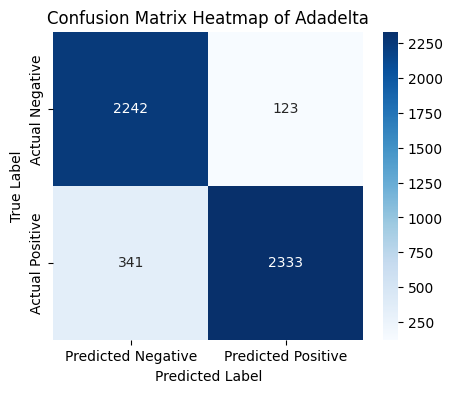

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.87      0.95      0.91      2365
           1       0.95      0.87      0.91      2674

    accuracy                           0.91      5039
   macro avg       0.91      0.91      0.91      5039
weighted avg       0.91      0.91      0.91      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.91


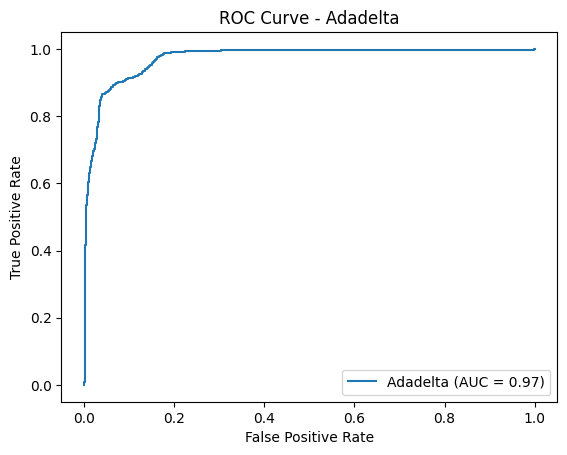

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

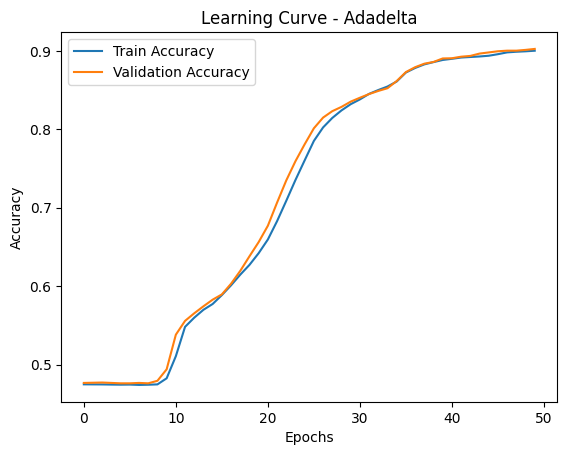

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[-0.01026508, -0.06930158,  0.18616402, ...,  0.10972458,
        -0.2222606 ,  0.13509509],
       [-0.15915714,  0.06910315,  0.10555193, ..., -0.2881914 ,
         0.1679872 , -0.16393548],
       [-0.17670023, -0.10131684, -0.05791987, ...,  0.07452756,
        -0.1539845 , -0.1627598 ],
       ...,
       [ 0.23533788,  0.04808167,  0.12704581, ...,  0.24745992,
         0.21781877,  0.2355198 ],
       [-0.20383604, -0.22612621,  0.1401456 , ...,  0.18060535,
        -0.1347315 ,  0.0876458 ],
       [-0.0814815 ,  0.09032208,  0.0711388 , ...,  0.01740786,
         0.17292923,  0.1913892 ]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[ 1.26338601e-02,  9.15077925e-02, -8.56325328e-02,
         1.13815188e-01,  2.33231992e-01,  1.14120007e-01,
        -4.65757251e-02,  2.96156555e-01,  2.40788460e-02,
        

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### FTRL

In [ ]:
# Training with FTRL optimizer and logging weights and metrics
optimizer_name="FTRL"
ftrl = Ftrl(learning_rate=0.001, l1_regularization_strength=0.01, l2_regularization_strength=0.01)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, ftrl, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with FTRL optimizer...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.6928, Accuracy = 0.5350
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.6926, Accuracy = 0.5347
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.6924, Accuracy = 0.5347
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.6923, Accuracy = 0.5347
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.6922, Accuracy = 0.5347
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.6921, Accuracy = 0.5347
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.6921, Accuracy = 0.5347
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.6920, Accuracy = 0.5347
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.6920, Accuracy = 0.5347
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.6919, Accuracy = 0.5347
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.6919, Accuracy = 0.5347
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.6918, Accuracy = 0.5347
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.6918, Accuracy = 0.5347
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.6918, Accuracy = 0.5347
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.6917, A

/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1565: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, f"{metric.capitalize()} is", len(result))


In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for FTRL Optimizer:
--------------------------------------------------
Accuracy: 0.5306608454058345

Precision: 0.5306608454058345

Recall: 1.0

F1-Score: 0.6933748217295476

ROC AUC: 0.978579176819771


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[   0 2365]
 [   0 2674]]


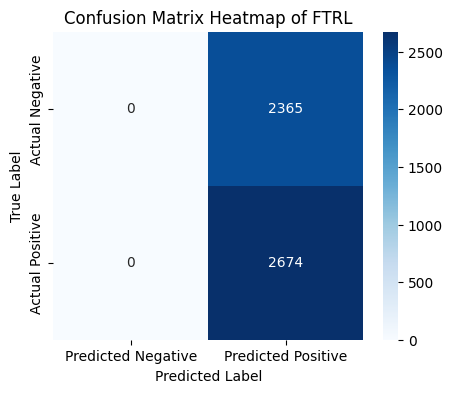

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.00      0.00      0.00      2365
           1       0.53      1.00      0.69      2674

    accuracy                           0.53      5039
   macro avg       0.27      0.50      0.35      5039
weighted avg       0.28      0.53      0.37      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.53


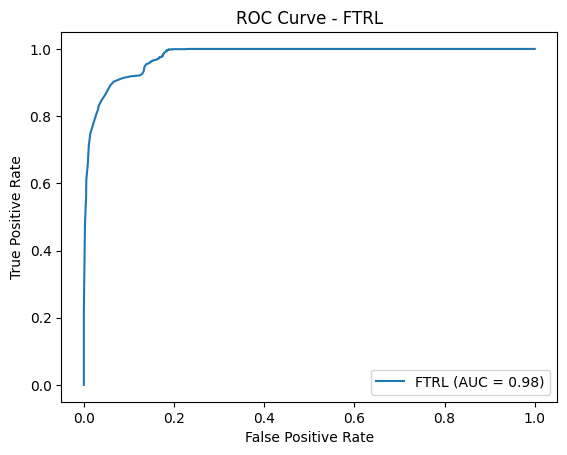

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

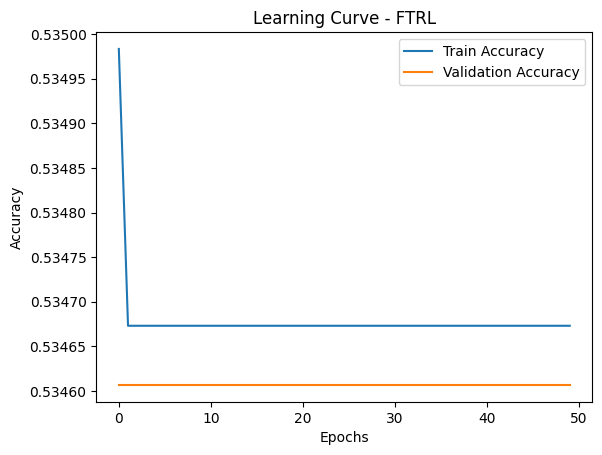

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[ 0.08719689, -0.27035517,  0.02095202, ..., -0.15079792,
         0.00140849,  0.24184296],
       [ 0.19104591,  0.10381812, -0.28086933, ...,  0.09284478,
         0.02507409, -0.00949854],
       [-0.28615993,  0.24979874, -0.17152262, ..., -0.24606578,
        -0.11698264, -0.03755328],
       ...,
       [ 0.12189052, -0.11062005,  0.17897779, ...,  0.02898592,
         0.04932138,  0.21722922],
       [-0.23437662,  0.26732597, -0.18273902, ..., -0.18774885,
         0.23188516, -0.16525179],
       [ 0.25671306,  0.06208509,  0.01476064, ..., -0.12958439,
         0.07191956, -0.14758241]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[ 1.51652366e-01, -3.22710574e-01,  4.49214578e-02,
        -5.19909263e-02,  1.52248889e-01, -4.75762784e-02,
         1.46427155e-01, -3.47089410e-01,  2.12663025e-01,
        

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### Gradient Descent Optimizer (basic SGD without momentum)

In [ ]:
# Training with Gradient Descent Optimizer (basic SGD without momentum) optimizer and logging weights and metrics
optimizer_name="Gradient Descent Optimizer"
gradient_descent = SGD(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, gradient_descent, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with Gradient Descent Optimizer optimizer...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.6894, Accuracy = 0.5796
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.5149, Accuracy = 0.8385
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.4171, Accuracy = 0.8810
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.3451, Accuracy = 0.9137
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.2915, Accuracy = 0.9245
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.2519, Accuracy = 0.9281
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.2219, Accuracy = 0.9323
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.1985, Accuracy = 0.9356
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.1802, Accuracy = 0.9416
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.1663, Accuracy = 0.9460
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.1557, Accuracy = 0.9498
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.1475, Accuracy = 0.9532
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.1410, Accuracy = 0.9550
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.1356, Accuracy = 0.9570
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.1310, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for Gradient Descent Optimizer Optimizer:
--------------------------------------------------
Accuracy: 0.9753919428458028

Precision: 0.9677182685253118

Recall: 0.9865370231862378

F1-Score: 0.977037037037037

ROC AUC: 0.9957988681232318


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2277   88]
 [  36 2638]]


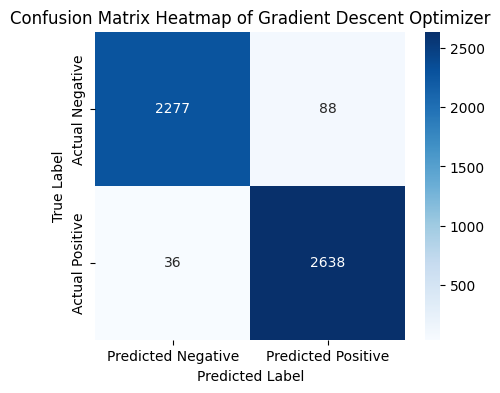

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.96      0.97      2365
           1       0.97      0.99      0.98      2674

    accuracy                           0.98      5039
   macro avg       0.98      0.97      0.98      5039
weighted avg       0.98      0.98      0.98      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.98


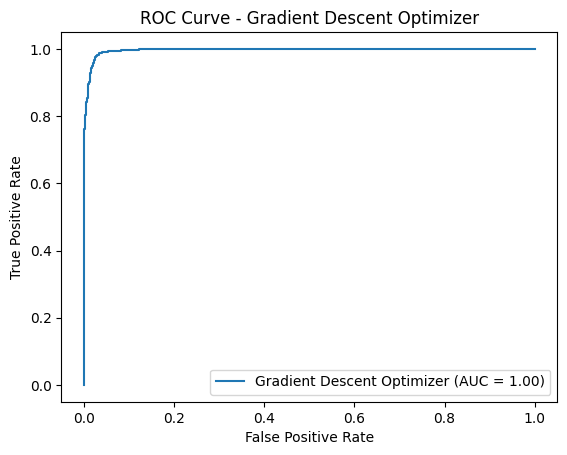

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

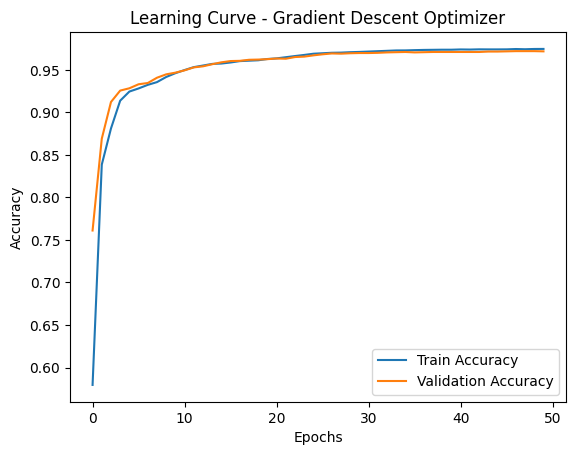

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[-0.01248565,  0.10831165, -0.04185769, ...,  0.07257557,
        -0.01127821,  0.07905146],
       [-0.22819078, -0.016579  ,  0.01943007, ...,  0.12330335,
         0.02144003, -0.13720243],
       [-0.19949213,  0.1713756 ,  0.03092122, ..., -0.26409203,
        -0.02848357,  0.10470685],
       ...,
       [-0.04317462,  0.02444276,  0.18267414, ..., -0.14496969,
         0.11884955, -0.13686593],
       [-0.15772238,  0.2370595 ,  0.15878192, ...,  0.15963164,
        -0.04557513, -0.28469348],
       [ 0.09919289,  0.25918946,  0.08549157, ..., -0.09746738,
        -0.19399853, -0.03004593]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[ 0.15206012,  0.09909692,  0.33583096, -0.2621302 , -0.20591678,
        -0.28751078,  0.17987034, -0.00607833, -0.21799217,  0.28740874,
        -0.34836814,  0.04325286,  0.09

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### Nadam

In [ ]:
# Training with Nadam optimizer and logging weights and metrics
optimizer_name="Nadam"
Nadam_ = Nadam(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, Nadam_, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with Nadam optimizer...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.1727, Accuracy = 0.9427
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.0679, Accuracy = 0.9760
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.0486, Accuracy = 0.9810
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.0396, Accuracy = 0.9871
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.0343, Accuracy = 0.9890
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.0310, Accuracy = 0.9897
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.0289, Accuracy = 0.9904
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.0267, Accuracy = 0.9905
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.0243, Accuracy = 0.9911
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.0232, Accuracy = 0.9917
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.0210, Accuracy = 0.9925
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.0216, Accuracy = 0.9929
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.0203, Accuracy = 0.9930
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.0186, Accuracy = 0.9932
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.0208, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for Nadam Optimizer:
--------------------------------------------------
Accuracy: 0.9898789442349673

Precision: 0.9969685486926866

Recall: 0.9839192221391174

F1-Score: 0.9904009034443817

ROC AUC: 0.9992044604610049


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2357    8]
 [  43 2631]]


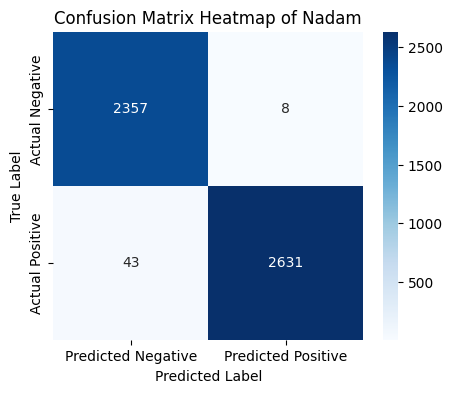

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.98      1.00      0.99      2365
           1       1.00      0.98      0.99      2674

    accuracy                           0.99      5039
   macro avg       0.99      0.99      0.99      5039
weighted avg       0.99      0.99      0.99      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.99


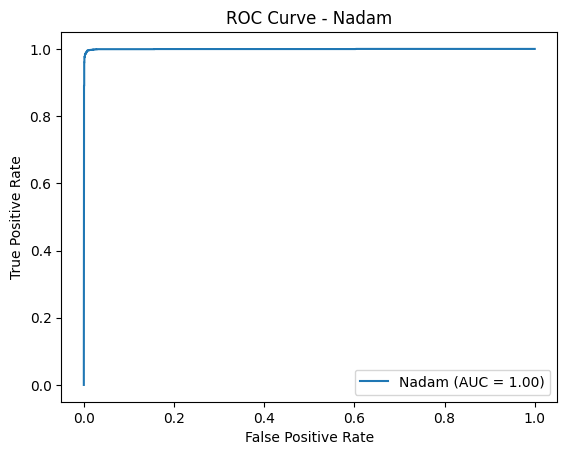

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

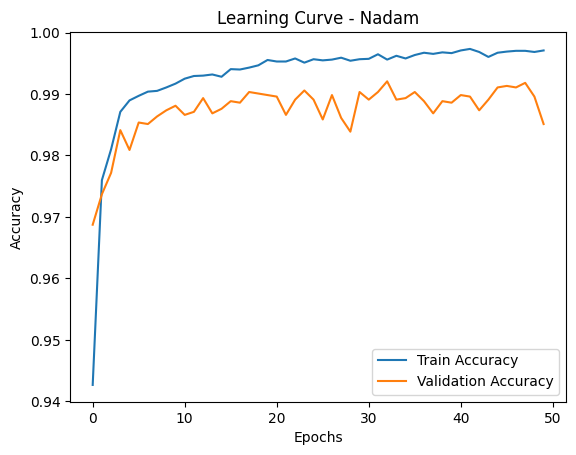

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[-0.17838964,  0.23759416,  0.05700603, ..., -0.17860761,
        -0.19769725,  0.19133002],
       [-0.20475611, -0.08365245,  0.14557171, ...,  0.07219744,
        -0.02620339,  0.14061281],
       [-0.24007407,  0.12063387, -0.12349868, ..., -0.1323579 ,
        -0.1276987 , -0.16922538],
       ...,
       [ 0.2644886 , -0.04104103,  0.02590993, ..., -0.07988761,
         0.08718878,  0.07527035],
       [ 0.1153419 ,  0.01880264, -0.00570872, ..., -0.17093495,
        -0.26736137, -0.28403327],
       [-0.11695443,  0.2607586 ,  0.21169892, ..., -0.19979757,
         0.14069849,  0.2515488 ]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[-0.2543184 ,  0.2881811 , -0.25464037,  0.00547767,  0.3365784 ,
        -0.16302165,  0.12599868, -0.2889876 , -0.22262993,  0.32361355,
         0.14513251,  0.09806171,  0.07

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### Adamax

In [ ]:
# Training with Adamax optimizer and logging weights and metrics
optimizer_name="Adamax"
Adamax_ = Adamax(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, Adamax_, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with Adamax optimizer...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.2624, Accuracy = 0.9054
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.1166, Accuracy = 0.9623
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.0979, Accuracy = 0.9658
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.0871, Accuracy = 0.9704
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.0795, Accuracy = 0.9733
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.0733, Accuracy = 0.9751
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.0678, Accuracy = 0.9769
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.0629, Accuracy = 0.9782
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.0587, Accuracy = 0.9792
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.0550, Accuracy = 0.9800
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.0515, Accuracy = 0.9814
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.0485, Accuracy = 0.9818
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.0458, Accuracy = 0.9837
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.0434, Accuracy = 0.9859
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.0415, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for Adamax Optimizer:
--------------------------------------------------
Accuracy: 0.9902758483826156

Precision: 0.9928651896357491

Recall: 0.9887808526551982

F1-Score: 0.9908188120667042

ROC AUC: 0.9992903237028404


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2346   19]
 [  30 2644]]


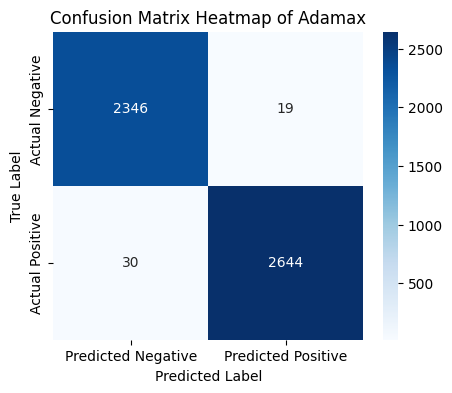

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2365
           1       0.99      0.99      0.99      2674

    accuracy                           0.99      5039
   macro avg       0.99      0.99      0.99      5039
weighted avg       0.99      0.99      0.99      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.99


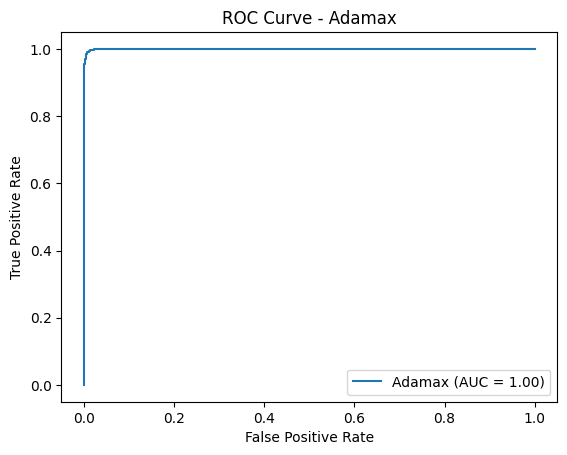

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

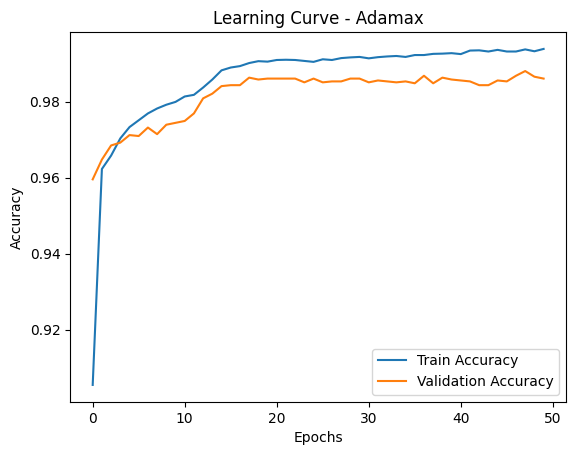

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[ 0.12215272,  0.27987185, -0.10535607, ...,  0.0274691 ,
        -0.00644681,  0.06164172],
       [ 0.06914827,  0.26535198, -0.27912012, ...,  0.23418316,
        -0.15490659,  0.23271379],
       [-0.059415  ,  0.05421138, -0.21499768, ...,  0.07800609,
        -0.00119716, -0.07857041],
       ...,
       [ 0.16891724,  0.11272481,  0.06137025, ...,  0.22094968,
         0.02378342,  0.06781319],
       [ 0.04014486,  0.09500325, -0.17023617, ..., -0.1502596 ,
        -0.19094667,  0.12359023],
       [-0.09623022,  0.01721048,  0.20269987, ...,  0.27816692,
        -0.1323082 , -0.21894002]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[-6.18027151e-02, -3.49161267e-01,  4.59235311e-02,
        -1.87537968e-01,  2.04180628e-01,  4.83441055e-02,
        -2.87400782e-01, -2.58510113e-02, -1.69962734e-01,
        

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### comparation

In [ ]:
# Create a DataFrame
metrices = {
    "Model": models,
    "Accuracy": accuracys,
    "Precision": precisions,
    "Recall": recalls,
    "F1-Score": f1_scores
}
df = pd.DataFrame(metrices)

In [ ]:
df

,Model,Accuracy,Precision,Recall,F1-Score
0,Adam,0.992459,0.995862,0.989903,0.992873
1,RMSprop,0.992062,0.994741,0.990277,0.992504
2,Adagrad,0.967057,0.955338,0.983919,0.969418
3,Adadelta,0.907918,0.949919,0.872476,0.909552
4,FTRL,0.530661,0.530661,1.000000,0.693375
5,Gradient Descent Optimizer,0.975392,0.967718,0.986537,0.977037
6,Nadam,0.989879,0.996969,0.983919,0.990401
7,Adamax,0.990276,0.992865,0.988781,0.990819


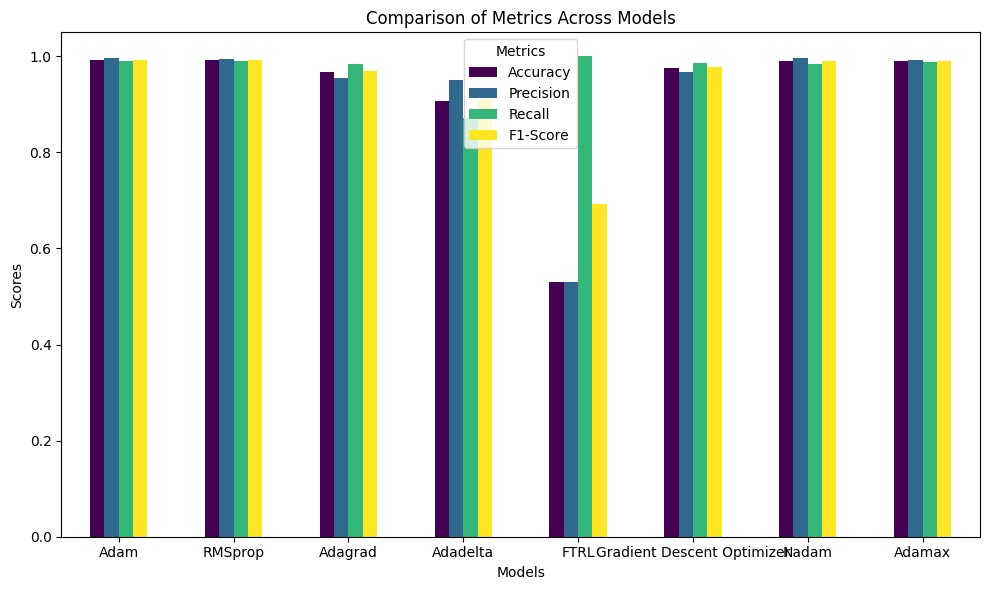

In [ ]:
# Plot Bar Graph
df.set_index("Model").plot(kind="bar", figsize=(10, 6), colormap="viridis")
plt.title("Comparison of Metrics Across Models")
plt.ylabel("Scores")
plt.xlabel("Models")
plt.legend(title="Metrics")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

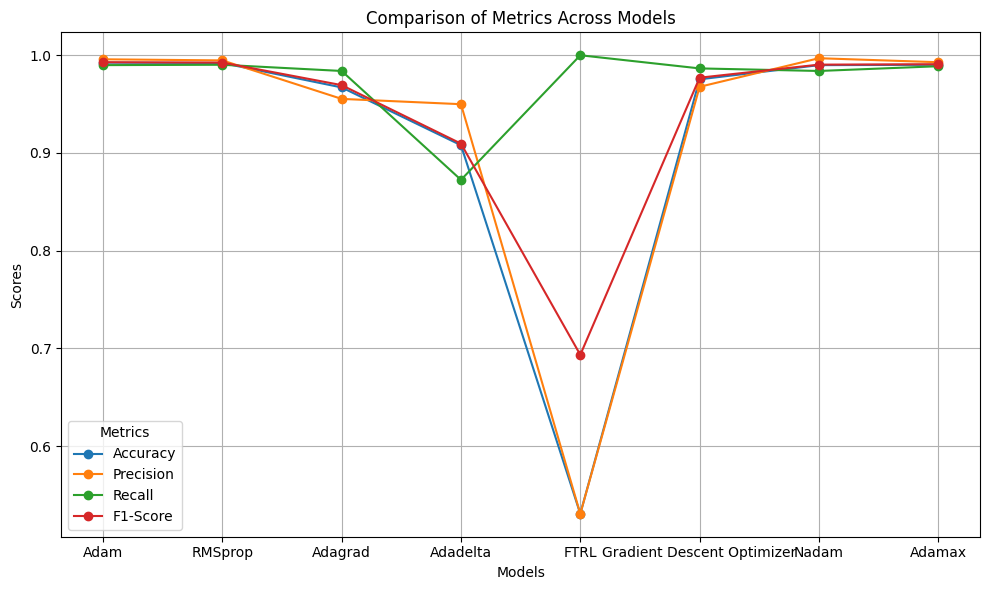

In [ ]:
# Step 3: Plot Line Graph
df.set_index("Model").plot(kind="line", figsize=(10, 6), marker="o")
plt.title("Comparison of Metrics Across Models")
plt.ylabel("Scores")
plt.xlabel("Models")
plt.legend(title="Metrics")
plt.grid(True)
plt.tight_layout()
plt.show()

# ANN (batch_size=16)

### lybs & standardization

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, roc_curve, auc
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam, SGD, RMSprop, Adagrad, Adadelta , SGD, Ftrl, Nadam, Adamax
from tensorflow.keras.callbacks import Callback

In [ ]:
# Scale the features (standardization)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Modules and classes

In [ ]:
# Function to build the ANN model
def build_model(input_dim):
    return Sequential([
        Dense(32, input_dim=input_dim, activation='relu'),
        Dense(16, activation='relu'),
        Dense(1, activation='sigmoid')
    ])

In [ ]:
# Custom callback to log weights after each epoch
class WeightsLogger(Callback):
    def __init__(self):
        self.weights_history = []

    def on_epoch_end(self, epoch, logs=None):
        weights = [layer.get_weights() for layer in self.model.layers]
        self.weights_history.append(weights)
        print(f"Epoch {epoch + 1} - Logged Weights")

In [ ]:
# Custom callback to print accuracy and loss after each epoch
class EpochMetricsLogger(Callback):
    def on_epoch_end(self, epoch, logs=None):
        print(f"Epoch {epoch + 1}: Loss = {logs['loss']:.4f}, Accuracy = {logs['accuracy']:.4f}")

In [ ]:
# Function to train the model with weight and metrics logging
def train_model_with_weights(optimizer_name, optimizer, X_train, y_train):
    print(f"Training with {optimizer_name} optimizer...")
    model = build_model(input_dim=X_train.shape[1])

    # Get initial weights
    initial_weights = [layer.get_weights() for layer in model.layers]
    #print("Initial Weights:", initial_weights)

    # Initialize the callbacks
    weights_logger = WeightsLogger()
    epoch_metrics_logger = EpochMetricsLogger()

    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    history = model.fit(
        X_train, y_train, validation_split=0.2, epochs=50, batch_size=16,
        verbose=0, callbacks=[weights_logger, epoch_metrics_logger]
    )

    return model, history, initial_weights, weights_logger.weights_history

In [ ]:
# Function to calculate metrics
def calculate_metrics(y_test, y_pred, y_pred_probs):
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    report = classification_report(y_test, y_pred)
    fpr, tpr, _ = roc_curve(y_test, y_pred_probs)
    roc_auc = auc(fpr, tpr)

    return accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc

In [ ]:
# Function to plot ROC curve
def plot_roc_curve(optimizer_name, fpr, tpr, roc_auc):
    plt.figure()
    plt.plot(fpr, tpr, label=f'{optimizer_name} (AUC = {roc_auc:.2f})')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {optimizer_name}')
    plt.legend(loc='lower right')
    plt.show()

In [ ]:
# Function to plot learning curve
def plot_learning_curve(history, optimizer_name):
    plt.figure()
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'Learning Curve - {optimizer_name}')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

In [ ]:
def plot_confusion_matrix(cm, optimizer_name):
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
    plt.title(f'Confusion Matrix Heatmap of {optimizer_name}') # Changed to f-string formatting
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

In [ ]:
# Main function to evaluate metrics by combining all the above
def evaluate_metrics(model, X_test, y_test, history, optimizer_name):
    y_pred_probs = model.predict(X_test)
    y_pred = (y_pred_probs > 0.5).astype(int)

    return y_pred, y_pred_probs

## optimizers

### metrices list

In [ ]:
models = []
accuracys = []
precisions = []
recalls = []
f1_scores = []

### ADAM

In [ ]:
# Training with Adam optimizer and logging weights and metrics
optimizer_name="Adam"
adam = Adam(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, adam, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with Adam optimizer...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.1342, Accuracy = 0.9519
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.0564, Accuracy = 0.9792
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.0393, Accuracy = 0.9870
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.0332, Accuracy = 0.9888
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.0303, Accuracy = 0.9903
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.0257, Accuracy = 0.9909
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.0244, Accuracy = 0.9920
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.0236, Accuracy = 0.9921
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.0213, Accuracy = 0.9928
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.0204, Accuracy = 0.9931
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.0197, Accuracy = 0.9936
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.0184, Accuracy = 0.9938
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.0177, Accuracy = 0.9940
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.0165, Accuracy = 0.9940
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.0169, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for Adam Optimizer:
--------------------------------------------------
Accuracy: 0.9916650128993848

Precision: 0.9966037735849057

Recall: 0.987658937920718

F1-Score: 0.9921111945905334

ROC AUC: 0.9993153869143154


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2356    9]
 [  33 2641]]


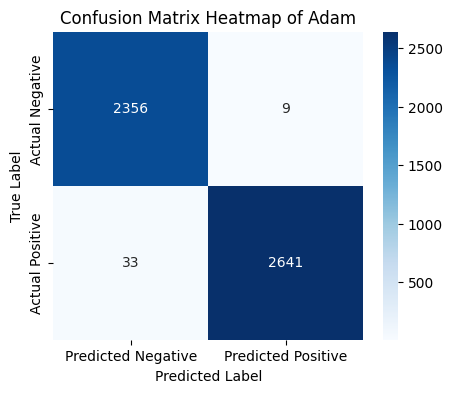

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2365
           1       1.00      0.99      0.99      2674

    accuracy                           0.99      5039
   macro avg       0.99      0.99      0.99      5039
weighted avg       0.99      0.99      0.99      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy}")

Test Accuracy: 0.9916650056838989


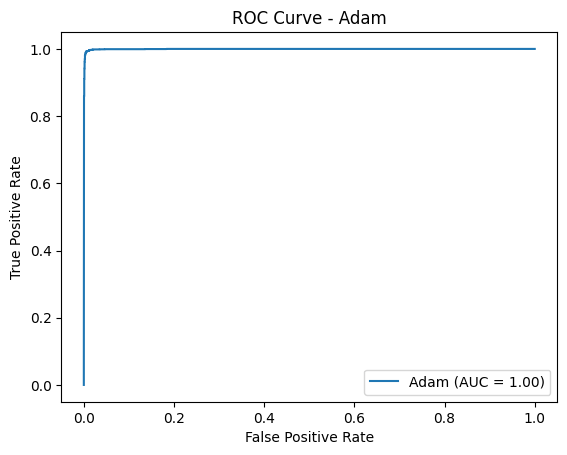

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

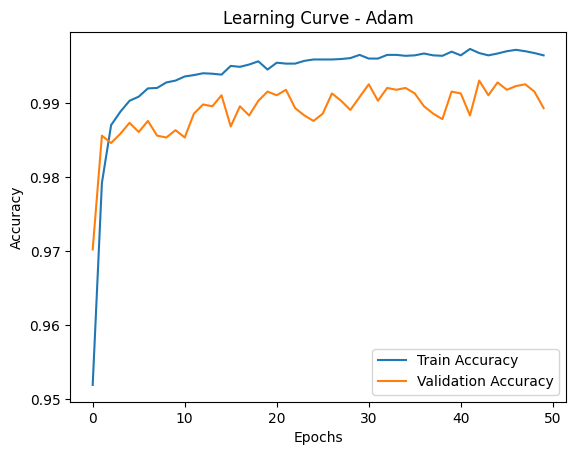

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[ 0.1979213 , -0.23678426, -0.16084412, ...,  0.21969536,
         0.23194692,  0.2410225 ],
       [ 0.17946357, -0.01410809, -0.10124947, ..., -0.07897206,
         0.06931746,  0.21425816],
       [-0.12372053, -0.28833878,  0.27668807, ..., -0.10273385,
        -0.21814644, -0.02358598],
       ...,
       [-0.23876613, -0.23358609,  0.1661146 , ..., -0.05985497,
        -0.0707199 , -0.01746553],
       [-0.25516078,  0.22872958,  0.28883502, ..., -0.28366524,
        -0.25985754,  0.04458269],
       [-0.17712343, -0.03763604, -0.10465577, ...,  0.09395996,
         0.15045267,  0.24623671]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[ 0.15646568,  0.25286332, -0.16243817, -0.19861922,  0.35066208,
        -0.05552569,  0.0322952 ,  0.17789164,  0.31952795, -0.09765121,
         0.30062166, -0.27010608,  0.10

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### RMSprop

In [ ]:
# Training with RMSprop optimizer and logging weights and metrics
optimizer_name="RMSprop"
rmsprop = RMSprop(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, rmsprop, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with RMSprop optimizer...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.1185, Accuracy = 0.9617
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.0582, Accuracy = 0.9809
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.0471, Accuracy = 0.9864
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.0430, Accuracy = 0.9880
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.0398, Accuracy = 0.9888
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.0382, Accuracy = 0.9893
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.0354, Accuracy = 0.9899
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.0347, Accuracy = 0.9905
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.0328, Accuracy = 0.9913
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.0360, Accuracy = 0.9917
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.0338, Accuracy = 0.9917
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.0348, Accuracy = 0.9919
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.0320, Accuracy = 0.9919
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.0319, Accuracy = 0.9927
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.0293, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for RMSprop Optimizer:
--------------------------------------------------
Accuracy: 0.9912681087517364

Precision: 0.995105421686747

Recall: 0.9884068810770381

F1-Score: 0.9917448405253283

ROC AUC: 0.998732370758427


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2352   13]
 [  31 2643]]


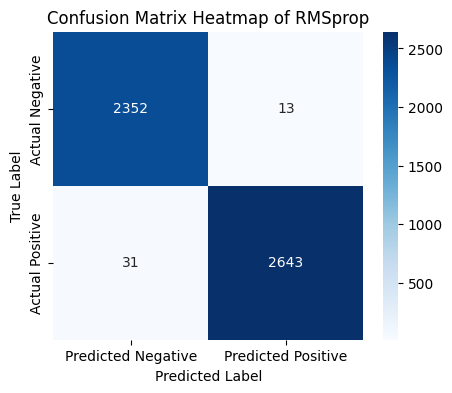

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2365
           1       1.00      0.99      0.99      2674

    accuracy                           0.99      5039
   macro avg       0.99      0.99      0.99      5039
weighted avg       0.99      0.99      0.99      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.99


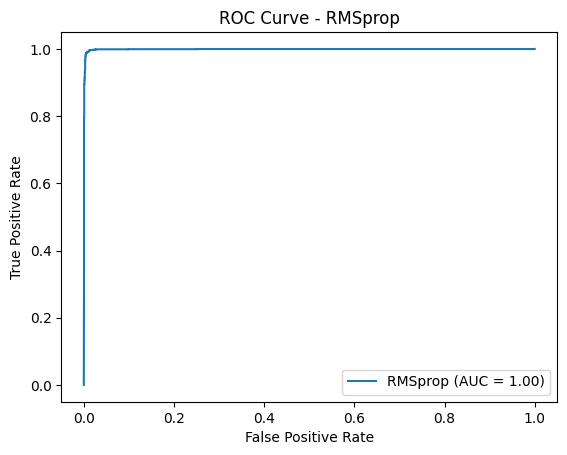

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

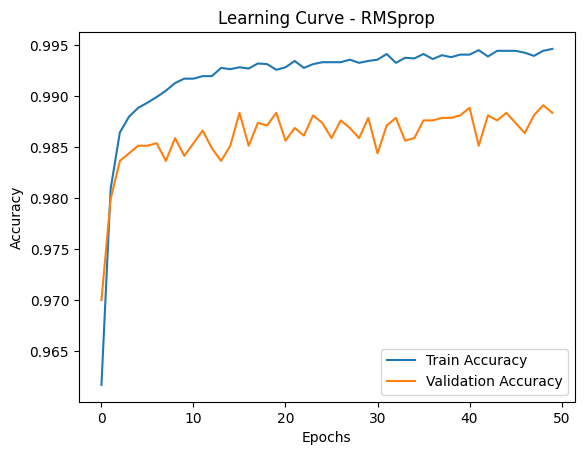

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[ 0.02761632,  0.18590814,  0.1938611 , ...,  0.1052734 ,
         0.0087274 ,  0.26015577],
       [ 0.11352283, -0.2838622 ,  0.04648679, ...,  0.06530267,
        -0.02614081, -0.02841711],
       [-0.2866536 , -0.03100958,  0.10403991, ...,  0.01328158,
        -0.04291098, -0.18382701],
       ...,
       [-0.21781382, -0.00273061,  0.18570098, ...,  0.00567734,
        -0.02206048, -0.24619615],
       [-0.09435223,  0.02044311,  0.2883375 , ..., -0.04838544,
         0.16136345, -0.05421332],
       [ 0.0682869 ,  0.22827843,  0.06310117, ..., -0.10667625,
        -0.00546852, -0.17862736]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[ 0.13968164, -0.23506325, -0.10493739, -0.11262582, -0.1471778 ,
        -0.07854402,  0.00296605,  0.00646305,  0.2496818 , -0.09760308,
         0.13944083,  0.08694801,  0.02

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### Adagrad

In [ ]:
# Training with Adagrad optimizer and logging weights and metrics
optimizer_name="Adagrad"
adagrad = Adagrad(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, adagrad, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with Adagrad optimizer...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.4161, Accuracy = 0.8727
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.2604, Accuracy = 0.9092
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.2133, Accuracy = 0.9322
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.1877, Accuracy = 0.9464
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.1715, Accuracy = 0.9499
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.1599, Accuracy = 0.9532
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.1513, Accuracy = 0.9547
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.1445, Accuracy = 0.9565
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.1390, Accuracy = 0.9579
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.1344, Accuracy = 0.9588
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.1306, Accuracy = 0.9596
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.1273, Accuracy = 0.9604
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.1245, Accuracy = 0.9610
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.1220, Accuracy = 0.9615
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.1197, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for Adagrad Optimizer:
--------------------------------------------------
Accuracy: 0.9706290930740227

Precision: 0.9599417334304443

Recall: 0.9857890800299177

F1-Score: 0.9726937269372694

ROC AUC: 0.9950966238193805


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2255  110]
 [  38 2636]]


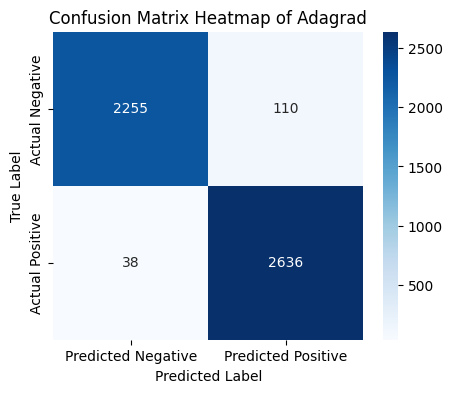

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.95      0.97      2365
           1       0.96      0.99      0.97      2674

    accuracy                           0.97      5039
   macro avg       0.97      0.97      0.97      5039
weighted avg       0.97      0.97      0.97      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.97


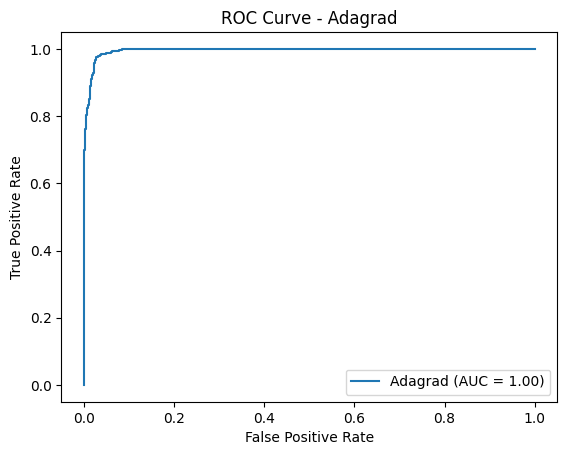

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

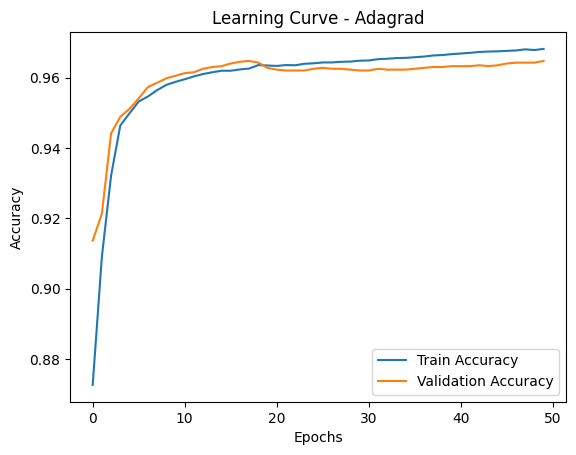

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[ 0.2372289 ,  0.24867335,  0.02698922, ..., -0.18295261,
        -0.269938  , -0.06694952],
       [-0.27822146, -0.15856178, -0.07188664, ...,  0.15646327,
         0.28376898,  0.03469694],
       [-0.23047046,  0.03943411, -0.2537128 , ...,  0.00667948,
        -0.09864943, -0.1706959 ],
       ...,
       [ 0.17134967,  0.27232817, -0.08997034, ...,  0.22897497,
        -0.21751422,  0.04799032],
       [ 0.05642709,  0.09264863,  0.09278101, ..., -0.04265848,
        -0.23991908, -0.00625467],
       [-0.24574669, -0.2722156 , -0.10622568, ...,  0.0952104 ,
         0.08406851, -0.2404339 ]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[-0.3400309 ,  0.30190894, -0.0113934 , -0.26059556,  0.0298844 ,
        -0.11806943,  0.21183595, -0.12821357, -0.1567539 ,  0.33610687,
         0.04851112, -0.18080172, -0.16

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### Adadelta

In [ ]:
# Training with Adadelta optimizer and logging weights and metrics
optimizer_name="Adadelta"
adadelta = Adadelta(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, adadelta, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with Adadelta optimizer...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.7494, Accuracy = 0.4944
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.7287, Accuracy = 0.5306
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.7078, Accuracy = 0.5671
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.6878, Accuracy = 0.5904
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.6688, Accuracy = 0.6135
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.6509, Accuracy = 0.6384
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.6340, Accuracy = 0.6683
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.6181, Accuracy = 0.6966
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.6033, Accuracy = 0.7235
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.5895, Accuracy = 0.7500
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.5767, Accuracy = 0.7675
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.5644, Accuracy = 0.7843
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.5527, Accuracy = 0.8019
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.5417, Accuracy = 0.8232
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.5312, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for Adadelta Optimizer:
--------------------------------------------------
Accuracy: 0.89581266124231

Precision: 0.9124760076775432

Recall: 0.8889304412864623

F1-Score: 0.9005493464671339

ROC AUC: 0.9732000740036781


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2137  228]
 [ 297 2377]]


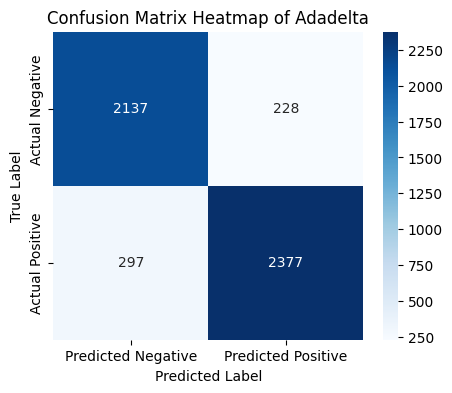

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.88      0.90      0.89      2365
           1       0.91      0.89      0.90      2674

    accuracy                           0.90      5039
   macro avg       0.90      0.90      0.90      5039
weighted avg       0.90      0.90      0.90      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.90


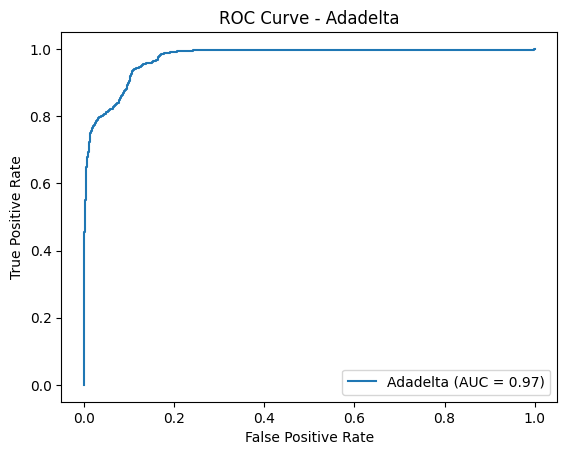

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

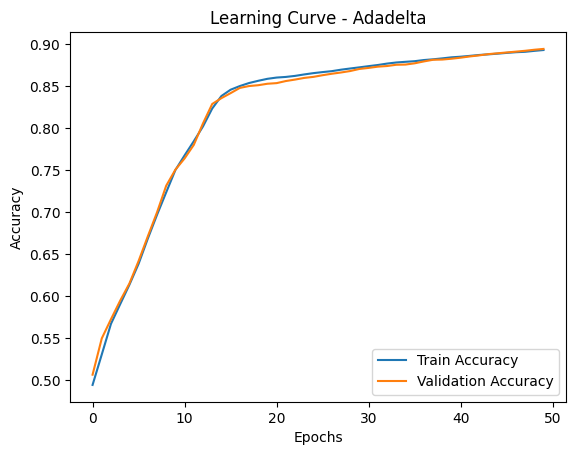

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[ 0.04028627, -0.27606472,  0.1143907 , ...,  0.17087153,
        -0.26082954,  0.22802427],
       [-0.28096947,  0.10502025,  0.28419605, ..., -0.1908283 ,
         0.21524414, -0.24084511],
       [ 0.12491596,  0.16139096, -0.15757787, ...,  0.06766126,
        -0.28004283,  0.06101394],
       ...,
       [ 0.09737158,  0.0103648 ,  0.05619955, ..., -0.28470686,
        -0.06630974,  0.09848198],
       [ 0.04219356, -0.00096774, -0.10755371, ..., -0.23446867,
         0.00420105,  0.23950061],
       [-0.21385369, -0.24227253, -0.18343106, ..., -0.02678087,
         0.0879477 ,  0.15606606]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[-0.30846512,  0.26236436,  0.17403743, -0.01392692, -0.13843824,
        -0.09646949, -0.105745  , -0.03149188, -0.30515617, -0.00378335,
        -0.02028427, -0.15850975, -0.19

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### FTRL

In [ ]:
# Training with FTRL optimizer and logging weights and metrics
optimizer_name="FTRL"
ftrl = Ftrl(learning_rate=0.001, l1_regularization_strength=0.01, l2_regularization_strength=0.01)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, ftrl, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with FTRL optimizer...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.6928, Accuracy = 0.5345
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.6926, Accuracy = 0.5347
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.6924, Accuracy = 0.5347
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.6923, Accuracy = 0.5347
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.6922, Accuracy = 0.5347
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.6921, Accuracy = 0.5347
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.6920, Accuracy = 0.5347
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.6920, Accuracy = 0.5347
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.6919, Accuracy = 0.5347
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.6918, Accuracy = 0.5347
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.6918, Accuracy = 0.5347
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.6917, Accuracy = 0.5347
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.6916, Accuracy = 0.5347
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.6915, Accuracy = 0.5347
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.6914, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for FTRL Optimizer:
--------------------------------------------------
Accuracy: 0.9624925580472316

Precision: 0.9576427255985267

Recall: 0.9723261032161555

F1-Score: 0.9649285581740583

ROC AUC: 0.9804713306904955


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2250  115]
 [  74 2600]]


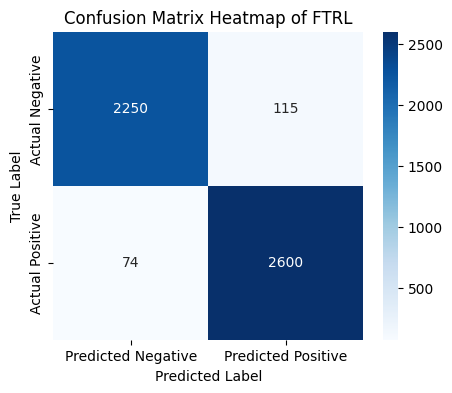

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.97      0.95      0.96      2365
           1       0.96      0.97      0.96      2674

    accuracy                           0.96      5039
   macro avg       0.96      0.96      0.96      5039
weighted avg       0.96      0.96      0.96      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.96


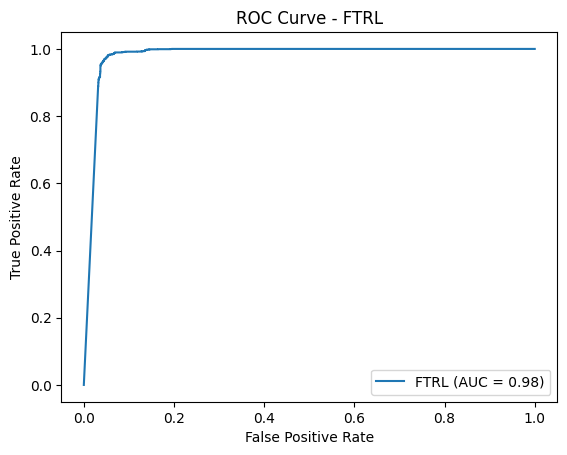

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

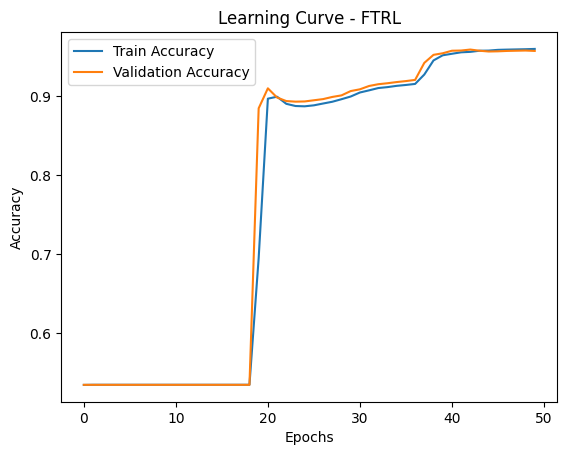

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[ 0.1826559 ,  0.11790866, -0.11364079, ...,  0.11174113,
        -0.2223694 , -0.02226925],
       [ 0.20500651, -0.06616397, -0.2669053 , ...,  0.01847729,
         0.12912723,  0.11342689],
       [ 0.27776006, -0.03826848, -0.2758096 , ...,  0.23606035,
         0.02807051, -0.08481705],
       ...,
       [ 0.137452  , -0.20606536, -0.0628947 , ..., -0.02768523,
         0.2887973 ,  0.10007551],
       [-0.18526551, -0.20277804, -0.2078585 , ...,  0.12105063,
         0.26242915,  0.0767794 ],
       [ 0.21331587, -0.25534555, -0.19208416, ..., -0.02607101,
         0.1682719 , -0.23210976]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[ 0.11784157,  0.04894328, -0.15574196,  0.04530314,  0.2857385 ,
        -0.3354418 , -0.30287653,  0.15181926,  0.16691384, -0.16058345,
         0.2087805 ,  0.05723053,  0.14

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### Gradient Descent Optimizer (basic SGD without momentum)

In [ ]:
# Training with Gradient Descent Optimizer (basic SGD without momentum) optimizer and logging weights and metrics
optimizer_name="Gradient Descent Optimizer"
gradient_descent = SGD(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, gradient_descent, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with Gradient Descent Optimizer optimizer...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.4408, Accuracy = 0.8837
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.2848, Accuracy = 0.9113
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.2113, Accuracy = 0.9328
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.1728, Accuracy = 0.9474
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.1515, Accuracy = 0.9508
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.1382, Accuracy = 0.9545
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.1292, Accuracy = 0.9565
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.1224, Accuracy = 0.9592
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.1172, Accuracy = 0.9615
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.1129, Accuracy = 0.9637
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.1092, Accuracy = 0.9651
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.1060, Accuracy = 0.9672
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.1031, Accuracy = 0.9678
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.1005, Accuracy = 0.9694
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.0981, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for Gradient Descent Optimizer Optimizer:
--------------------------------------------------
Accuracy: 0.9783687239531653

Precision: 0.974472807991121

Recall: 0.9850411368735976

F1-Score: 0.9797284731262786

ROC AUC: 0.9979114517529227


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2296   69]
 [  40 2634]]


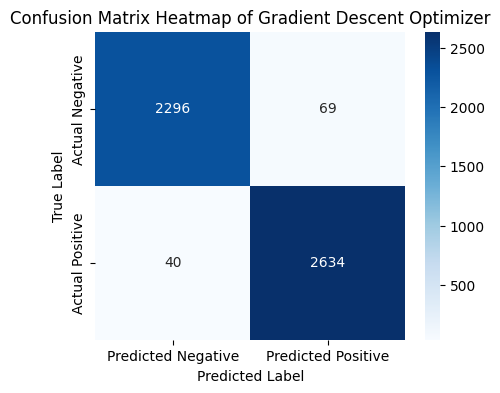

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.97      0.98      2365
           1       0.97      0.99      0.98      2674

    accuracy                           0.98      5039
   macro avg       0.98      0.98      0.98      5039
weighted avg       0.98      0.98      0.98      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.98


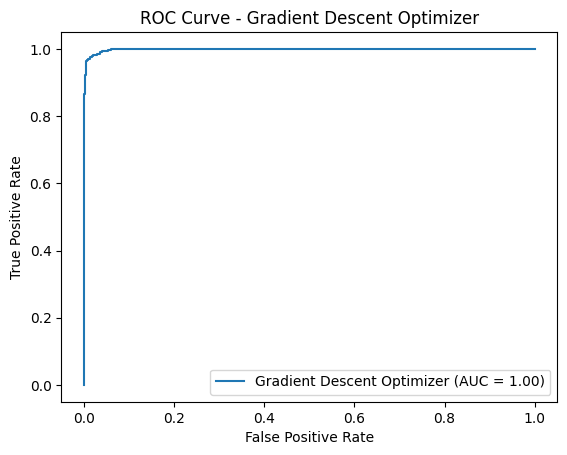

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

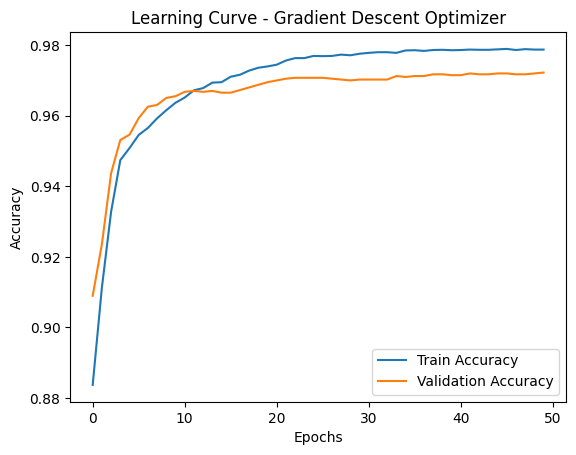

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[ 0.11616009, -0.09058192, -0.12638323, ..., -0.10414074,
         0.14868173,  0.23722866],
       [ 0.19920713, -0.2215592 , -0.07223991, ..., -0.23001912,
         0.2751498 ,  0.20082298],
       [ 0.15070981, -0.18699247, -0.0358474 , ...,  0.22887263,
         0.0758642 ,  0.24524602],
       ...,
       [-0.2583216 ,  0.01391202, -0.0192591 , ..., -0.08565561,
        -0.12783289,  0.17985508],
       [ 0.00226381, -0.06679648, -0.13457833, ..., -0.14696792,
        -0.06721096,  0.2081958 ],
       [ 0.26395264,  0.05116576,  0.16588026, ..., -0.00047454,
         0.08424485,  0.09680909]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[-1.50360733e-01, -2.09846124e-01, -4.86764908e-02,
        -3.24438840e-01, -1.91837609e-01, -3.02362442e-03,
         1.66091174e-01, -3.15510869e-01, -2.42704451e-02,
        

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### Nadam

In [ ]:
# Training with Nadam optimizer and logging weights and metrics
optimizer_name="Nadam"
Nadam_ = Nadam(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, Nadam_, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with Nadam optimizer...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.1269, Accuracy = 0.9537
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.0481, Accuracy = 0.9841
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.0371, Accuracy = 0.9867
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.0336, Accuracy = 0.9888
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.0289, Accuracy = 0.9900
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.0273, Accuracy = 0.9900
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.0252, Accuracy = 0.9909
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.0241, Accuracy = 0.9918
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.0217, Accuracy = 0.9926
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.0205, Accuracy = 0.9925
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.0195, Accuracy = 0.9931
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.0190, Accuracy = 0.9930
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.0188, Accuracy = 0.9937
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.0180, Accuracy = 0.9934
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.0165, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for Nadam Optimizer:
--------------------------------------------------
Accuracy: 0.9916650128993848

Precision: 0.9947368421052631

Recall: 0.9895287958115183

F1-Score: 0.9921259842519685

ROC AUC: 0.9994087612132176


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2351   14]
 [  28 2646]]


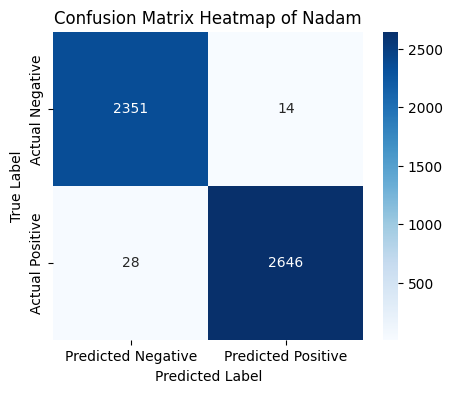

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2365
           1       0.99      0.99      0.99      2674

    accuracy                           0.99      5039
   macro avg       0.99      0.99      0.99      5039
weighted avg       0.99      0.99      0.99      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.99


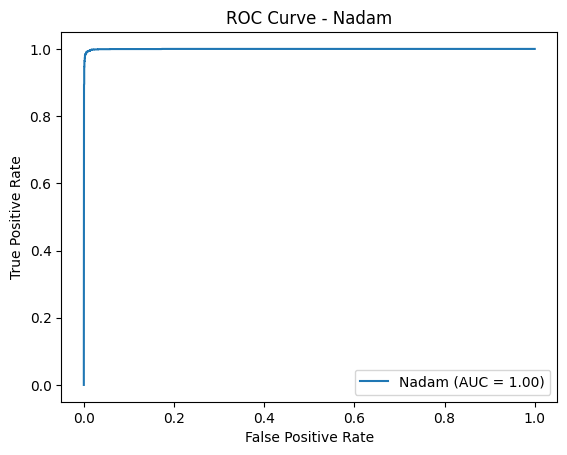

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

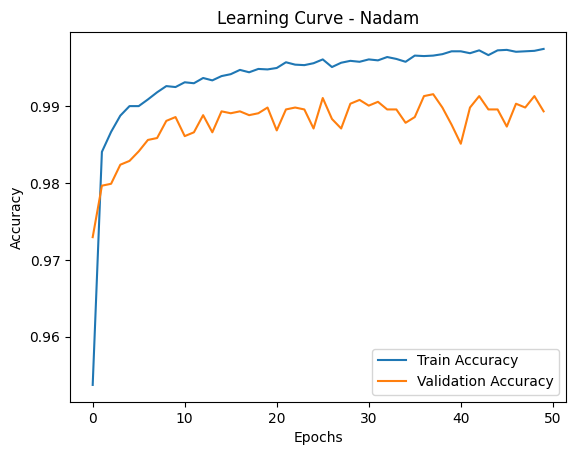

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[-0.01412258,  0.20971099,  0.1877864 , ...,  0.21263734,
         0.04445261, -0.21739396],
       [-0.20606625,  0.26297215,  0.03803831, ..., -0.07530896,
         0.23469332,  0.19015732],
       [ 0.20127586, -0.27817363,  0.19072205, ...,  0.23346964,
        -0.14840406, -0.05452673],
       ...,
       [-0.04973952, -0.16718313, -0.11266278, ..., -0.20957665,
        -0.12994105, -0.16333   ],
       [-0.18483311,  0.27219507, -0.13941766, ..., -0.0113343 ,
         0.01053447, -0.26645017],
       [-0.05320004,  0.19560155, -0.13588154, ..., -0.24682547,
        -0.05197951, -0.00447607]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[-0.3127742 ,  0.07765439, -0.07269901,  0.17943129,  0.09456369,
        -0.15509407,  0.3339937 , -0.14220102, -0.1842801 ,  0.09181884,
         0.0425823 ,  0.20175377,  0.19

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### Adamax

In [ ]:
# Training with Adamax optimizer and logging weights and metrics
optimizer_name="Adamax"
Adamax_ = Adamax(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, Adamax_, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with Adamax optimizer...


/usr/local/lib/python3.10/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.1840, Accuracy = 0.9454
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.1059, Accuracy = 0.9674
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.0876, Accuracy = 0.9718
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.0758, Accuracy = 0.9748
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.0669, Accuracy = 0.9780
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.0596, Accuracy = 0.9788
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.0543, Accuracy = 0.9797
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.0499, Accuracy = 0.9813
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.0461, Accuracy = 0.9837
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.0431, Accuracy = 0.9851
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.0407, Accuracy = 0.9865
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.0385, Accuracy = 0.9877
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.0369, Accuracy = 0.9880
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.0354, Accuracy = 0.9885
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.0341, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for Adamax Optimizer:
--------------------------------------------------
Accuracy: 0.9902758483826156

Precision: 0.9924953095684803

Recall: 0.9891548242333582

F1-Score: 0.9908222513579322

ROC AUC: 0.999002373494033


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2345   20]
 [  29 2645]]


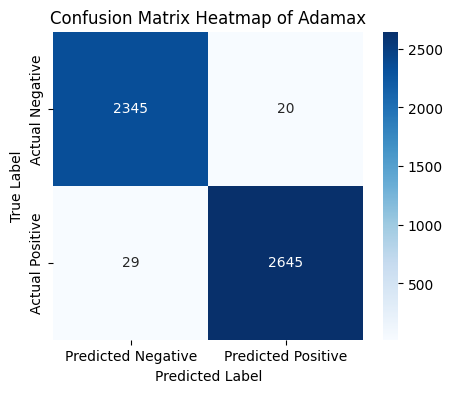

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2365
           1       0.99      0.99      0.99      2674

    accuracy                           0.99      5039
   macro avg       0.99      0.99      0.99      5039
weighted avg       0.99      0.99      0.99      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.99


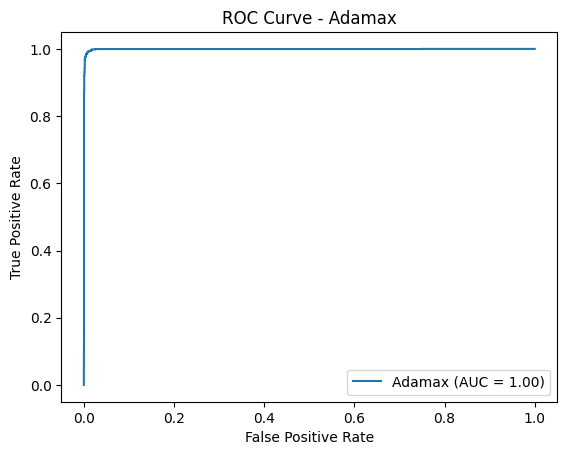

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

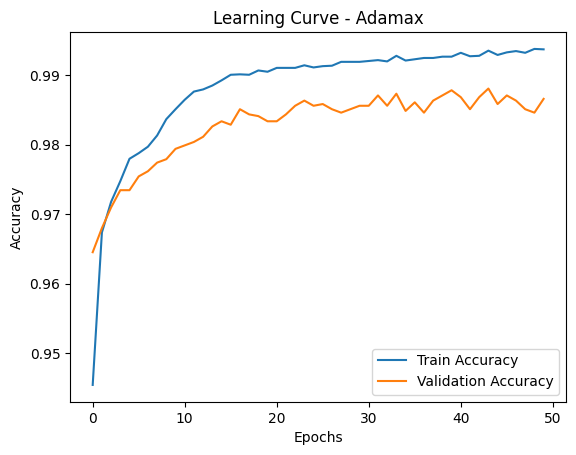

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[-0.00272438,  0.02271363,  0.1927484 , ...,  0.07568052,
         0.23307177,  0.19981366],
       [-0.21303853,  0.13293296, -0.01502824, ...,  0.20807752,
         0.11052233,  0.17314312],
       [-0.02959132,  0.00328606,  0.05717847, ..., -0.13386334,
        -0.05795757,  0.10571912],
       ...,
       [-0.26969984,  0.00616145,  0.01785955, ...,  0.2841266 ,
        -0.05467859,  0.16146559],
       [-0.212552  ,  0.17903134, -0.1532059 , ..., -0.27352402,
        -0.07427384,  0.1358496 ],
       [ 0.19097674,  0.01671186, -0.20790091, ..., -0.17394397,
        -0.05590236,  0.12500143]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[-0.07159764,  0.09760165, -0.1197    , -0.04518074,  0.01736325,
         0.06406447, -0.2577649 , -0.06560478,  0.0961979 ,  0.24149826,
         0.326879  , -0.2780453 ,  0.31

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### comparation

In [ ]:
# Create a DataFrame
metrices = {
    "Model": models,
    "Accuracy": accuracys,
    "Precision": precisions,
    "Recall": recalls,
    "F1-Score": f1_scores
}
df = pd.DataFrame(metrices)

In [ ]:
df

,Model,Accuracy,Precision,Recall,F1-Score
0,Adam,0.991665,0.996604,0.987659,0.992111
1,RMSprop,0.991268,0.995105,0.988407,0.991745
2,Adagrad,0.970629,0.959942,0.985789,0.972694
3,Adadelta,0.895813,0.912476,0.888930,0.900549
4,FTRL,0.962493,0.957643,0.972326,0.964929
5,Gradient Descent Optimizer,0.978369,0.974473,0.985041,0.979728
6,Nadam,0.991665,0.994737,0.989529,0.992126
7,Adamax,0.990276,0.992495,0.989155,0.990822


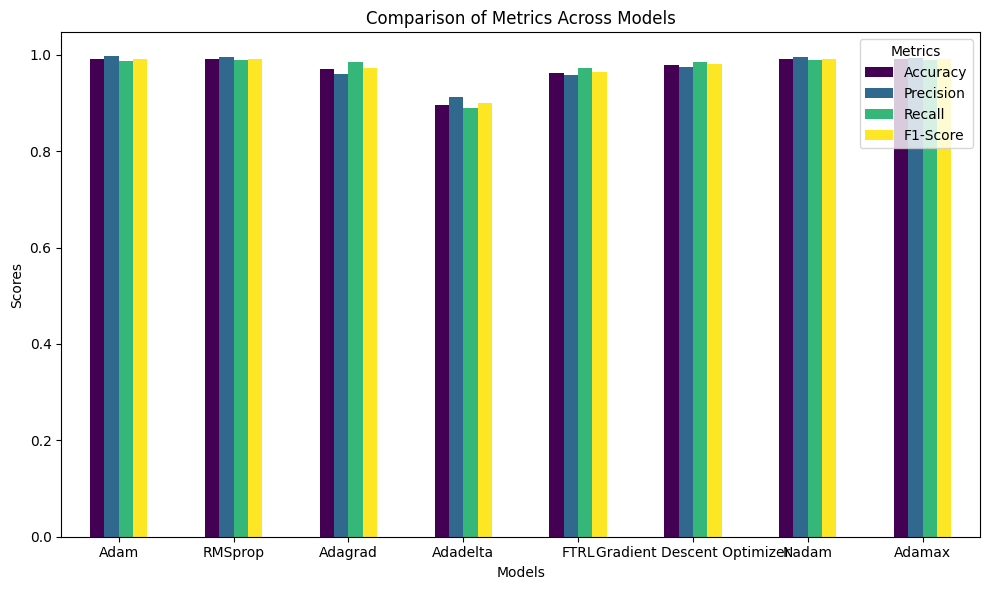

In [ ]:
# Plot Bar Graph
df.set_index("Model").plot(kind="bar", figsize=(10, 6), colormap="viridis")
plt.title("Comparison of Metrics Across Models")
plt.ylabel("Scores")
plt.xlabel("Models")
plt.legend(title="Metrics")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

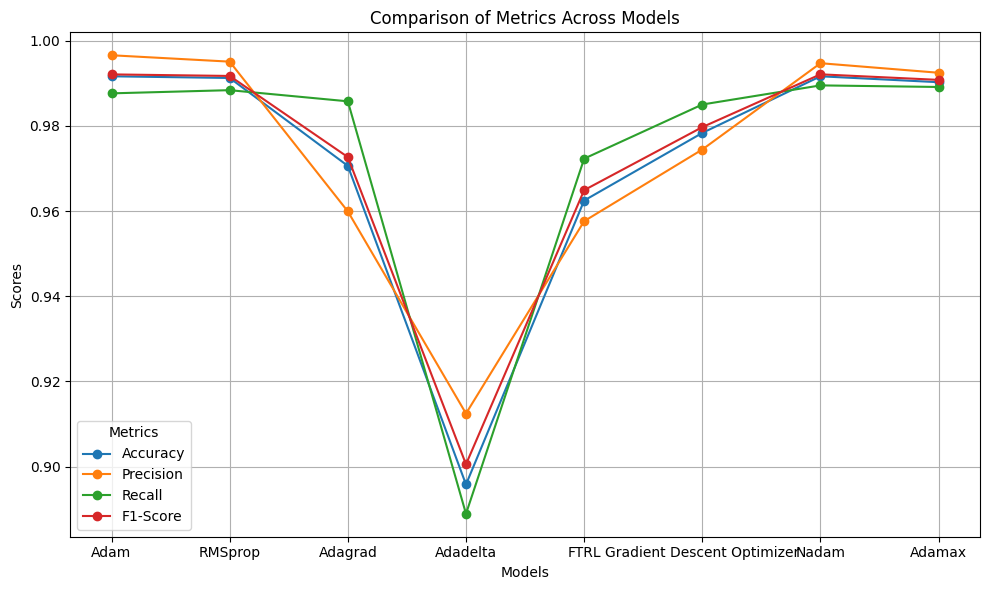

In [ ]:
# Step 3: Plot Line Graph
df.set_index("Model").plot(kind="line", figsize=(10, 6), marker="o")
plt.title("Comparison of Metrics Across Models")
plt.ylabel("Scores")
plt.xlabel("Models")
plt.legend(title="Metrics")
plt.grid(True)
plt.tight_layout()
plt.show()

# ANN (batch_size=8)

### lybs & standardization

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report, roc_curve, auc
from sklearn.preprocessing import StandardScaler
import matplotlib.pyplot as plt
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.optimizers import Adam, SGD, RMSprop, Adagrad, Adadelta , SGD, Ftrl, Nadam, Adamax
from tensorflow.keras.callbacks import Callback

In [ ]:
# Scale the features (standardization)
scaler = StandardScaler()
X_train = scaler.fit_transform(X_train)
X_test = scaler.transform(X_test)

## Modules and classes

In [ ]:
# Function to build the ANN model
def build_model(input_dim):
    return Sequential([
        Dense(32, input_dim=input_dim, activation='relu'),
        Dense(16, activation='relu'),
        Dense(1, activation='sigmoid')
    ])

In [ ]:
# Custom callback to log weights after each epoch
class WeightsLogger(Callback):
    def __init__(self):
        self.weights_history = []

    def on_epoch_end(self, epoch, logs=None):
        weights = [layer.get_weights() for layer in self.model.layers]
        self.weights_history.append(weights)
        print(f"Epoch {epoch + 1} - Logged Weights")

In [ ]:
# Custom callback to print accuracy and loss after each epoch
class EpochMetricsLogger(Callback):
    def on_epoch_end(self, epoch, logs=None):
        print(f"Epoch {epoch + 1}: Loss = {logs['loss']:.4f}, Accuracy = {logs['accuracy']:.4f}")

In [ ]:
# Function to train the model with weight and metrics logging
def train_model_with_weights(optimizer_name, optimizer, X_train, y_train):
    print(f"Training with {optimizer_name} optimizer...")
    model = build_model(input_dim=X_train.shape[1])

    # Get initial weights
    initial_weights = [layer.get_weights() for layer in model.layers]
    #print("Initial Weights:", initial_weights)

    # Initialize the callbacks
    weights_logger = WeightsLogger()
    epoch_metrics_logger = EpochMetricsLogger()

    model.compile(optimizer=optimizer, loss='binary_crossentropy', metrics=['accuracy'])
    history = model.fit(
        X_train, y_train, validation_split=0.2, epochs=50, batch_size=8,
        verbose=0, callbacks=[weights_logger, epoch_metrics_logger]
    )

    return model, history, initial_weights, weights_logger.weights_history

In [ ]:
# Function to calculate metrics
def calculate_metrics(y_test, y_pred, y_pred_probs):
    accuracy = accuracy_score(y_test, y_pred)
    precision = precision_score(y_test, y_pred)
    recall = recall_score(y_test, y_pred)
    f1 = f1_score(y_test, y_pred)
    cm = confusion_matrix(y_test, y_pred)
    report = classification_report(y_test, y_pred)
    fpr, tpr, _ = roc_curve(y_test, y_pred_probs)
    roc_auc = auc(fpr, tpr)

    return accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc

In [ ]:
# Function to plot ROC curve
def plot_roc_curve(optimizer_name, fpr, tpr, roc_auc):
    plt.figure()
    plt.plot(fpr, tpr, label=f'{optimizer_name} (AUC = {roc_auc:.2f})')
    plt.xlabel('False Positive Rate')
    plt.ylabel('True Positive Rate')
    plt.title(f'ROC Curve - {optimizer_name}')
    plt.legend(loc='lower right')
    plt.show()

In [ ]:
# Function to plot learning curve
def plot_learning_curve(history, optimizer_name):
    plt.figure()
    plt.plot(history.history['accuracy'], label='Train Accuracy')
    plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
    plt.title(f'Learning Curve - {optimizer_name}')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

In [ ]:
def plot_confusion_matrix(cm, optimizer_name):
    plt.figure(figsize=(5, 4))
    sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=['Predicted Negative', 'Predicted Positive'],
            yticklabels=['Actual Negative', 'Actual Positive'])
    plt.title(f'Confusion Matrix Heatmap of {optimizer_name}') # Changed to f-string formatting
    plt.xlabel('Predicted Label')
    plt.ylabel('True Label')
    plt.show()

In [ ]:
# Main function to evaluate metrics by combining all the above
def evaluate_metrics(model, X_test, y_test, history, optimizer_name):
    y_pred_probs = model.predict(X_test)
    y_pred = (y_pred_probs > 0.5).astype(int)

    return y_pred, y_pred_probs

## optimizers

### metrices list

In [ ]:
models = []
accuracys = []
precisions = []
recalls = []
f1_scores = []

### ADAM

In [ ]:
# Training with Adam optimizer and logging weights and metrics
optimizer_name="Adam"
adam = Adam(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, adam, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with Adam optimizer...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.1070, Accuracy = 0.9666
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.0430, Accuracy = 0.9858
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.0323, Accuracy = 0.9896
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.0285, Accuracy = 0.9900
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.0260, Accuracy = 0.9913
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.0239, Accuracy = 0.9921
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.0217, Accuracy = 0.9927
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.0207, Accuracy = 0.9926
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.0200, Accuracy = 0.9930
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.0192, Accuracy = 0.9931
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.0187, Accuracy = 0.9932
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.0175, Accuracy = 0.9935
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.0163, Accuracy = 0.9941
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.0163, Accuracy = 0.9940
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.0159, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for Adam Optimizer:
--------------------------------------------------
Accuracy: 0.9920619170470332

Precision: 0.9962321024868124

Recall: 0.9887808526551982

F1-Score: 0.9924924924924925

ROC AUC: 0.9991492739575047


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2355   10]
 [  30 2644]]


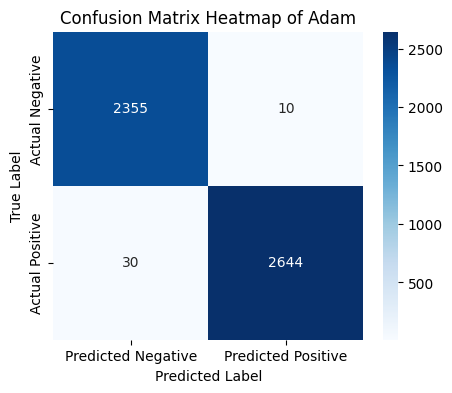

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.99      1.00      0.99      2365
           1       1.00      0.99      0.99      2674

    accuracy                           0.99      5039
   macro avg       0.99      0.99      0.99      5039
weighted avg       0.99      0.99      0.99      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy}")

Test Accuracy: 0.9920619130134583


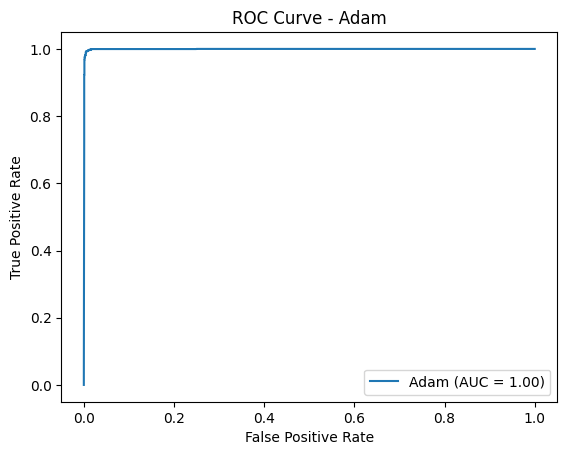

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

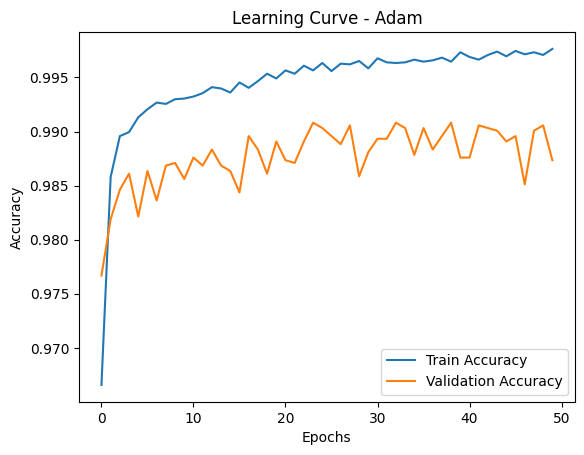

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[-0.2800638 ,  0.1521827 ,  0.09715104, ...,  0.10173109,
         0.25525752,  0.11599866],
       [-0.11061887,  0.23073801,  0.04648036, ...,  0.14267552,
        -0.02341062, -0.00579587],
       [-0.19710556, -0.27766976, -0.0120382 , ..., -0.19504294,
         0.23908058,  0.22579262],
       ...,
       [-0.27067494, -0.10288237, -0.09107769, ...,  0.18924257,
        -0.01944935, -0.09254965],
       [ 0.10390863, -0.08734626,  0.09693813, ...,  0.15382329,
         0.10092068, -0.00685862],
       [ 0.24809685,  0.06542072, -0.17320314, ...,  0.14112619,
         0.03710127,  0.21757099]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[ 2.55508631e-01,  3.03422898e-01, -1.95190057e-01,
        -1.59794718e-01,  4.09589708e-02,  1.74347252e-01,
         1.34125084e-01,  8.07605386e-02, -2.18171805e-01,
        

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### RMSprop

In [ ]:
# Training with RMSprop optimizer and logging weights and metrics
optimizer_name="RMSprop"
rmsprop = RMSprop(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, rmsprop, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with RMSprop optimizer...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.1014, Accuracy = 0.9663
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.0560, Accuracy = 0.9854
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.0508, Accuracy = 0.9872
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.0515, Accuracy = 0.9891
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.0494, Accuracy = 0.9890
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.0545, Accuracy = 0.9901
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.0539, Accuracy = 0.9896
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.0525, Accuracy = 0.9902
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.0504, Accuracy = 0.9911
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.0521, Accuracy = 0.9912
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.0533, Accuracy = 0.9906
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.0512, Accuracy = 0.9908
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.0492, Accuracy = 0.9919
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.0484, Accuracy = 0.9919
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.0472, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for RMSprop Optimizer:
--------------------------------------------------
Accuracy: 0.9922603691208574

Precision: 0.9921553978333956

Recall: 0.9932685115931189

F1-Score: 0.9927116426836106

ROC AUC: 0.9988517570339074


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2344   21]
 [  18 2656]]


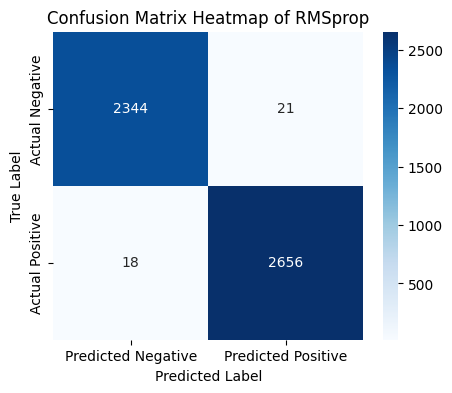

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2365
           1       0.99      0.99      0.99      2674

    accuracy                           0.99      5039
   macro avg       0.99      0.99      0.99      5039
weighted avg       0.99      0.99      0.99      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.99


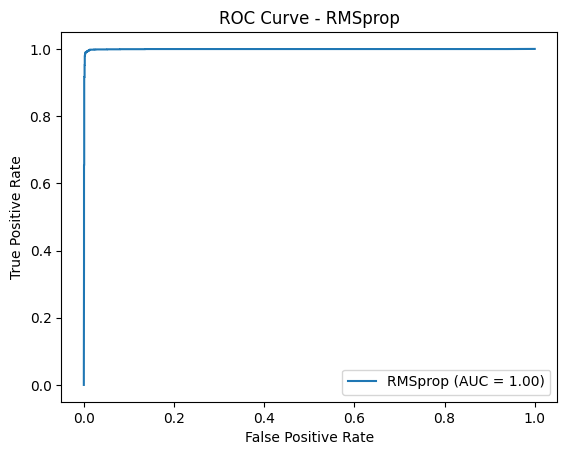

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

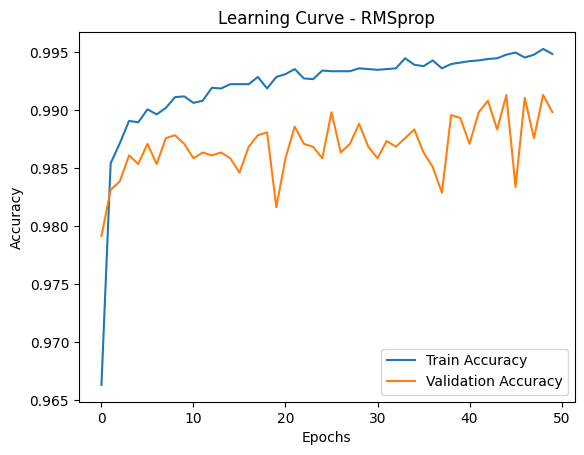

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[ 0.07859558,  0.0265857 ,  0.25407723, ...,  0.18238118,
         0.2885736 , -0.02596   ],
       [-0.03183916,  0.13316521,  0.22128078, ...,  0.2057448 ,
        -0.22893888, -0.10869654],
       [-0.12179092,  0.16931868,  0.2041825 , ...,  0.06810877,
        -0.21197486,  0.14831862],
       ...,
       [-0.11498336, -0.09381571, -0.08048221, ...,  0.20107174,
        -0.26218647, -0.18039161],
       [-0.13234113,  0.06812561, -0.18163188, ...,  0.09192559,
        -0.00609201,  0.18518949],
       [-0.03655642,  0.0256049 ,  0.10552129, ..., -0.09503888,
        -0.05736312,  0.10811219]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[-0.04873329, -0.00087598, -0.31375715,  0.09690985,  0.14263579,
         0.12422818,  0.33795318,  0.32607433,  0.27932146,  0.24028566,
        -0.01021287,  0.22161135,  0.24

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### Adagrad

In [ ]:
# Training with Adagrad optimizer and logging weights and metrics
optimizer_name="Adagrad"
adagrad = Adagrad(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, adagrad, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with Adagrad optimizer...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.4389, Accuracy = 0.8764
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.2677, Accuracy = 0.9310
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.2083, Accuracy = 0.9387
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.1801, Accuracy = 0.9414
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.1638, Accuracy = 0.9427
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.1530, Accuracy = 0.9465
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.1453, Accuracy = 0.9519
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.1393, Accuracy = 0.9547
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.1345, Accuracy = 0.9567
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.1305, Accuracy = 0.9594
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.1272, Accuracy = 0.9610
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.1242, Accuracy = 0.9616
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.1217, Accuracy = 0.9628
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.1194, Accuracy = 0.9630
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.1173, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for Adagrad Optimizer:
--------------------------------------------------
Accuracy: 0.9728120658860885

Precision: 0.9634636463280964

Recall: 0.9861630516080778

F1-Score: 0.9746812049528738

ROC AUC: 0.994661615019584


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2265  100]
 [  37 2637]]


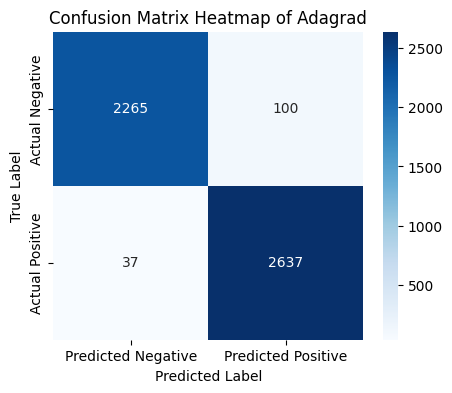

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.96      0.97      2365
           1       0.96      0.99      0.97      2674

    accuracy                           0.97      5039
   macro avg       0.97      0.97      0.97      5039
weighted avg       0.97      0.97      0.97      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.97


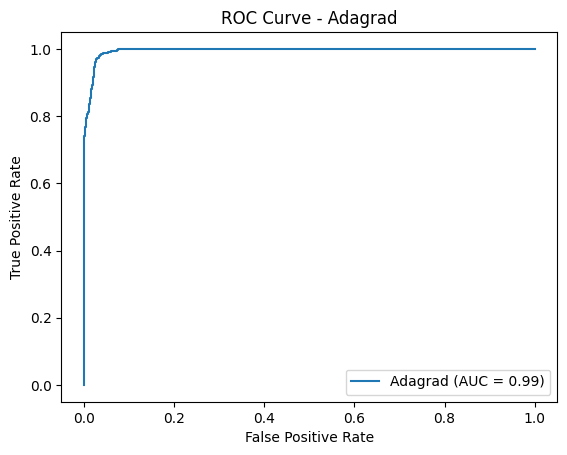

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

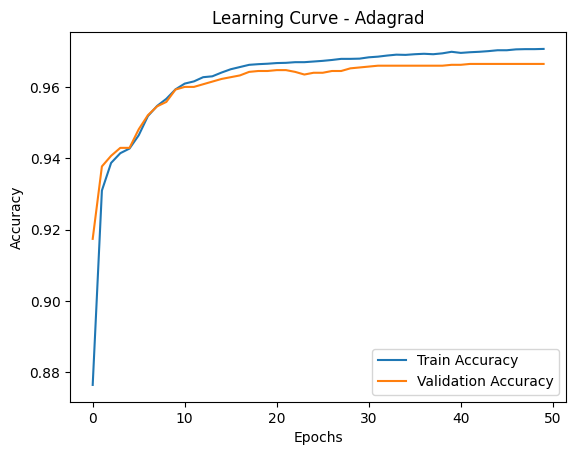

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[-0.0456357 ,  0.2673265 , -0.19533944, ..., -0.06847978,
        -0.02398691,  0.08946237],
       [ 0.25582007, -0.14026545,  0.08220226, ..., -0.10527366,
        -0.199781  , -0.15107916],
       [-0.20959508, -0.00543657,  0.00865394, ..., -0.09036928,
        -0.2469941 , -0.13753788],
       ...,
       [-0.12800796, -0.2495183 ,  0.24003878, ...,  0.04853413,
        -0.25128624,  0.16928601],
       [-0.18974029, -0.18085104,  0.16936249, ..., -0.28683358,
        -0.23906271, -0.04524328],
       [-0.05579425,  0.16924182, -0.20082277, ..., -0.22559017,
         0.0085932 , -0.1059849 ]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[-0.2559862 ,  0.09412932, -0.24814412,  0.33856294, -0.17442313,
         0.07610297, -0.35151425, -0.13070926, -0.11383627, -0.31468698,
        -0.0559448 , -0.23792687,  0.21

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### Adadelta

In [ ]:
# Training with Adadelta optimizer and logging weights and metrics
optimizer_name="Adadelta"
adadelta = Adadelta(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, adadelta, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with Adadelta optimizer...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.7755, Accuracy = 0.3790
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.7247, Accuracy = 0.5079
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.6783, Accuracy = 0.6687
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.6360, Accuracy = 0.8128
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.5973, Accuracy = 0.8582
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.5625, Accuracy = 0.8692
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.5307, Accuracy = 0.8789
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.5015, Accuracy = 0.8875
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.4750, Accuracy = 0.8938
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.4510, Accuracy = 0.8980
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.4289, Accuracy = 0.9021
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.4088, Accuracy = 0.9045
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.3904, Accuracy = 0.9089
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.3737, Accuracy = 0.9140
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.3581, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for Adadelta Optimizer:
--------------------------------------------------
Accuracy: 0.9442349672554078

Precision: 0.9537353052711415

Recall: 0.9405385190725505

F1-Score: 0.9470909433251742

ROC AUC: 0.9860207368426046


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2243  122]
 [ 159 2515]]


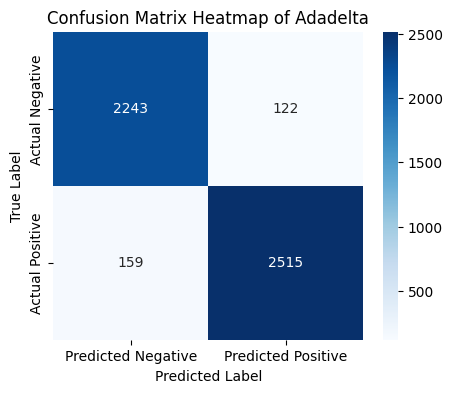

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.93      0.95      0.94      2365
           1       0.95      0.94      0.95      2674

    accuracy                           0.94      5039
   macro avg       0.94      0.94      0.94      5039
weighted avg       0.94      0.94      0.94      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.94


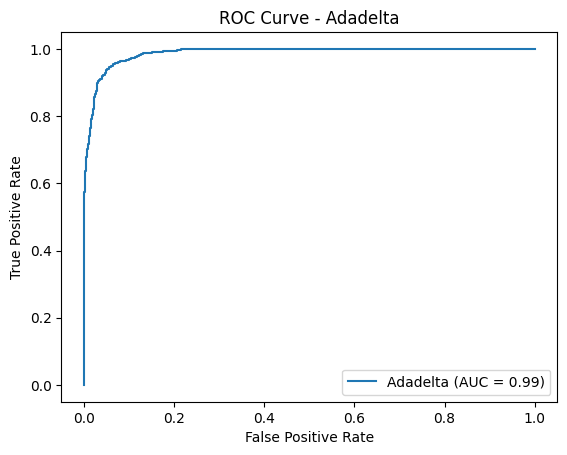

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

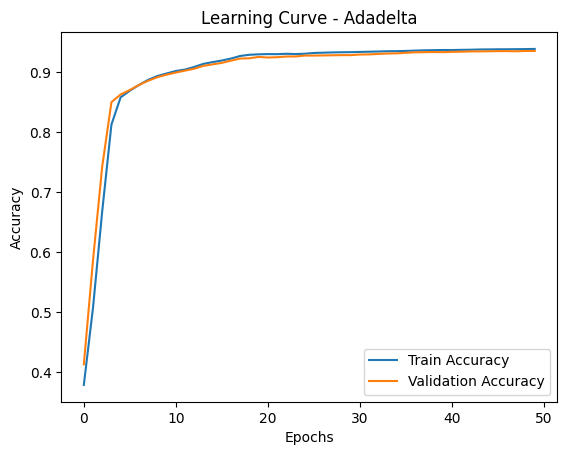

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[ 0.09537828, -0.20487198, -0.04227313, ..., -0.15665165,
         0.12819967,  0.03470567],
       [ 0.06362653, -0.27325386,  0.18040961, ...,  0.279084  ,
        -0.00035757, -0.14223346],
       [-0.01545414,  0.23475209,  0.03576875, ...,  0.25515917,
         0.26749423,  0.12584615],
       ...,
       [ 0.12415648, -0.08447744,  0.2572768 , ...,  0.01064143,
         0.05324313, -0.21964656],
       [-0.12261055, -0.01225784,  0.12547728, ...,  0.2578716 ,
         0.23305431, -0.03110373],
       [ 0.04508677,  0.08738798,  0.2235665 , ..., -0.26201022,
        -0.20787916,  0.16181442]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[-0.2727625 , -0.15304187, -0.34684235, -0.18797831, -0.00154975,
         0.08413142, -0.19107796,  0.18669757,  0.25084445,  0.08284932,
         0.07943636, -0.05217046,  0.04

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### FTRL

In [ ]:
# Training with FTRL optimizer and logging weights and metrics
optimizer_name="FTRL"
ftrl = Ftrl(learning_rate=0.001, l1_regularization_strength=0.01, l2_regularization_strength=0.01)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, ftrl, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with FTRL optimizer...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.6881, Accuracy = 0.8408
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.6583, Accuracy = 0.8970
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.5836, Accuracy = 0.8895
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.5057, Accuracy = 0.8888
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.4593, Accuracy = 0.8916
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.4244, Accuracy = 0.8965
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.3677, Accuracy = 0.9009
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.2798, Accuracy = 0.9063
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.2207, Accuracy = 0.9122
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.1929, Accuracy = 0.9183
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.1780, Accuracy = 0.9217
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.1680, Accuracy = 0.9238
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.1601, Accuracy = 0.9250
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.1537, Accuracy = 0.9468
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.1485, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for FTRL Optimizer:
--------------------------------------------------
Accuracy: 0.966461599523715

Precision: 0.9572836801752465

Recall: 0.9805534779356769

F1-Score: 0.9687788656937003

ROC AUC: 0.9926412197324165


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2248  117]
 [  52 2622]]


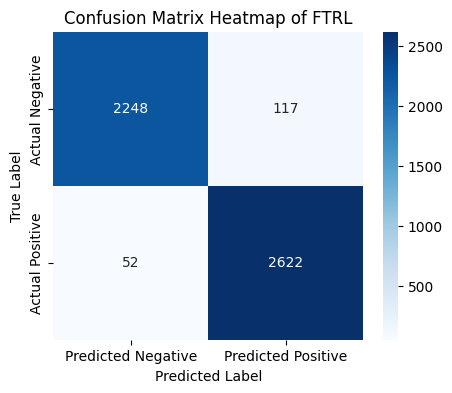

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.95      0.96      2365
           1       0.96      0.98      0.97      2674

    accuracy                           0.97      5039
   macro avg       0.97      0.97      0.97      5039
weighted avg       0.97      0.97      0.97      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.97


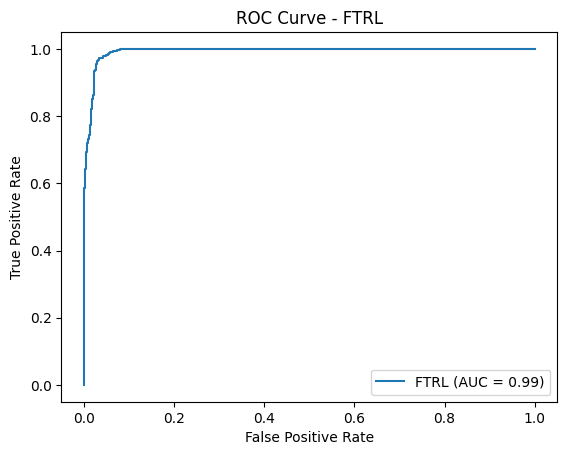

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

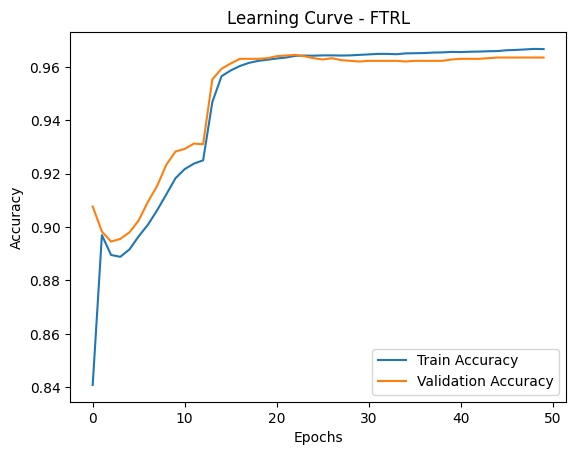

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[-0.18791428, -0.25643128,  0.04112843, ..., -0.10981351,
         0.24520573,  0.01780266],
       [-0.10101119,  0.26312265, -0.20398325, ...,  0.05023834,
         0.10937145,  0.03812024],
       [-0.05103761, -0.19342688,  0.11335504, ..., -0.27350238,
        -0.15355542,  0.05301034],
       ...,
       [-0.17049184,  0.26041707,  0.18393764, ...,  0.17311457,
        -0.17427742, -0.1782025 ],
       [-0.23853548, -0.19951798, -0.03179002, ..., -0.11213201,
        -0.05485047, -0.25223824],
       [-0.16891468,  0.14768949, -0.04739842, ..., -0.00049797,
        -0.19056997, -0.22989638]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[-1.72836721e-01, -8.13713670e-03, -3.29993218e-01,
         1.61800474e-01, -5.19327521e-02, -3.82907391e-02,
        -6.33187294e-02,  9.16180611e-02, -1.21635973e-01,
        

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### Gradient Descent Optimizer (basic SGD without momentum)

In [ ]:
# Training with Gradient Descent Optimizer (basic SGD without momentum) optimizer and logging weights and metrics
optimizer_name="Gradient Descent Optimizer"
gradient_descent = SGD(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, gradient_descent, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with Gradient Descent Optimizer optimizer...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.3321, Accuracy = 0.8952
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.1802, Accuracy = 0.9425
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.1446, Accuracy = 0.9529
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.1273, Accuracy = 0.9578
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.1167, Accuracy = 0.9620
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.1092, Accuracy = 0.9634
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.1033, Accuracy = 0.9661
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.0985, Accuracy = 0.9673
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.0943, Accuracy = 0.9684
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.0908, Accuracy = 0.9701
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.0877, Accuracy = 0.9709
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.0850, Accuracy = 0.9726
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.0824, Accuracy = 0.9739
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.0801, Accuracy = 0.9737
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.0780, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for Gradient Descent Optimizer Optimizer:
--------------------------------------------------
Accuracy: 0.9845207382417146

Precision: 0.9850523168908819

Recall: 0.9857890800299177

F1-Score: 0.9854205607476636

ROC AUC: 0.9983648033447131


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2325   40]
 [  38 2636]]


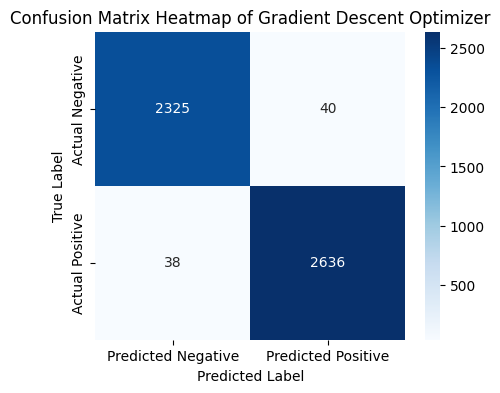

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.98      0.98      0.98      2365
           1       0.99      0.99      0.99      2674

    accuracy                           0.98      5039
   macro avg       0.98      0.98      0.98      5039
weighted avg       0.98      0.98      0.98      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.98


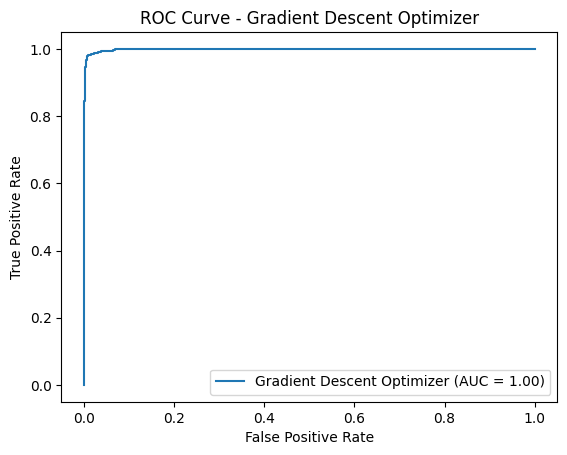

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

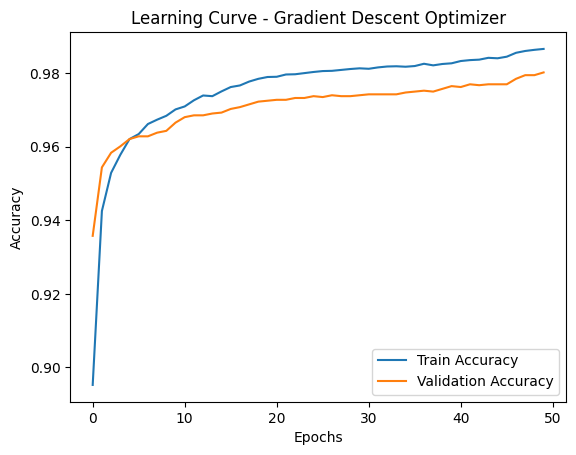

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[ 0.02885771,  0.1537596 ,  0.18887469, ..., -0.21295434,
        -0.28882372,  0.04521888],
       [-0.18452898,  0.27944556, -0.07667649, ..., -0.24076778,
        -0.07496345,  0.04802981],
       [ 0.07832325,  0.22513261,  0.28019544, ..., -0.17266122,
         0.05327418, -0.2111063 ],
       ...,
       [-0.07616062,  0.12092498,  0.11046582, ..., -0.22093633,
        -0.02035847,  0.19404912],
       [ 0.18797353, -0.22740397,  0.24471948, ..., -0.23113458,
         0.19078657,  0.10486794],
       [ 0.27508894,  0.16289827,  0.03431264, ...,  0.01394156,
        -0.02524763, -0.05701491]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[-5.12808561e-03,  8.93867016e-03, -2.49454886e-01,
         2.95470923e-01, -2.12917536e-01,  1.67684466e-01,
         9.20638442e-03, -2.78979510e-01,  3.16810310e-02,
        

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### Nadam

In [ ]:
# Training with Nadam optimizer and logging weights and metrics
optimizer_name="Nadam"
Nadam_ = Nadam(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, Nadam_, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with Nadam optimizer...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.1076, Accuracy = 0.9650
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.0430, Accuracy = 0.9863
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.0326, Accuracy = 0.9891
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.0304, Accuracy = 0.9897
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.0277, Accuracy = 0.9904
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.0253, Accuracy = 0.9913
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.0223, Accuracy = 0.9927
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.0221, Accuracy = 0.9922
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.0203, Accuracy = 0.9931
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.0186, Accuracy = 0.9935
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.0187, Accuracy = 0.9932
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.0170, Accuracy = 0.9937
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.0168, Accuracy = 0.9939
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.0161, Accuracy = 0.9943
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.0177, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for Nadam Optimizer:
--------------------------------------------------
Accuracy: 0.9936495336376265

Precision: 0.9936472346786248

Recall: 0.9943904263275991

F1-Score: 0.9940186915887851

ROC AUC: 0.9993442451862029


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2348   17]
 [  15 2659]]


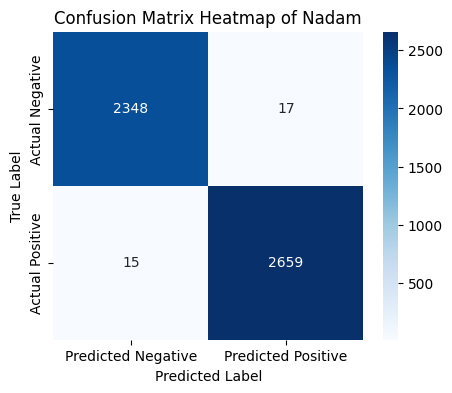

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2365
           1       0.99      0.99      0.99      2674

    accuracy                           0.99      5039
   macro avg       0.99      0.99      0.99      5039
weighted avg       0.99      0.99      0.99      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.99


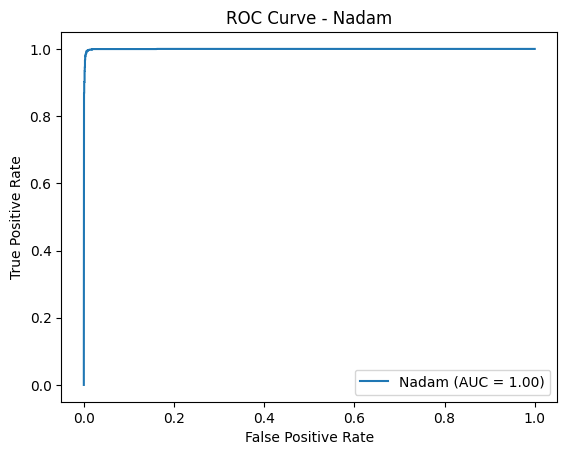

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

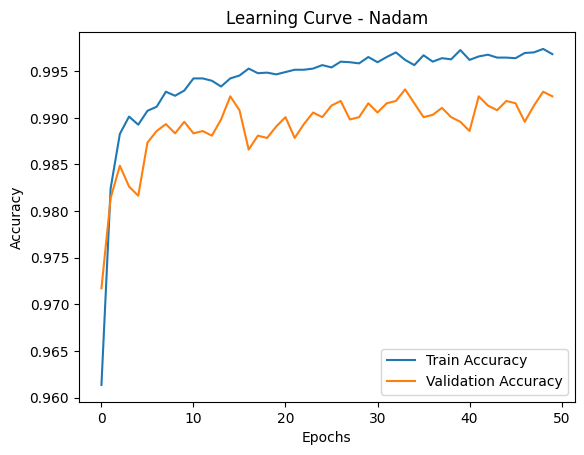

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[ 0.05532074,  0.00149387, -0.14116985, ...,  0.13232997,
         0.24082819, -0.10960197],
       [ 0.23700443, -0.06909885, -0.2886684 , ..., -0.06825764,
        -0.06709202, -0.00441718],
       [ 0.20282239,  0.03548747, -0.0013938 , ..., -0.06934246,
        -0.18452391,  0.02900609],
       ...,
       [ 0.24266472,  0.0642198 , -0.15043724, ..., -0.04843827,
         0.24349758, -0.28239807],
       [ 0.1421336 ,  0.01172423, -0.05247493, ...,  0.17834166,
         0.13403448, -0.141749  ],
       [ 0.23359099,  0.2202802 , -0.11190045, ...,  0.15500689,
         0.15408105, -0.1335317 ]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[ 5.69955111e-02,  1.02334648e-01,  2.37022668e-01,
        -2.47375876e-01, -1.37256429e-01, -1.79600447e-01,
         1.68610424e-01,  1.45766973e-01, -8.17085803e-02,
        

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### Adamax

In [ ]:
# Training with Adamax optimizer and logging weights and metrics
optimizer_name="Adamax"
Adamax_ = Adamax(learning_rate=0.001)
model, history, initial_weights, weights_history = train_model_with_weights(optimizer_name, Adamax_, X_train, y_train)

# Evaluate metrics
y_pred, y_pred_probs = evaluate_metrics(model, X_test, y_test, history, optimizer_name)

# Calculate metrics
accuracy, precision, recall, f1, cm, report, fpr, tpr, roc_auc = calculate_metrics(y_test, y_pred, y_pred_probs)

Training with Adamax optimizer...


/usr/local/lib/python3.11/dist-packages/keras/src/layers/core/dense.py:87: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Epoch 1 - Logged Weights
Epoch 1: Loss = 0.1627, Accuracy = 0.9482
Epoch 2 - Logged Weights
Epoch 2: Loss = 0.0955, Accuracy = 0.9715
Epoch 3 - Logged Weights
Epoch 3: Loss = 0.0814, Accuracy = 0.9744
Epoch 4 - Logged Weights
Epoch 4: Loss = 0.0712, Accuracy = 0.9767
Epoch 5 - Logged Weights
Epoch 5: Loss = 0.0633, Accuracy = 0.9771
Epoch 6 - Logged Weights
Epoch 6: Loss = 0.0566, Accuracy = 0.9795
Epoch 7 - Logged Weights
Epoch 7: Loss = 0.0506, Accuracy = 0.9824
Epoch 8 - Logged Weights
Epoch 8: Loss = 0.0463, Accuracy = 0.9857
Epoch 9 - Logged Weights
Epoch 9: Loss = 0.0429, Accuracy = 0.9864
Epoch 10 - Logged Weights
Epoch 10: Loss = 0.0404, Accuracy = 0.9885
Epoch 11 - Logged Weights
Epoch 11: Loss = 0.0383, Accuracy = 0.9885
Epoch 12 - Logged Weights
Epoch 12: Loss = 0.0363, Accuracy = 0.9896
Epoch 13 - Logged Weights
Epoch 13: Loss = 0.0351, Accuracy = 0.9892
Epoch 14 - Logged Weights
Epoch 14: Loss = 0.0337, Accuracy = 0.9896
Epoch 15 - Logged Weights
Epoch 15: Loss = 0.0325, A

In [ ]:
# Print metrics
print(f"\nResults for {optimizer_name} Optimizer:")
print("-"*50)
print(f"Accuracy: {accuracy}\n\nPrecision: {precision}\n\nRecall: {recall}\n\nF1-Score: {f1}\n")
print(f"ROC AUC: {roc_auc}")


Results for Nadam Optimizer:
--------------------------------------------------
Accuracy: 0.9926572732685056

Precision: 0.9954904171364148

Recall: 0.9906507105459985

F1-Score: 0.9930646672914715

ROC AUC: 0.9987621777954176


In [ ]:
# confusion matrix
print(f"Confusion Matrix:\n{cm}")

Confusion Matrix:
[[2353   12]
 [  25 2649]]


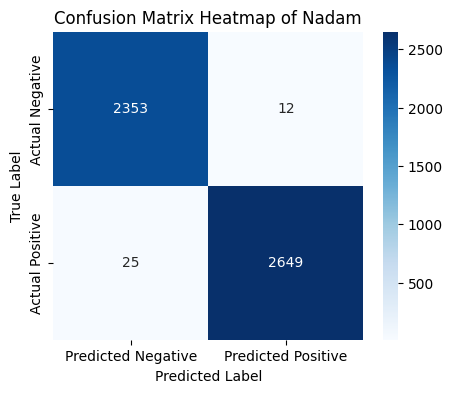

In [ ]:
# heatmap of confusion matrix
plot_confusion_matrix(cm, optimizer_name)

In [ ]:
#classification report
print(f"Classification Report:\n{report}")

Classification Report:
              precision    recall  f1-score   support

           0       0.99      0.99      0.99      2365
           1       1.00      0.99      0.99      2674

    accuracy                           0.99      5039
   macro avg       0.99      0.99      0.99      5039
weighted avg       0.99      0.99      0.99      5039



In [ ]:
# Evaluate the model on the test set
test_loss, test_accuracy = model.evaluate(X_test, y_test, verbose=0)
print(f"Test Accuracy: {test_accuracy:.2f}")

Test Accuracy: 0.99


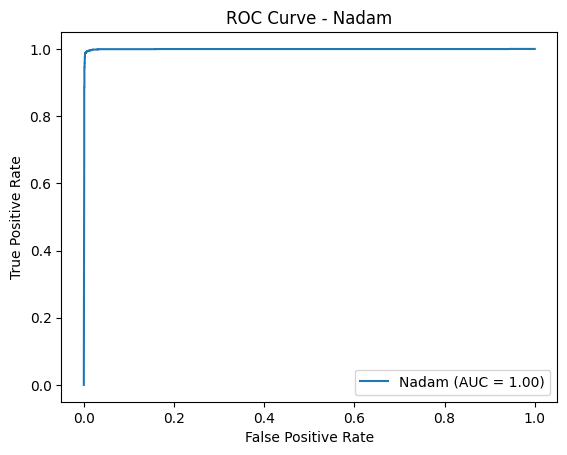

In [ ]:
# Plot roc curve
plot_roc_curve(optimizer_name, fpr, tpr, roc_auc)

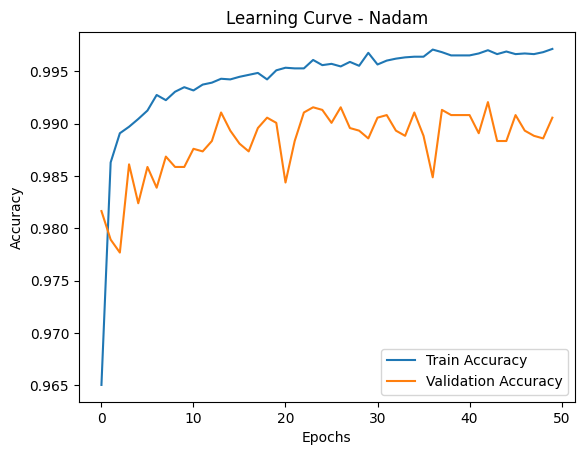

In [ ]:
# Plot learning curve
plot_learning_curve(history, optimizer_name)

In [ ]:
# Display initial and final weights
print("Initial Weights:", initial_weights)
print("Final Weights:", weights_history[-1])  # Weights after the last epoch

Initial Weights: [[array([[ 0.16185483,  0.15120682,  0.20942071, ...,  0.08661532,
        -0.21143863,  0.1650711 ],
       [-0.22815078,  0.16635337,  0.2501203 , ..., -0.2733082 ,
        -0.18923122,  0.1055297 ],
       [-0.13874662, -0.07964906,  0.11179572, ..., -0.21490669,
         0.11874315,  0.12478256],
       ...,
       [ 0.23407093, -0.2387624 , -0.06328185, ...,  0.10872281,
         0.0076285 , -0.11401485],
       [ 0.12044883,  0.03598395, -0.01986799, ...,  0.07118532,
         0.00355476, -0.01336545],
       [-0.05212685,  0.13917154,  0.22712788, ...,  0.05880001,
         0.14775354, -0.13657019]], dtype=float32), array([0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.,
       0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0., 0.],
      dtype=float32)], [array([[-0.23088413,  0.31678525,  0.19200131,  0.11982501,  0.056678  ,
         0.17746529,  0.1233061 , -0.06159955,  0.22621307, -0.34120083,
        -0.26769873, -0.33154202, -0.01

In [ ]:
# adding all the data to data frame
models.append(optimizer_name)
accuracys.append(accuracy)
precisions.append(precision)
recalls.append(recall)
f1_scores.append(f1)

### comparation

In [ ]:
# Create a DataFrame
metrices = {
    "Model": models,
    "Accuracy": accuracys,
    "Precision": precisions,
    "Recall": recalls,
    "F1-Score": f1_scores
}
df = pd.DataFrame(metrices)

In [ ]:
df

,Model,Accuracy,Precision,Recall,F1-Score
0,Adam,0.992062,0.996232,0.988781,0.992492
1,RMSprop,0.992260,0.992155,0.993269,0.992712
2,Adagrad,0.972812,0.963464,0.986163,0.974681
3,Adadelta,0.944235,0.953735,0.940539,0.947091
4,FTRL,0.966462,0.957284,0.980553,0.968779
5,Gradient Descent Optimizer,0.984521,0.985052,0.985789,0.985421
6,Nadam,0.993650,0.993647,0.994390,0.994019
7,Adamax,0.992459,0.992158,0.993642,0.992900
8,Nadam,0.992657,0.995490,0.990651,0.993065


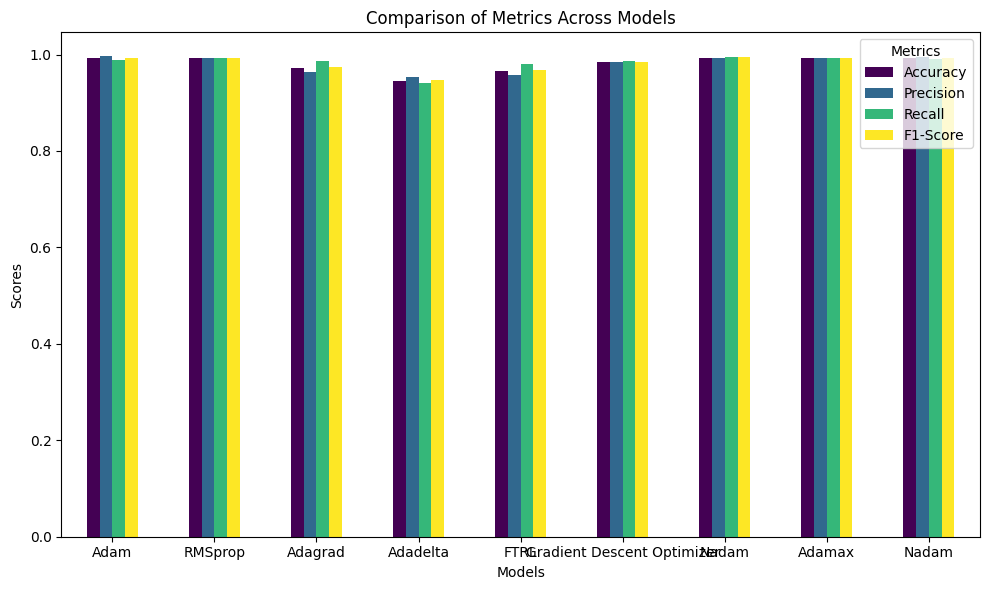

In [ ]:
# Plot Bar Graph
df.set_index("Model").plot(kind="bar", figsize=(10, 6), colormap="viridis")
plt.title("Comparison of Metrics Across Models")
plt.ylabel("Scores")
plt.xlabel("Models")
plt.legend(title="Metrics")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

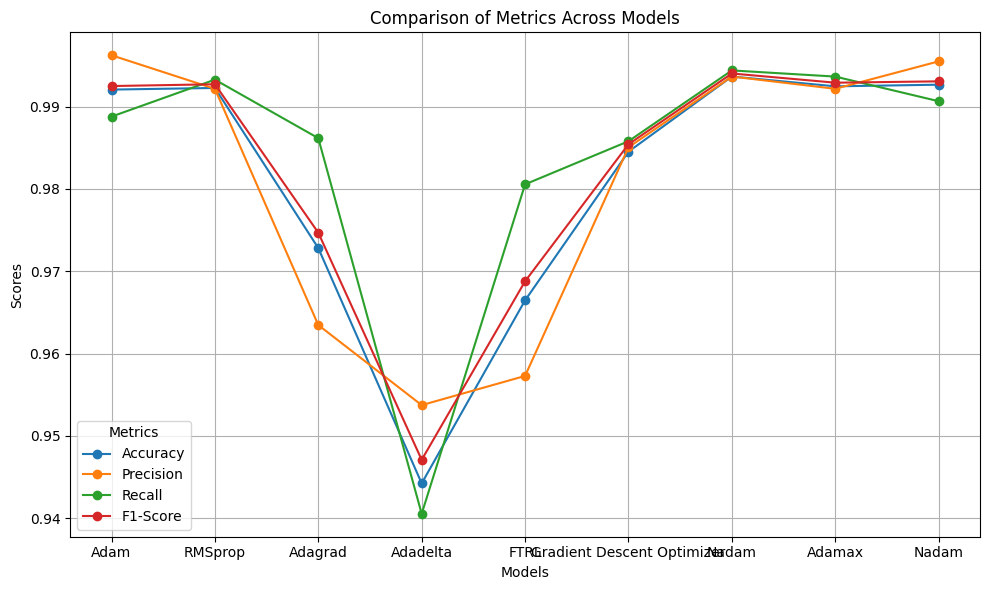

In [ ]:
# Step 3: Plot Line Graph
df.set_index("Model").plot(kind="line", figsize=(10, 6), marker="o")
plt.title("Comparison of Metrics Across Models")
plt.ylabel("Scores")
plt.xlabel("Models")
plt.legend(title="Metrics")
plt.grid(True)
plt.tight_layout()
plt.show()

# results

### comparation 1 (with batch_size=32)

In [ ]:
df

,Model,Accuracy,Precision,Recall,F1-Score
0,Adam,0.993848,0.995872,0.992521,0.994194
1,RMSprop,0.988887,0.994709,0.984293,0.989474
2,Adagrad,0.970828,0.962651,0.983171,0.972803
3,Adadelta,0.879738,0.853625,0.933433,0.891747
4,FTRL,0.530661,0.530661,1.000000,0.693375
5,Gradient Descent Optimizer,0.973209,0.966214,0.983919,0.974986
6,Nadam,0.992062,0.995485,0.989529,0.992498
7,Adamax,0.990673,0.993983,0.988407,0.991187


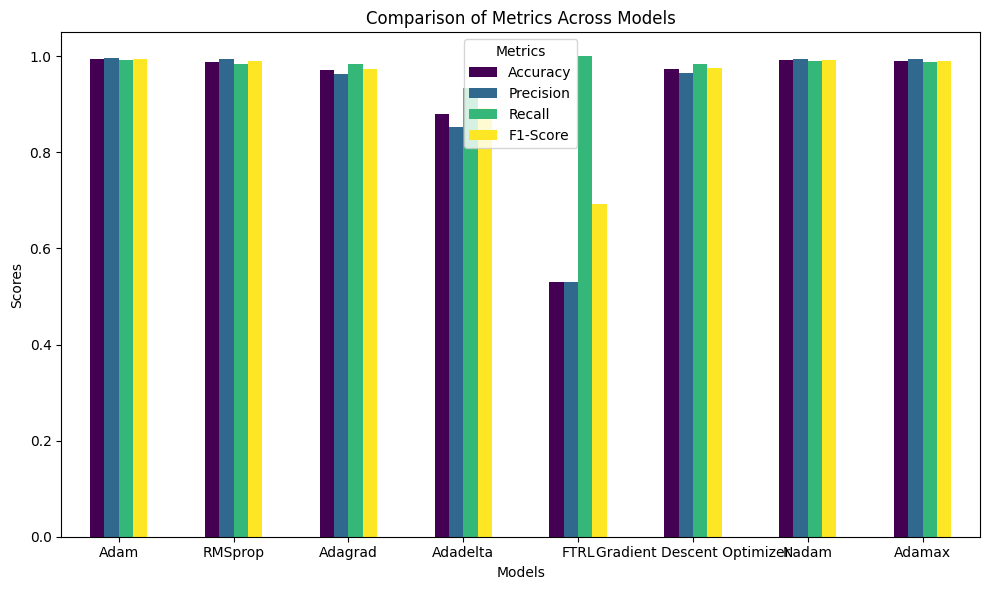

In [ ]:
# Plot Bar Graph
df.set_index("Model").plot(kind="bar", figsize=(10, 6), colormap="viridis")
plt.title("Comparison of Metrics Across Models")
plt.ylabel("Scores")
plt.xlabel("Models")
plt.legend(title="Metrics")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

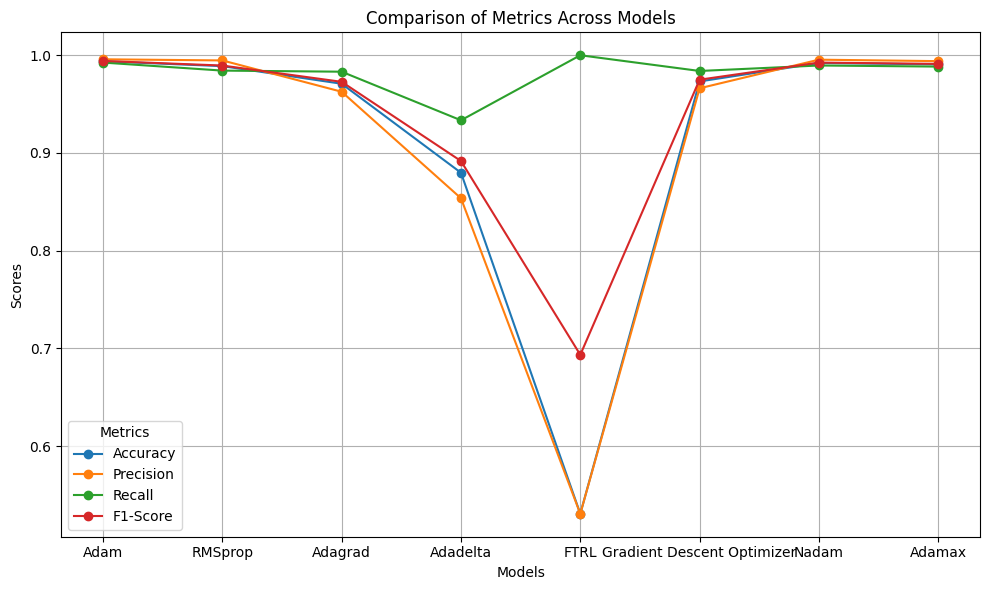

In [ ]:
# Step 3: Plot Line Graph
df.set_index("Model").plot(kind="line", figsize=(10, 6), marker="o")
plt.title("Comparison of Metrics Across Models")
plt.ylabel("Scores")
plt.xlabel("Models")
plt.legend(title="Metrics")
plt.grid(True)
plt.tight_layout()
plt.show()

### comparation 2 (with batch_size=16)

In [ ]:
df

,Model,Accuracy,Precision,Recall,F1-Score
0,Adam,0.991665,0.996604,0.987659,0.992111
1,RMSprop,0.991268,0.995105,0.988407,0.991745
2,Adagrad,0.970629,0.959942,0.985789,0.972694
3,Adadelta,0.895813,0.912476,0.888930,0.900549
4,FTRL,0.962493,0.957643,0.972326,0.964929
5,Gradient Descent Optimizer,0.978369,0.974473,0.985041,0.979728
6,Nadam,0.991665,0.994737,0.989529,0.992126
7,Adamax,0.990276,0.992495,0.989155,0.990822


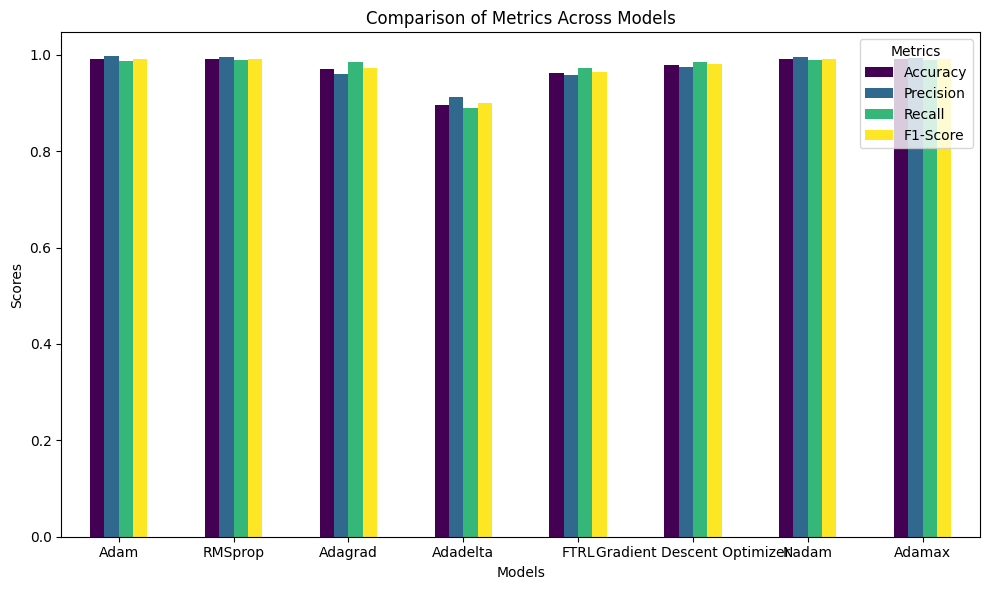

In [ ]:
# Plot Bar Graph
df.set_index("Model").plot(kind="bar", figsize=(10, 6), colormap="viridis")
plt.title("Comparison of Metrics Across Models")
plt.ylabel("Scores")
plt.xlabel("Models")
plt.legend(title="Metrics")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

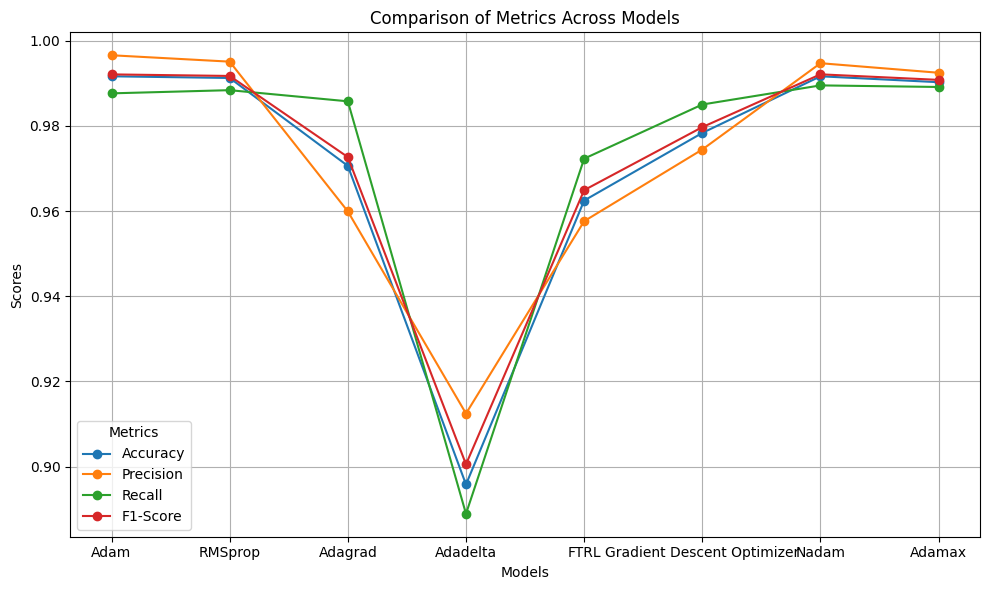

In [ ]:
# Step 3: Plot Line Graph
df.set_index("Model").plot(kind="line", figsize=(10, 6), marker="o")
plt.title("Comparison of Metrics Across Models")
plt.ylabel("Scores")
plt.xlabel("Models")
plt.legend(title="Metrics")
plt.grid(True)
plt.tight_layout()
plt.show()

### comparation 3 (with batch_size=32)

In [ ]:
# Create a DataFrame
metrices = {
    "Model": models,
    "Accuracy": accuracys,
    "Precision": precisions,
    "Recall": recalls,
    "F1-Score": f1_scores
}
df = pd.DataFrame(metrices)

In [ ]:
df

,Model,Accuracy,Precision,Recall,F1-Score
0,Adam,0.992459,0.995862,0.989903,0.992873
1,RMSprop,0.992062,0.994741,0.990277,0.992504
2,Adagrad,0.967057,0.955338,0.983919,0.969418
3,Adadelta,0.907918,0.949919,0.872476,0.909552
4,FTRL,0.530661,0.530661,1.000000,0.693375
5,Gradient Descent Optimizer,0.975392,0.967718,0.986537,0.977037
6,Nadam,0.989879,0.996969,0.983919,0.990401
7,Adamax,0.990276,0.992865,0.988781,0.990819


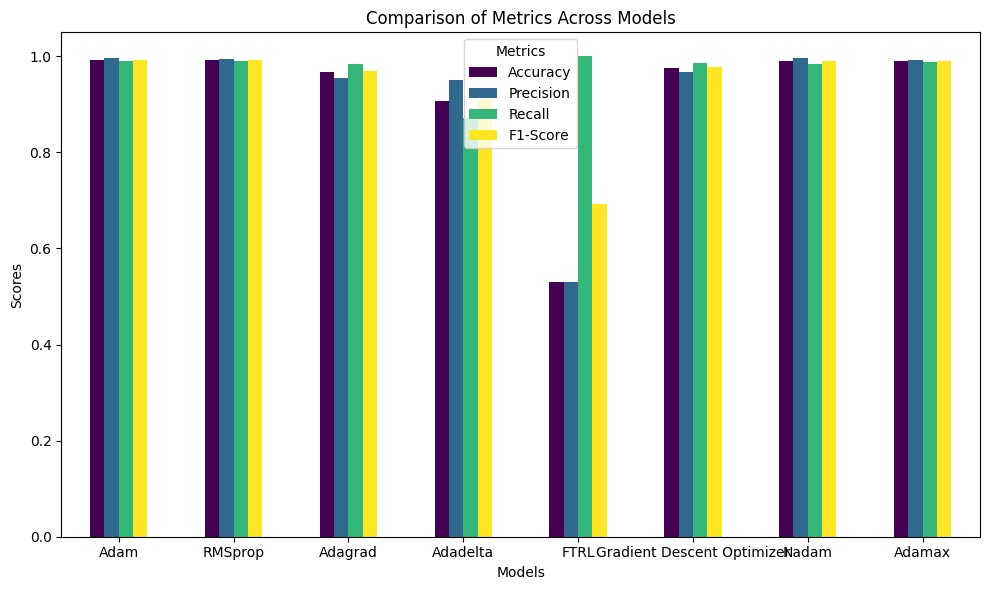

In [ ]:
# Plot Bar Graph
df.set_index("Model").plot(kind="bar", figsize=(10, 6), colormap="viridis")
plt.title("Comparison of Metrics Across Models")
plt.ylabel("Scores")
plt.xlabel("Models")
plt.legend(title="Metrics")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

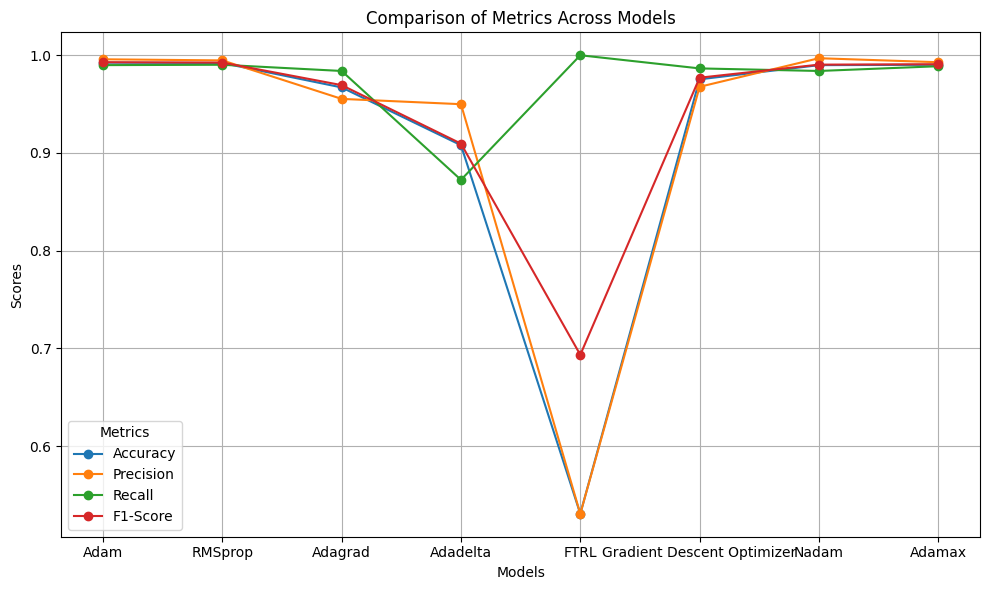

In [ ]:
# Step 3: Plot Line Graph
df.set_index("Model").plot(kind="line", figsize=(10, 6), marker="o")
plt.title("Comparison of Metrics Across Models")
plt.ylabel("Scores")
plt.xlabel("Models")
plt.legend(title="Metrics")
plt.grid(True)
plt.tight_layout()
plt.show()

### comparation 4 (with batch_size=8)

In [ ]:
# Create a DataFrame
metrices = {
    "Model": models,
    "Accuracy": accuracys,
    "Precision": precisions,
    "Recall": recalls,
    "F1-Score": f1_scores
}
df = pd.DataFrame(metrices)

In [ ]:
df

,Model,Accuracy,Precision,Recall,F1-Score
0,Adam,0.992062,0.996232,0.988781,0.992492
1,RMSprop,0.992260,0.992155,0.993269,0.992712
2,Adagrad,0.972812,0.963464,0.986163,0.974681
3,Adadelta,0.944235,0.953735,0.940539,0.947091
4,FTRL,0.966462,0.957284,0.980553,0.968779
5,Gradient Descent Optimizer,0.984521,0.985052,0.985789,0.985421
6,Nadam,0.993650,0.993647,0.994390,0.994019
7,Adamax,0.992459,0.992158,0.993642,0.992900
8,Nadam,0.992657,0.995490,0.990651,0.993065


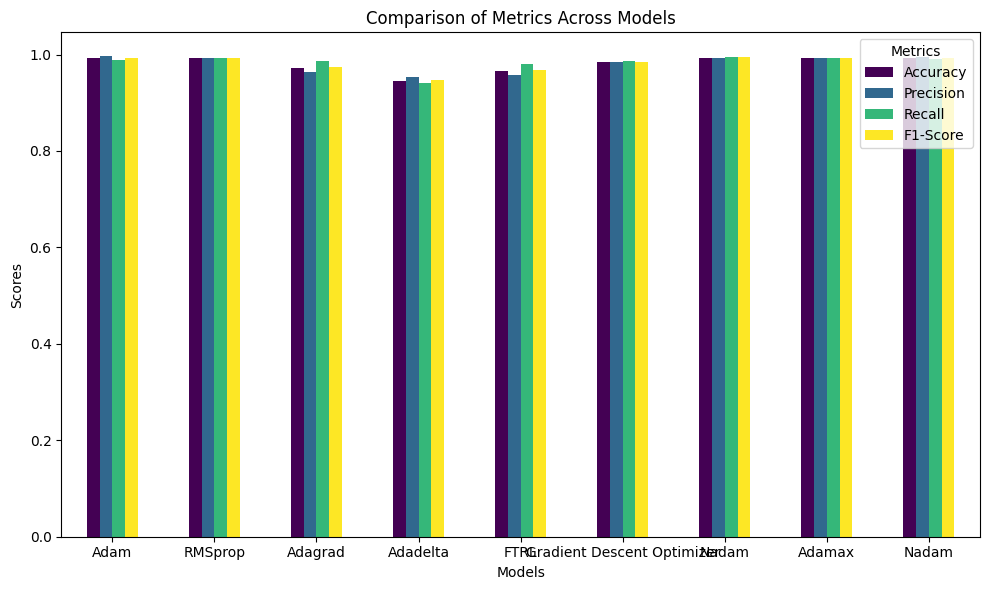

In [ ]:
# Plot Bar Graph
df.set_index("Model").plot(kind="bar", figsize=(10, 6), colormap="viridis")
plt.title("Comparison of Metrics Across Models")
plt.ylabel("Scores")
plt.xlabel("Models")
plt.legend(title="Metrics")
plt.xticks(rotation=0)
plt.tight_layout()
plt.show()

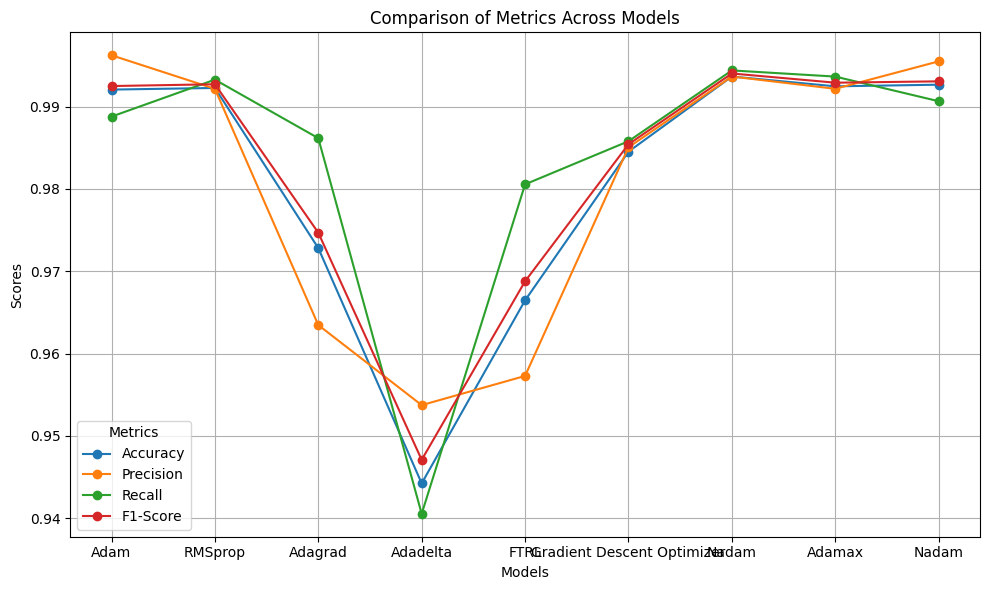

In [ ]:
# Step 3: Plot Line Graph
df.set_index("Model").plot(kind="line", figsize=(10, 6), marker="o")
plt.title("Comparison of Metrics Across Models")
plt.ylabel("Scores")
plt.xlabel("Models")
plt.legend(title="Metrics")
plt.grid(True)
plt.tight_layout()
plt.show()